In [1]:
"""
ARIMA runner:
- Loads satellite orbital-element CSVs and cleaned manoeuvre timestamps
- Preprocesses (drop first 30 pts, daily interpolation)
- Runs ARIMA on raw, smoothed, and conditionally on cleaned data
- Generates PR curves (±3, ±5 days) and logs best metrics
- Saves AIC tables, diagnostics, PR plots, and forecast+residual figures
Outputs:
  ../arima_logs/ (AIC tables, PR curve CSVs, pr_summary.csv)
  ../images/arima/{diagnostics,forecast,prplots}/...
"""

import sys
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 


# Utilities
sys.path.append("../utils")
import forecasting_arima_tools as fat
import precision_recall_tools as prt

np.random.seed(42)

# Global plot style
plt.rcParams.update({
    'font.family': 'Times New Roman',
    'font.size': 16,
    'axes.titlesize': 16,
    'axes.labelsize': 15,
    'xtick.labelsize': 15,
    'ytick.labelsize': 15,
    'legend.fontsize': 15
})

# Satellite list
satellites = [
    {
        "name": "Sentinel-3A",
        "csv_path": "../satellite_data/orbital_elements/Sentinel-3A.csv",
        "maneuver_csv": "../satellite_data/cleaned_man/cleaned_man_s3aman.csv",
        "date_range": ("2021-01-01", "2021-06-30")
    },
    
    {
        "name": "Fengyun-2F",
        "csv_path": "../satellite_data/orbital_elements/Fengyun-2F.csv",
        "maneuver_csv": "../satellite_data/cleaned_man/cleaned_man_manFY2F.csv",
        "date_range": ("2021-01-01", "2021-06-30")
    },
    
    {
        "name": "Fengyun-4A",
        "csv_path": "../satellite_data/orbital_elements/Fengyun-4A.csv",
        "maneuver_csv": "../satellite_data/cleaned_man/cleaned_man_manFY4A.csv",
        "date_range": ("2020-01-01", "2020-06-30")
    },
    {
        "name": "SARAL",
        "csv_path": "../satellite_data/orbital_elements/SARAL.csv",
        "maneuver_csv": "../satellite_data/cleaned_man/cleaned_man_srlman.csv",
        "date_range": ("2015-01-01", "2015-06-30")
    },
    {
        "name": "Haiyang-2A",
        "csv_path": "../satellite_data/orbital_elements/Haiyang-2A.csv",
        "maneuver_csv": "../satellite_data/cleaned_man/cleaned_man_h2aman.csv",
        "date_range": ("2018-01-01", "2018-06-30")
    }
]

# Orbital elements to forecast
features_to_forecast = [
    "Brouwer mean motion",
    "mean anomaly",
    "eccentricity"
]

# Paths
output_path = "../images"
log_folder = "../arima_logs"
summary_log_path = "../arima_logs/pr_summary.csv"


os.makedirs(log_folder, exist_ok=True)
outlier_overlap_log = os.path.join(log_folder, "outlier_overlap_log.csv")
aic_log_raw = os.path.join(log_folder, "aic_gridsearch_raw.csv")
aic_log_cleaned = os.path.join(log_folder, "aic_gridsearch_cleaned.csv")
aic_log_diff = os.path.join(log_folder, "aic_gridsearch_diff.csv")


# Initialize CSVs

if not os.path.exists(outlier_overlap_log):
    with open(outlier_overlap_log, 'w') as f:
        f.write("Satellite,Feature,Outliers_Flagged,Outliers_Overlapping_with_Manoeuvres\n")

if not os.path.exists(aic_log_raw):
    with open(aic_log_raw, "w") as f:
        f.write("Satellite,Feature,p,d,q,AIC\n")

if not os.path.exists(aic_log_cleaned):
    with open(aic_log_cleaned, "w") as f:
        f.write("Satellite,Feature,p,d,q,AIC\n")



==Forecasting and Anomaly Detection: Sentinel-3A | Brouwer mean motion ==


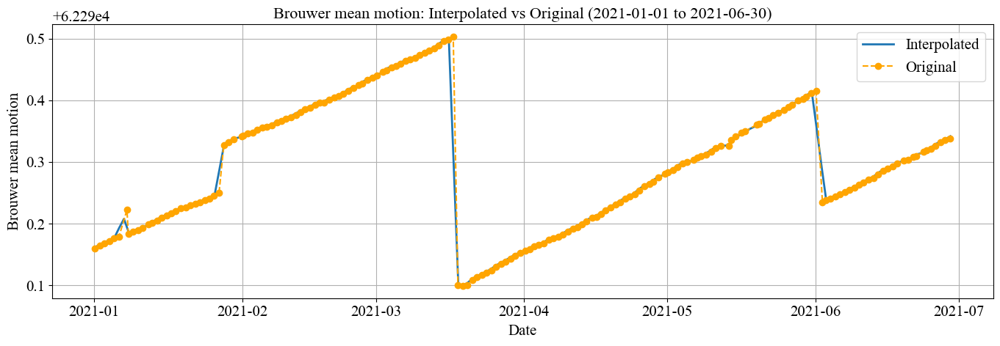

ADF p-value (d=0): 0.00000
Series is stationary at d=0
Best ARIMA Order: (1, 0, 4), AIC: -11411.88, Models Tried: 45, Time: 102.3s


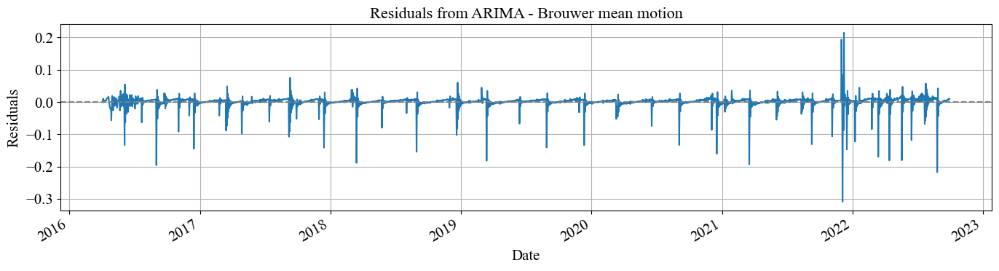

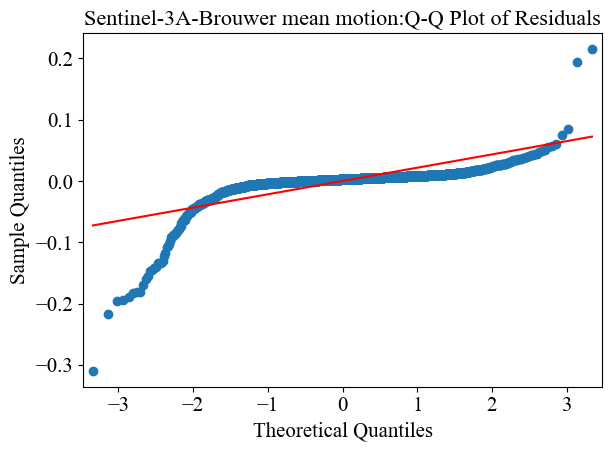


[RAW] Computing PR Curve - Sentinel-3A | Brouwer mean motion | ±3 days


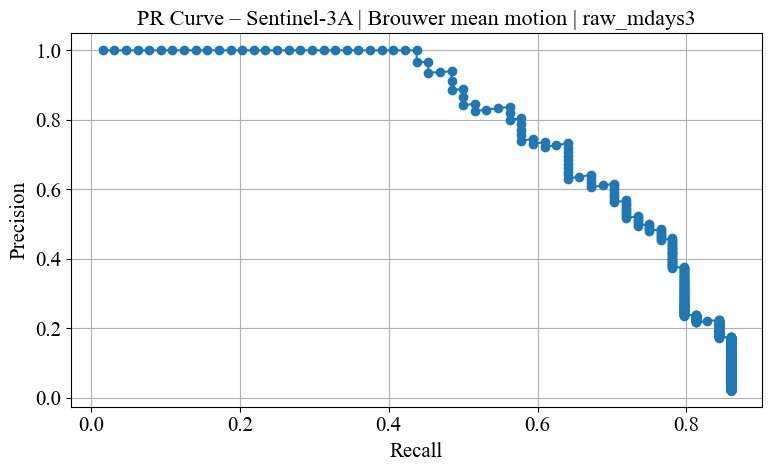

[RAW] | mdays=3 | Threshold=0.0342 | P=0.49 | R=0.77 | F1=0.59 | F2=0.69
[RAW] TP=49, FP=52, FN=15

[RAW] Computing PR Curve - Sentinel-3A | Brouwer mean motion | ±5 days


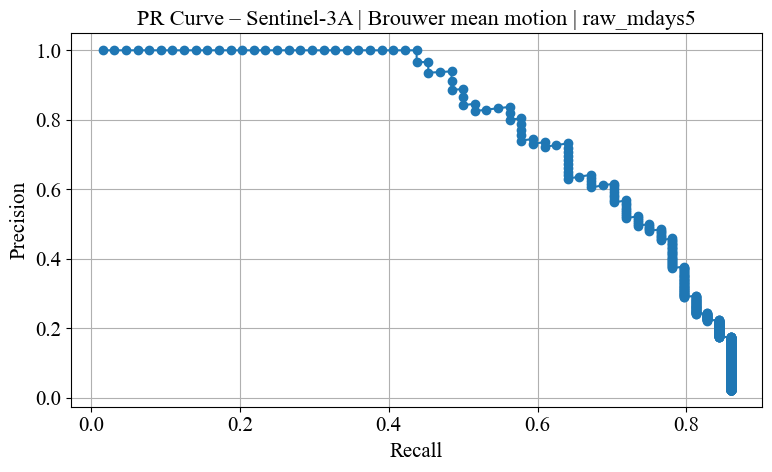

[RAW] | mdays=5 | Threshold=0.0342 | P=0.49 | R=0.77 | F1=0.59 | F2=0.69
[RAW] TP=49, FP=52, FN=15

[RAW] Using BEST mdays = ±3 for anomaly detection (F2 = 0.69)


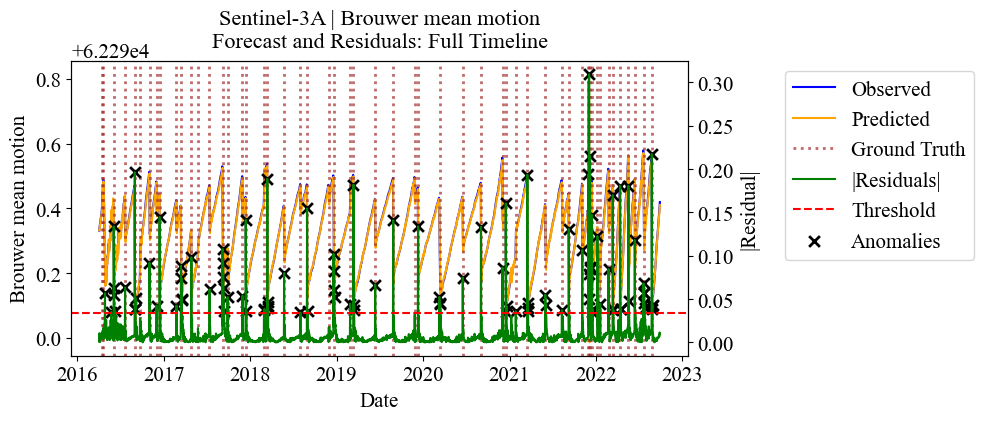

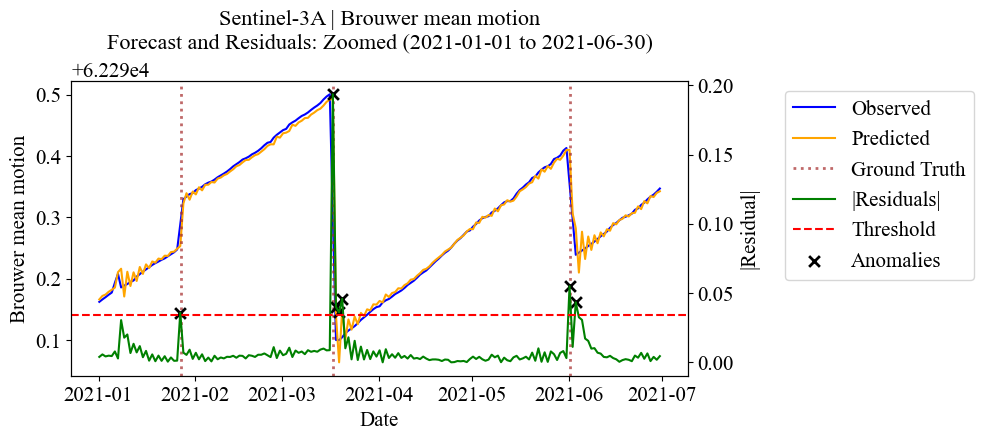


[SMOOTHED] Running smoothed ARIMA on Sentinel-3A | Brouwer mean motion
ADF p-value (d=0): 0.00000
Series is stationary at d=0
Best ARIMA Order: (2, 0, 14), AIC: -20508.51, Models Tried: 70, Time: 177.7s


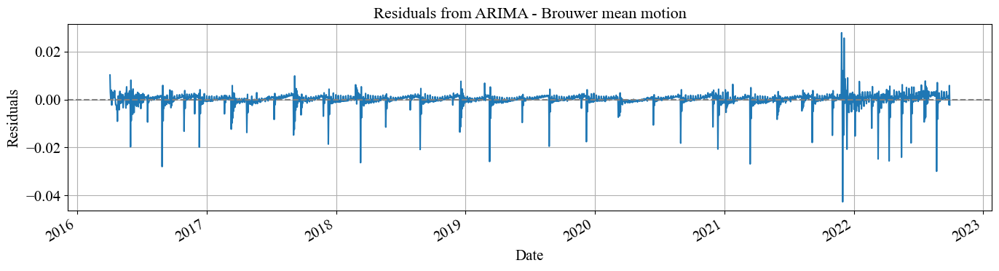

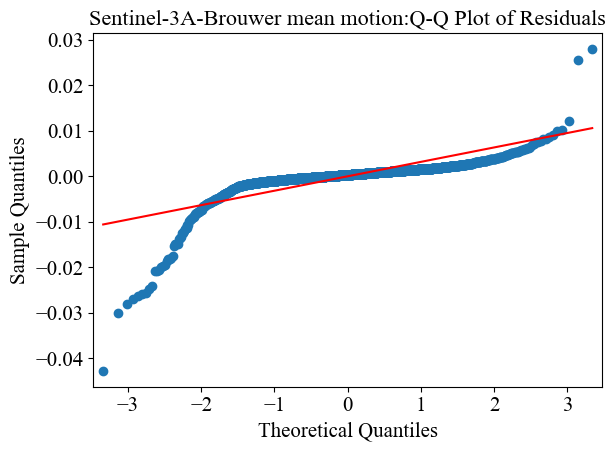


[SMOOTHED] Computing PR Curve – Sentinel-3A | Brouwer mean motion | ±3 days


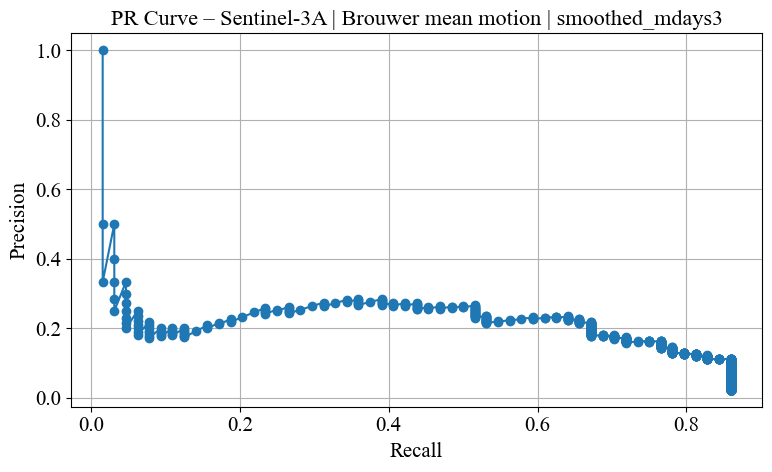

[SMOOTHED] | mdays=3 | Threshold=0.0036 | P=0.23 | R=0.66 | F1=0.34 | F2=0.48
[SMOOTHED] TP=42, FP=143, FN=22

[SMOOTHED] Computing PR Curve – Sentinel-3A | Brouwer mean motion | ±5 days


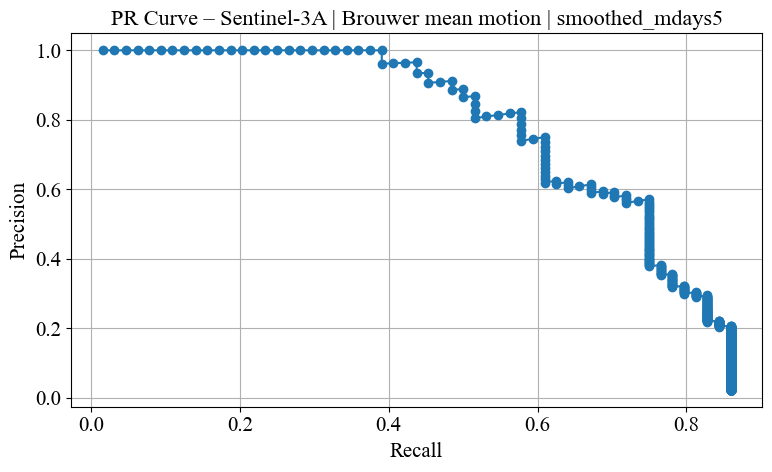

[SMOOTHED] | mdays=5 | Threshold=0.0060 | P=0.57 | R=0.75 | F1=0.65 | F2=0.71
[SMOOTHED] TP=48, FP=36, FN=16

[SMOOTHED] Using BEST mdays = ±5 for anomaly detection (F2 = 0.71)


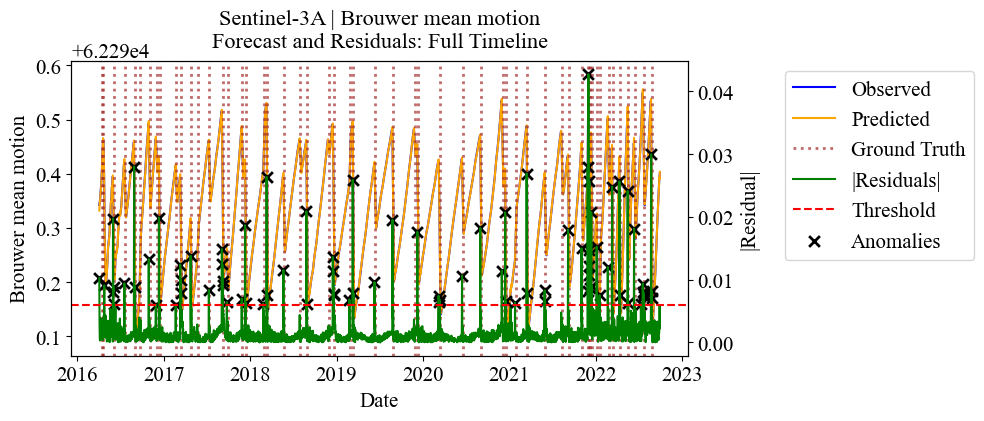

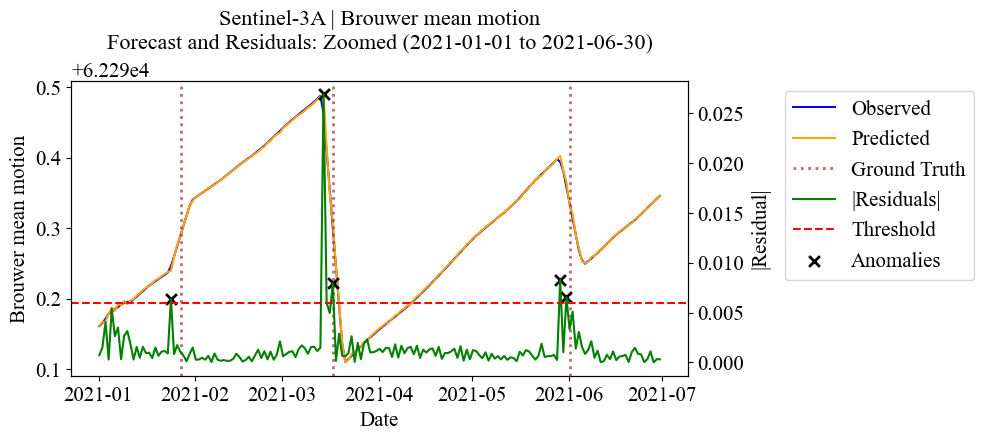

Brouwer mean motion: 0 outliers flagged
Total interpolated outliers: 0
No outliers found: skipping cleaned ARIMA for Sentinel-3A | Brouwer mean motion

==Forecasting and Anomaly Detection: Sentinel-3A | mean anomaly ==


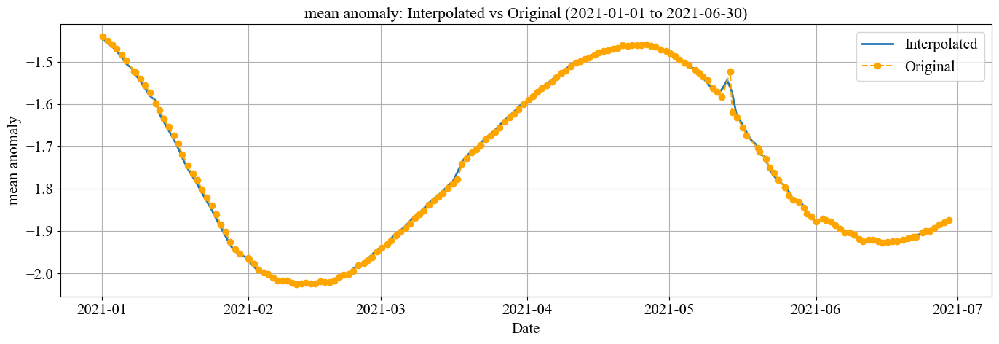

ADF p-value (d=0): 0.00000
Series is stationary at d=0
Best ARIMA Order: (4, 0, 7), AIC: -13087.43, Models Tried: 93, Time: 292.8s


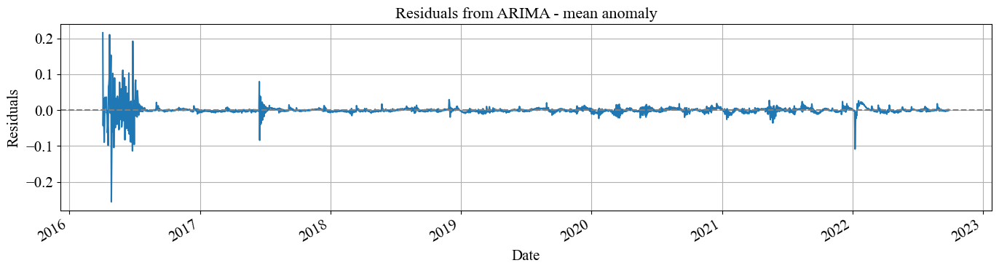

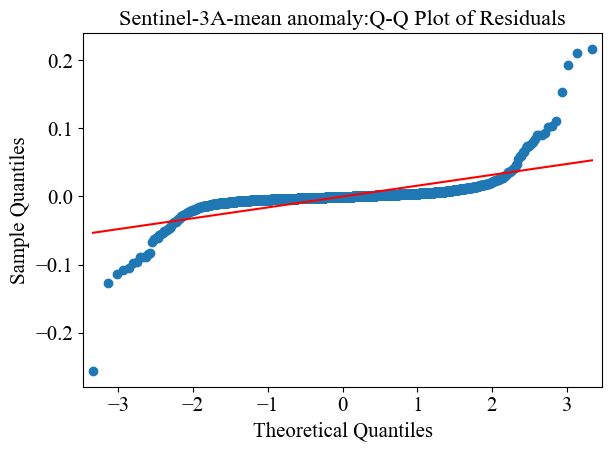


[RAW] Computing PR Curve - Sentinel-3A | mean anomaly | ±3 days


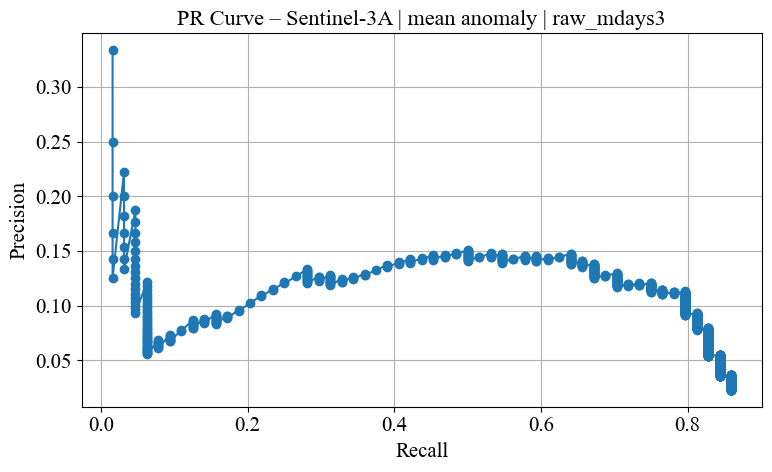

[RAW] | mdays=3 | Threshold=0.0097 | P=0.15 | R=0.64 | F1=0.24 | F2=0.38
[RAW] TP=41, FP=237, FN=23

[RAW] Computing PR Curve - Sentinel-3A | mean anomaly | ±5 days


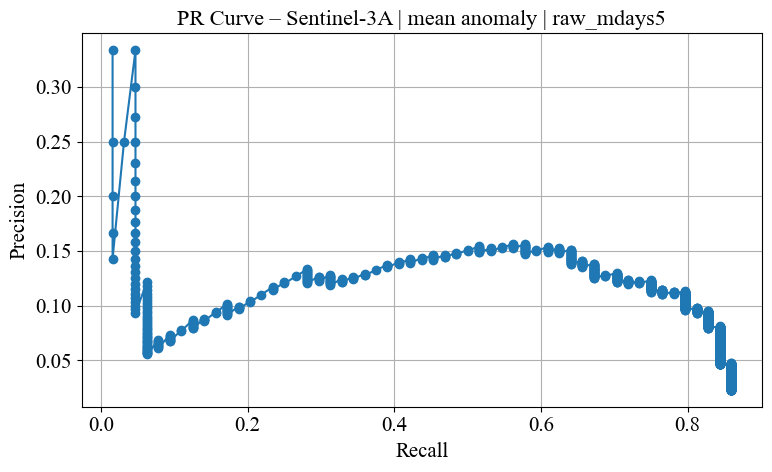

[RAW] | mdays=5 | Threshold=0.0099 | P=0.15 | R=0.64 | F1=0.24 | F2=0.39
[RAW] TP=41, FP=230, FN=23

[RAW] Using BEST mdays = ±5 for anomaly detection (F2 = 0.39)


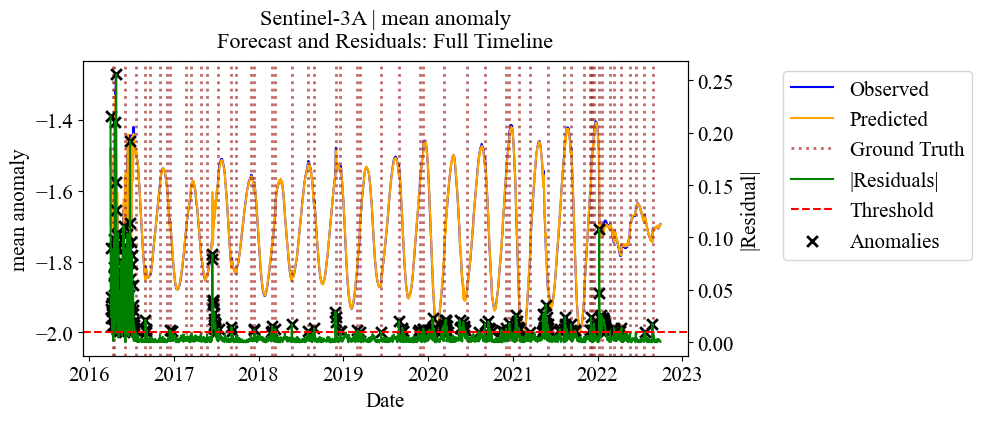

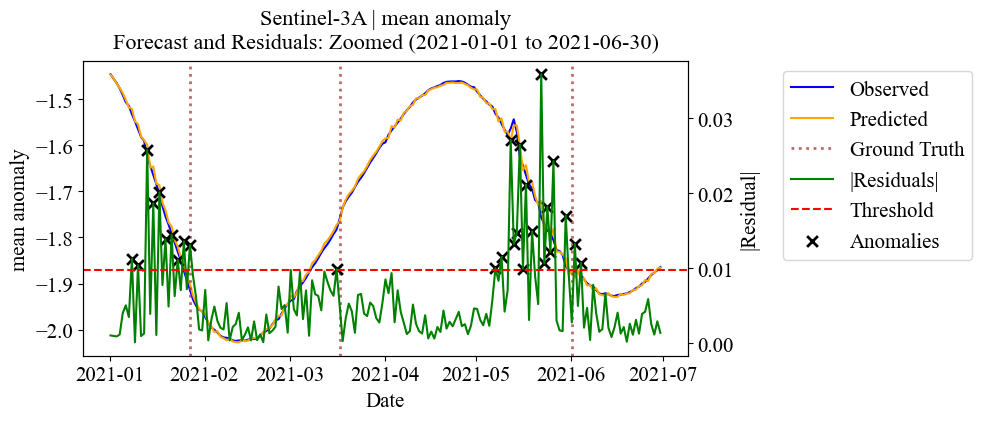


[SMOOTHED] Running smoothed ARIMA on Sentinel-3A | mean anomaly
ADF p-value (d=0): 0.00000
Series is stationary at d=0
Best ARIMA Order: (3, 0, 10), AIC: -21972.31, Models Tried: 81, Time: 226.9s


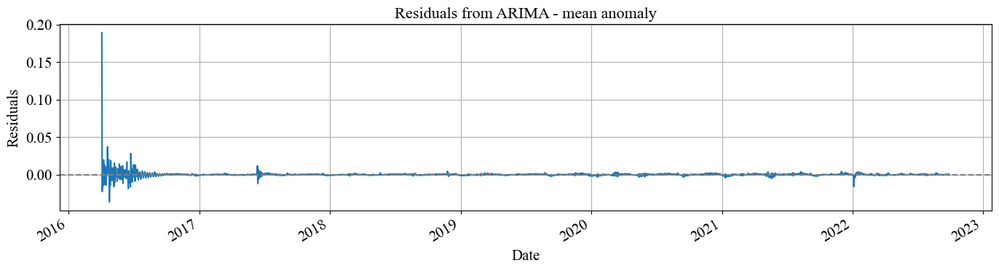

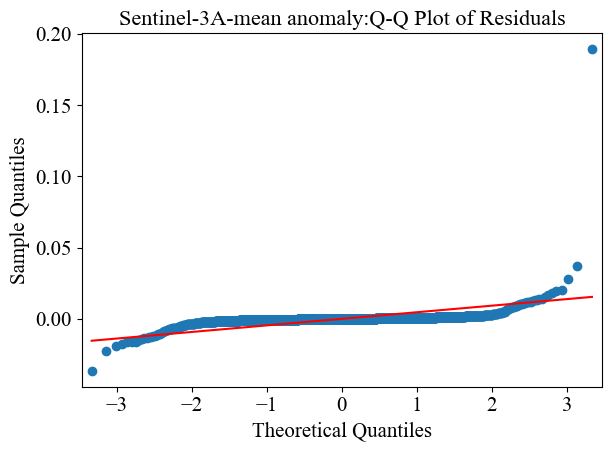


[SMOOTHED] Computing PR Curve – Sentinel-3A | mean anomaly | ±3 days


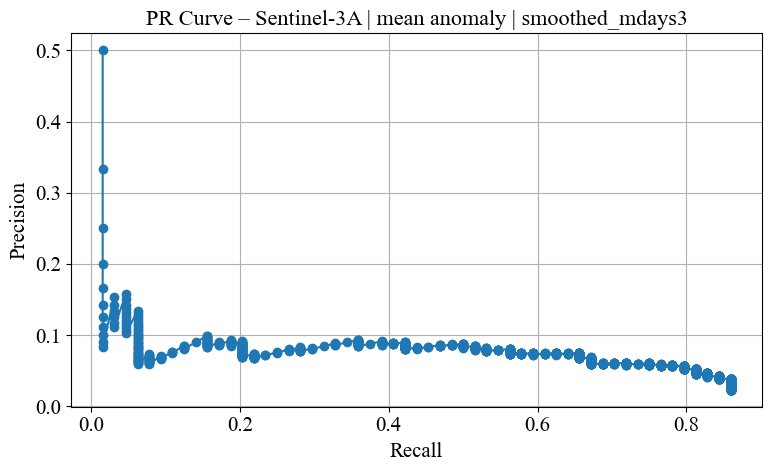

[SMOOTHED] | mdays=3 | Threshold=0.0012 | P=0.09 | R=0.50 | F1=0.15 | F2=0.26
[SMOOTHED] TP=32, FP=332, FN=32

[SMOOTHED] Computing PR Curve – Sentinel-3A | mean anomaly | ±5 days


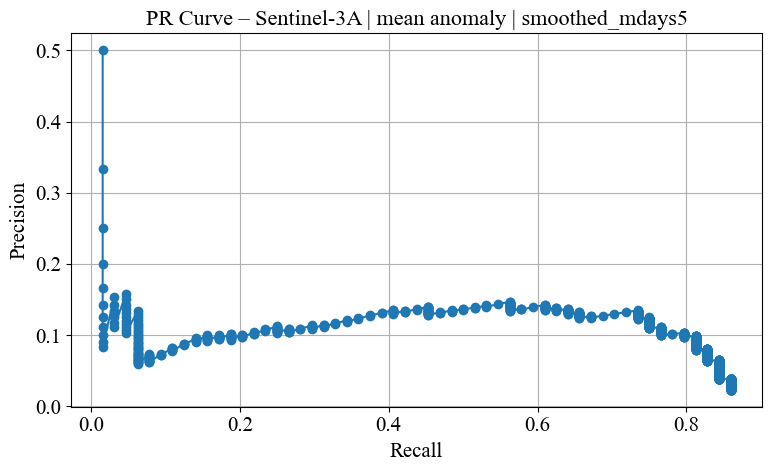

[SMOOTHED] | mdays=5 | Threshold=0.0013 | P=0.13 | R=0.73 | F1=0.23 | F2=0.39
[SMOOTHED] TP=47, FP=302, FN=17

[SMOOTHED] Using BEST mdays = ±5 for anomaly detection (F2 = 0.39)


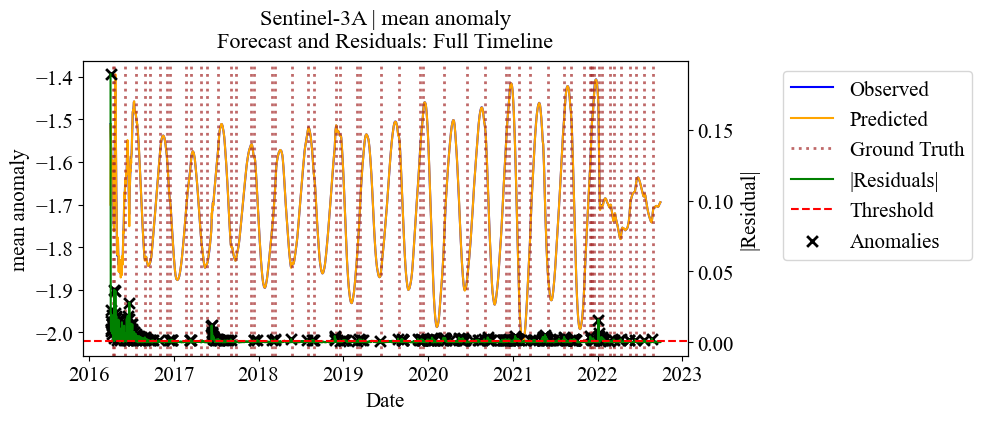

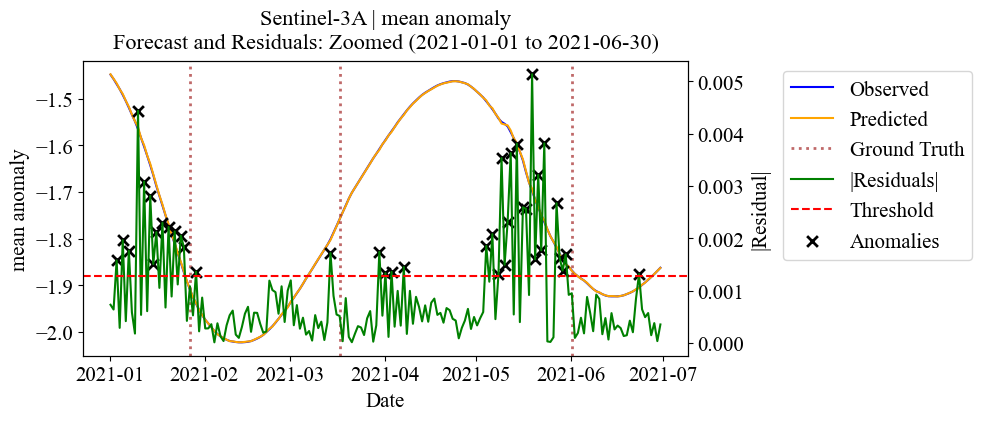

mean anomaly: 0 outliers flagged
Total interpolated outliers: 0
No outliers found: skipping cleaned ARIMA for Sentinel-3A | mean anomaly

==Forecasting and Anomaly Detection: Sentinel-3A | eccentricity ==


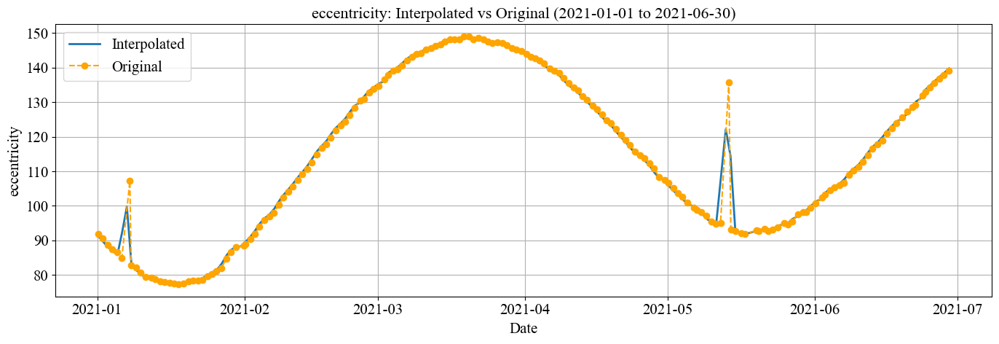

ADF p-value (d=0): 0.00000
Series is stationary at d=0
Best ARIMA Order: (2, 0, 10), AIC: 9779.35, Models Tried: 66, Time: 116.5s


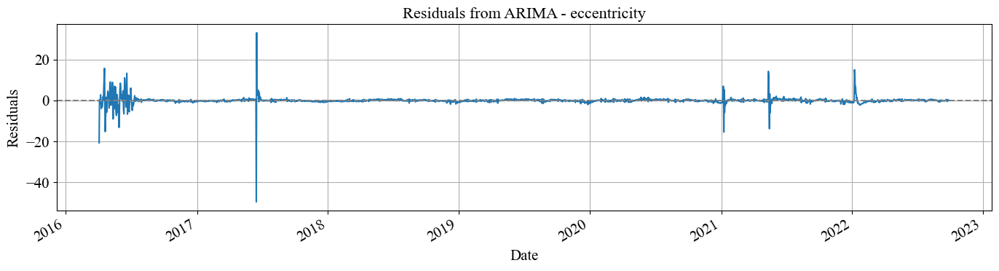

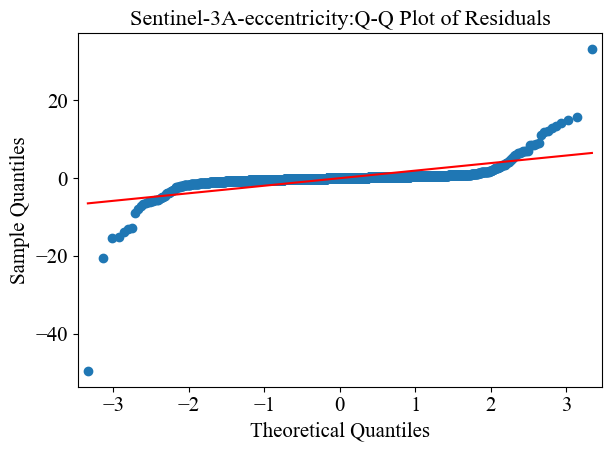


[RAW] Computing PR Curve - Sentinel-3A | eccentricity | ±3 days


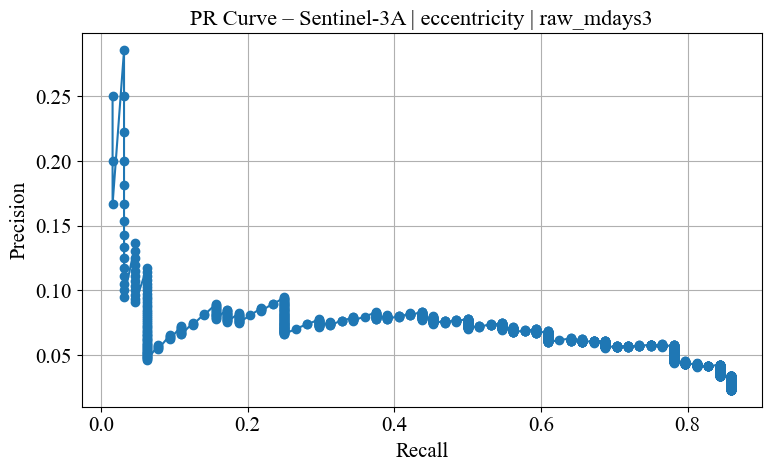

[RAW] | mdays=3 | Threshold=0.6245 | P=0.07 | R=0.55 | F1=0.13 | F2=0.24
[RAW] TP=35, FP=432, FN=29

[RAW] Computing PR Curve - Sentinel-3A | eccentricity | ±5 days


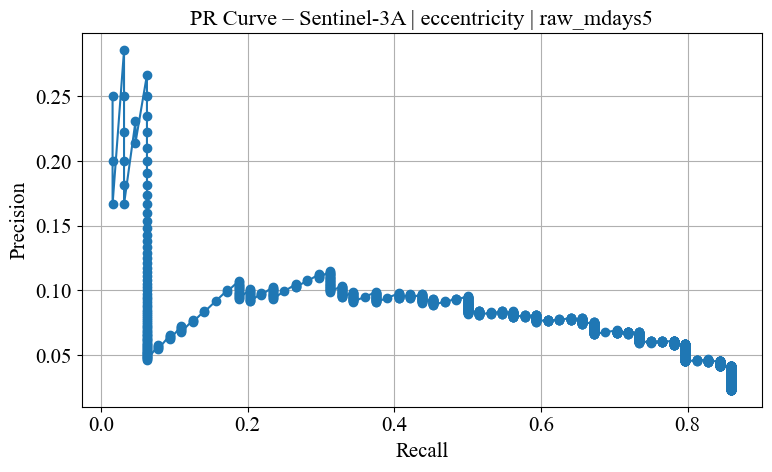

[RAW] | mdays=5 | Threshold=0.7682 | P=0.10 | R=0.50 | F1=0.16 | F2=0.27
[RAW] TP=32, FP=303, FN=32

[RAW] Using BEST mdays = ±5 for anomaly detection (F2 = 0.27)


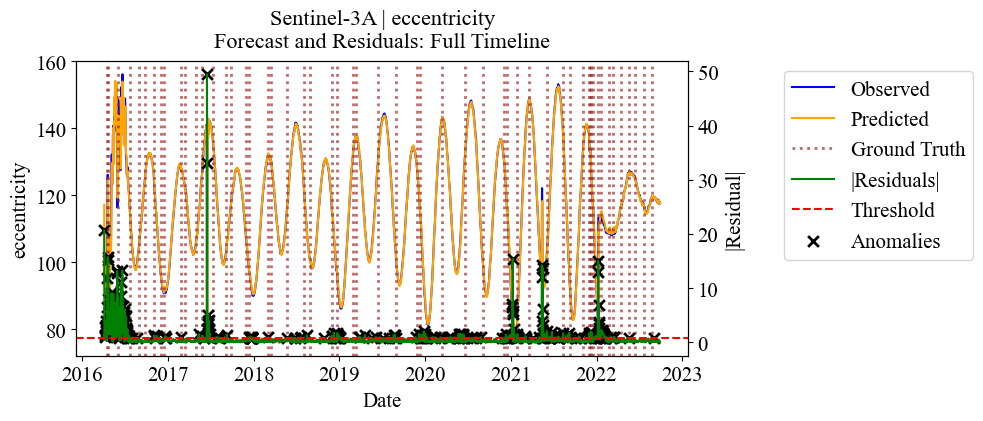

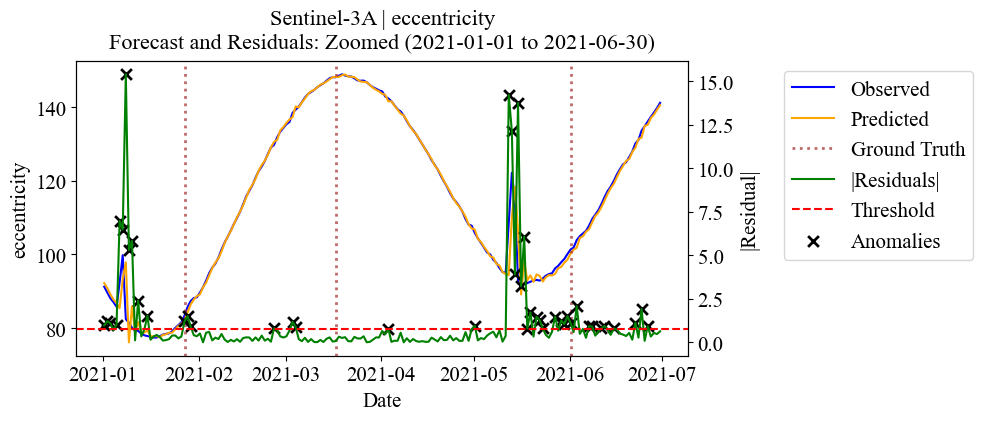


[SMOOTHED] Running smoothed ARIMA on Sentinel-3A | eccentricity
ADF p-value (d=0): 0.00000
Series is stationary at d=0
Best ARIMA Order: (5, 0, 13), AIC: 612.92, Models Tried: 114, Time: 335.6s


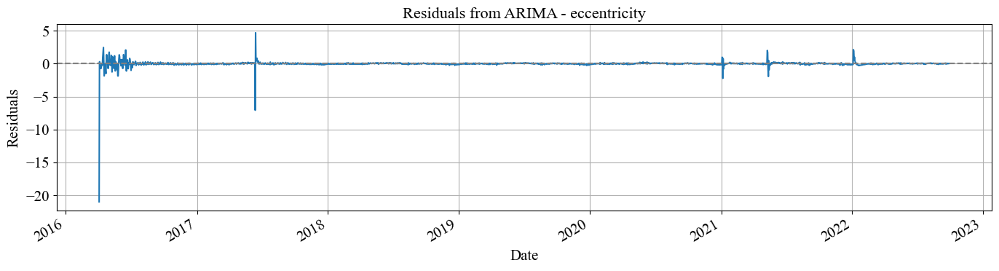

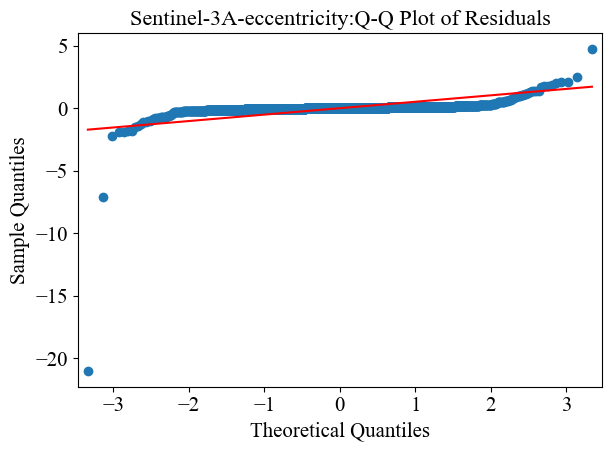


[SMOOTHED] Computing PR Curve – Sentinel-3A | eccentricity | ±3 days


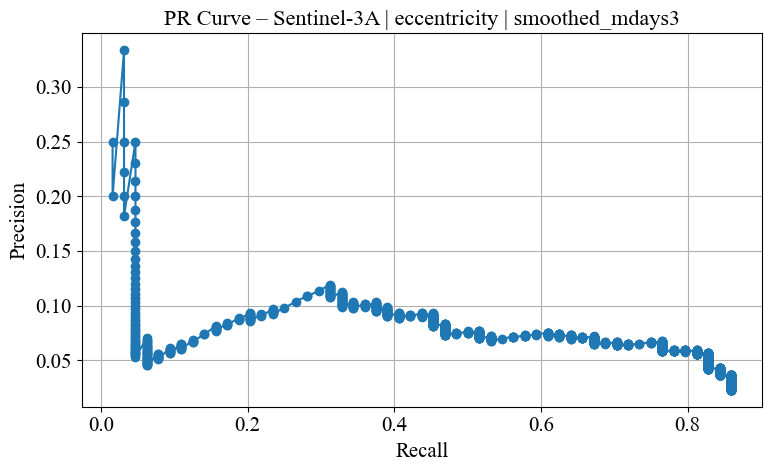

[SMOOTHED] | mdays=3 | Threshold=0.1345 | P=0.09 | R=0.45 | F1=0.15 | F2=0.26
[SMOOTHED] TP=29, FP=283, FN=35

[SMOOTHED] Computing PR Curve – Sentinel-3A | eccentricity | ±5 days


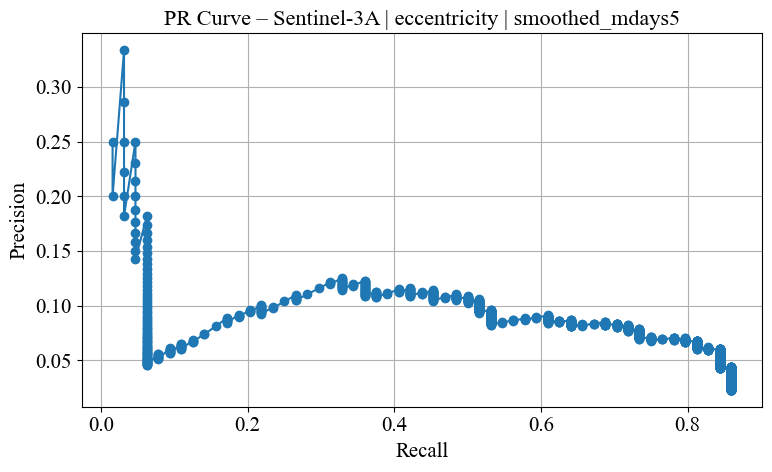

[SMOOTHED] | mdays=5 | Threshold=0.1345 | P=0.11 | R=0.52 | F1=0.18 | F2=0.29
[SMOOTHED] TP=33, FP=279, FN=31

[SMOOTHED] Using BEST mdays = ±5 for anomaly detection (F2 = 0.29)


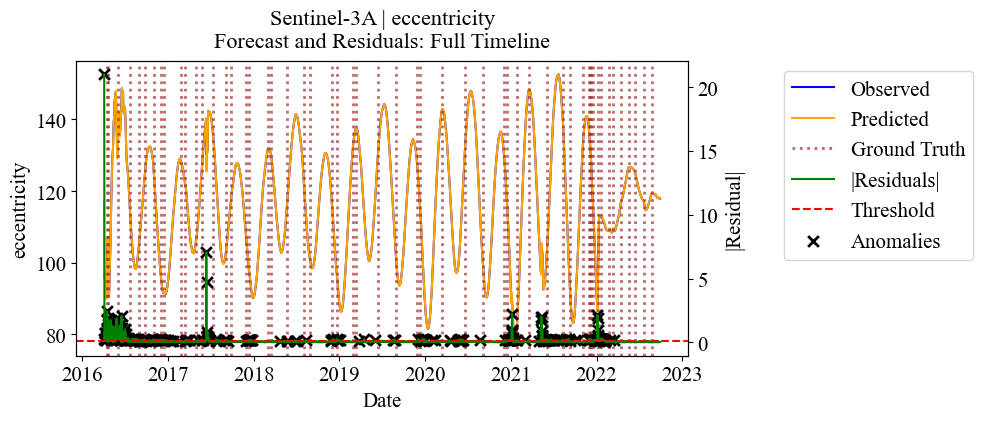

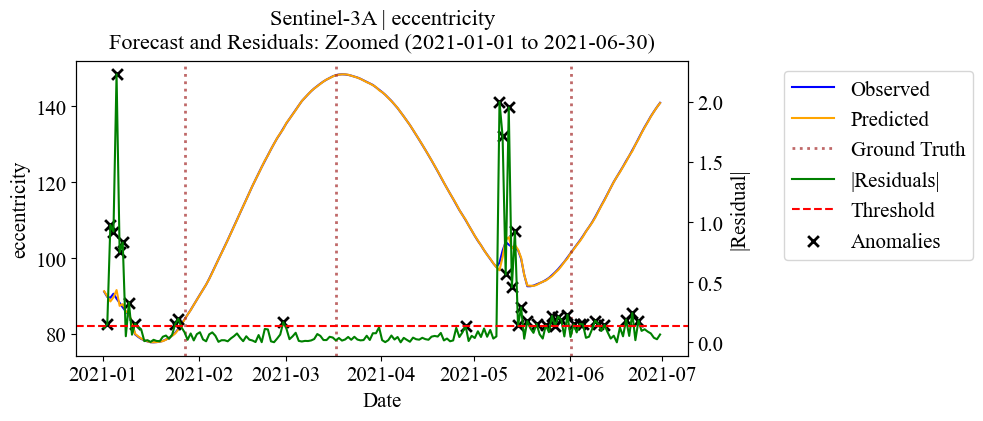

eccentricity: 0 outliers flagged
Total interpolated outliers: 0
No outliers found: skipping cleaned ARIMA for Sentinel-3A | eccentricity

==Forecasting and Anomaly Detection: Fengyun-2F | Brouwer mean motion ==


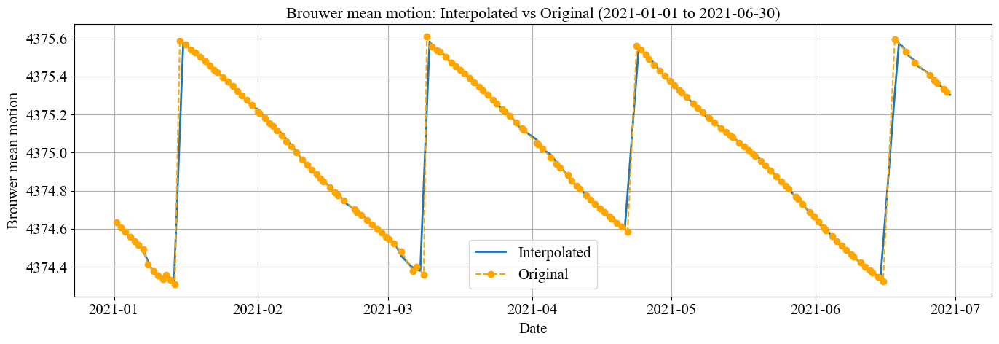

ADF p-value (d=0): 0.00000
Series is stationary at d=0
Best ARIMA Order: (3, 0, 3), AIC: -7567.42, Models Tried: 74, Time: 273.3s


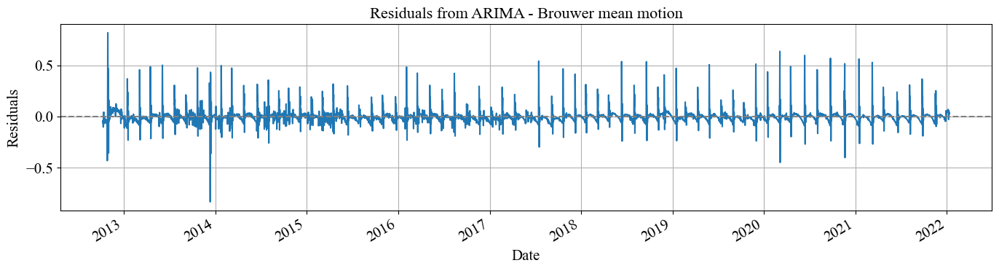

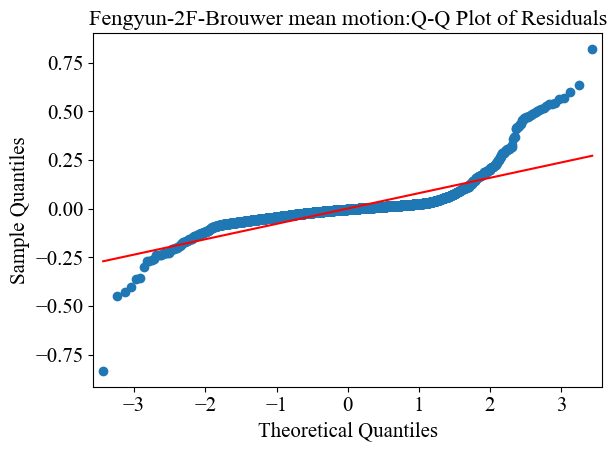


[RAW] Computing PR Curve - Fengyun-2F | Brouwer mean motion | ±3 days


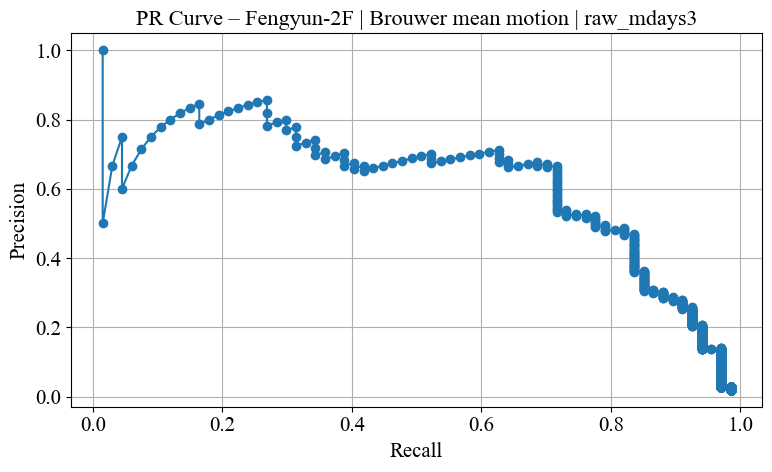

[RAW] | mdays=3 | Threshold=0.1876 | P=0.47 | R=0.84 | F1=0.60 | F2=0.72
[RAW] TP=56, FP=63, FN=11

[RAW] Computing PR Curve - Fengyun-2F | Brouwer mean motion | ±5 days


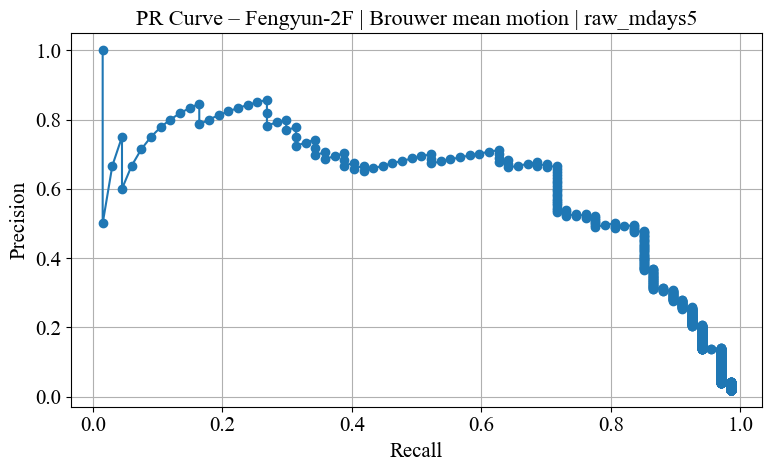

[RAW] | mdays=5 | Threshold=0.1876 | P=0.48 | R=0.85 | F1=0.61 | F2=0.74
[RAW] TP=57, FP=62, FN=10

[RAW] Using BEST mdays = ±5 for anomaly detection (F2 = 0.74)


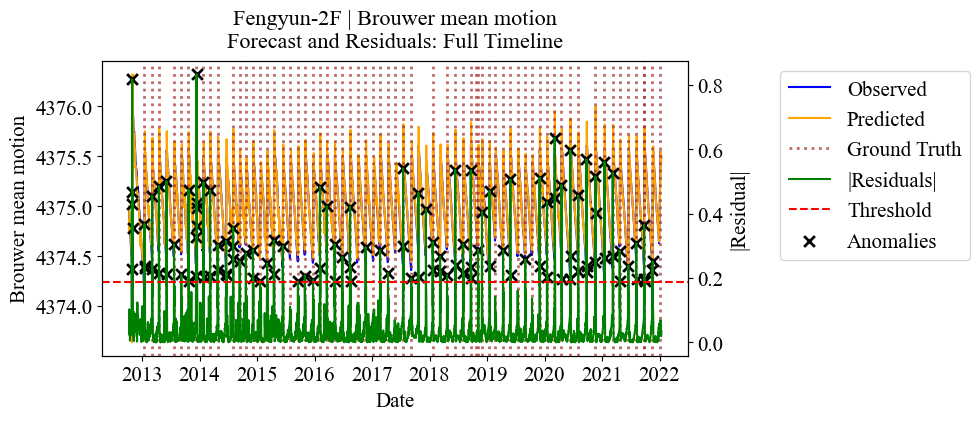

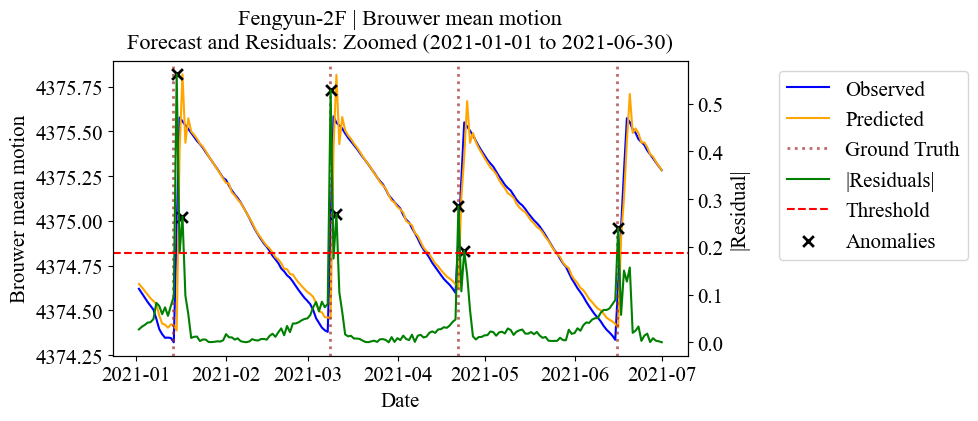


[SMOOTHED] Running smoothed ARIMA on Fengyun-2F | Brouwer mean motion
ADF p-value (d=0): 0.00000
Series is stationary at d=0
Best ARIMA Order: (3, 0, 13), AIC: -20654.54, Models Tried: 84, Time: 340.9s


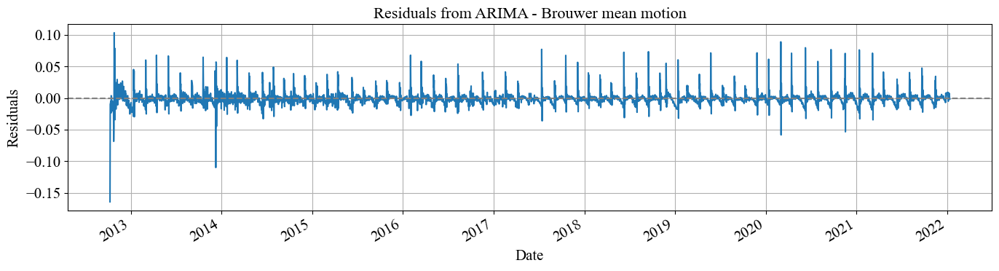

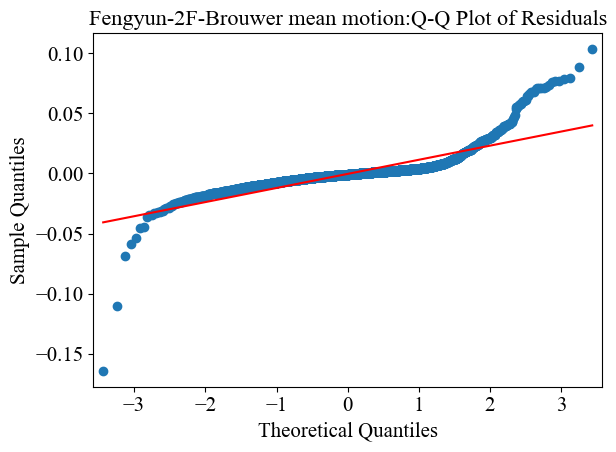


[SMOOTHED] Computing PR Curve – Fengyun-2F | Brouwer mean motion | ±3 days


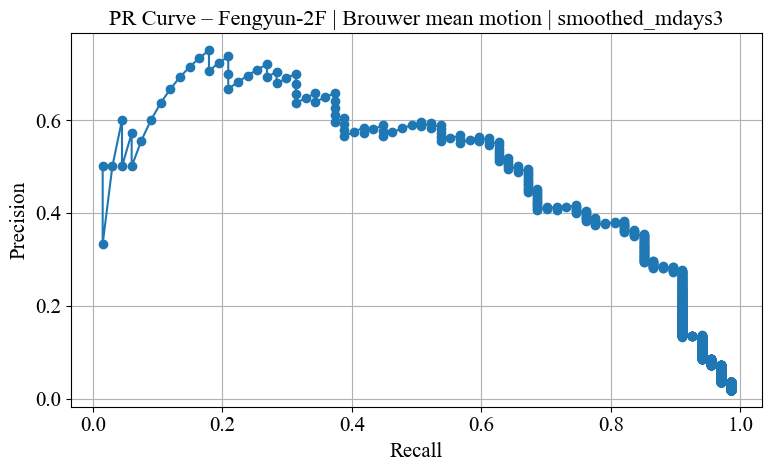

[SMOOTHED] | mdays=3 | Threshold=0.0240 | P=0.38 | R=0.82 | F1=0.52 | F2=0.67
[SMOOTHED] TP=55, FP=89, FN=12

[SMOOTHED] Computing PR Curve – Fengyun-2F | Brouwer mean motion | ±5 days


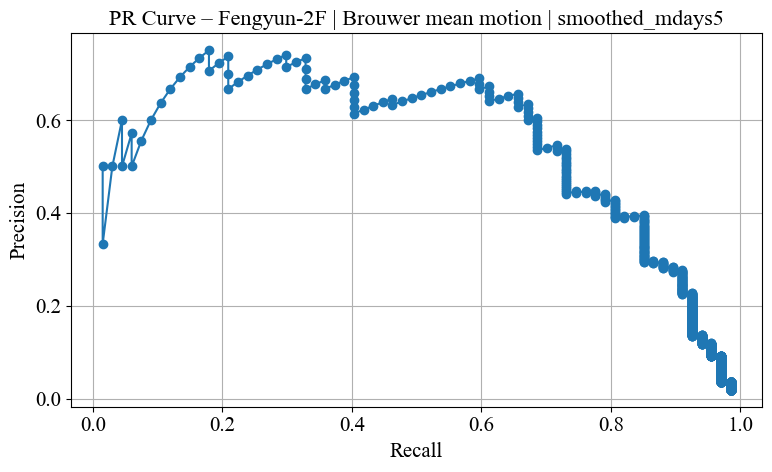

[SMOOTHED] | mdays=5 | Threshold=0.0240 | P=0.40 | R=0.85 | F1=0.54 | F2=0.69
[SMOOTHED] TP=57, FP=87, FN=10

[SMOOTHED] Using BEST mdays = ±5 for anomaly detection (F2 = 0.69)


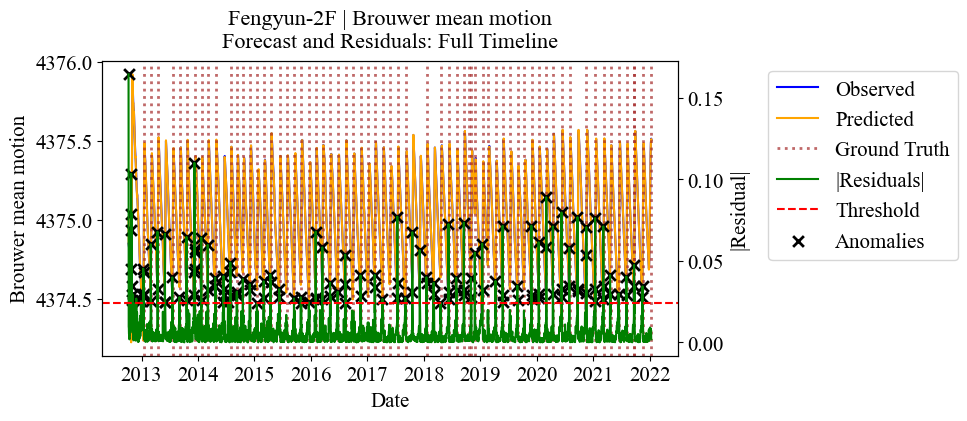

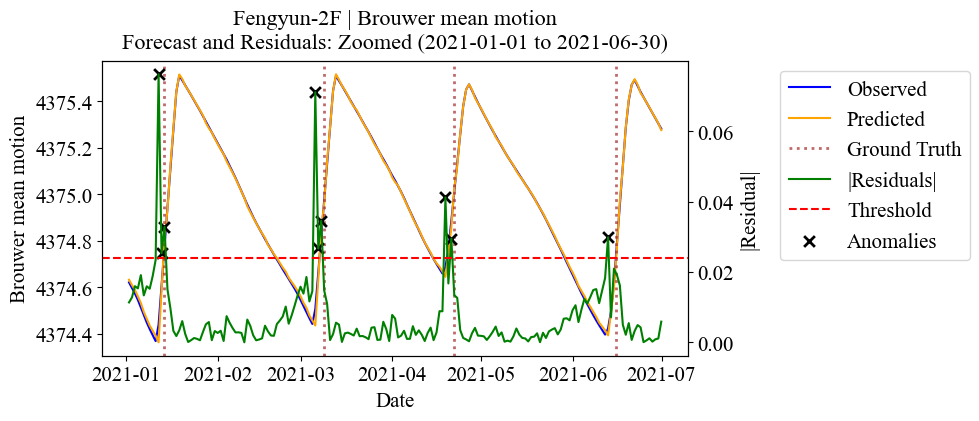

Brouwer mean motion: 0 outliers flagged
Total interpolated outliers: 0
No outliers found: skipping cleaned ARIMA for Fengyun-2F | Brouwer mean motion

==Forecasting and Anomaly Detection: Fengyun-2F | mean anomaly ==


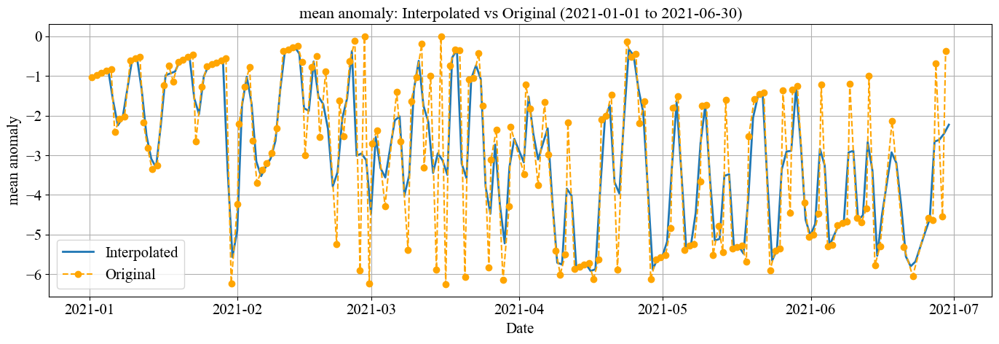

ADF p-value (d=0): 0.00000
Series is stationary at d=0
Best ARIMA Order: (1, 0, 3), AIC: 9100.79, Models Tried: 44, Time: 74.2s


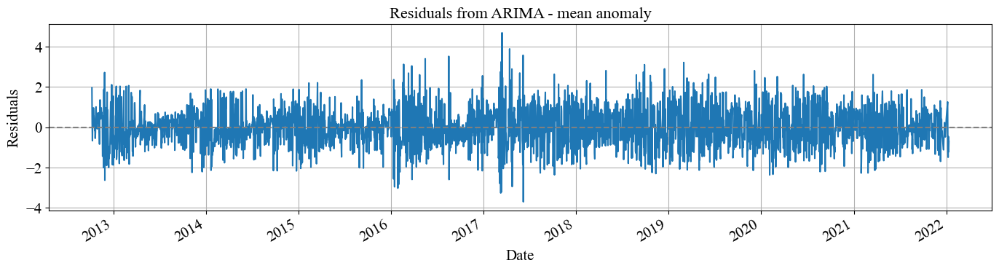

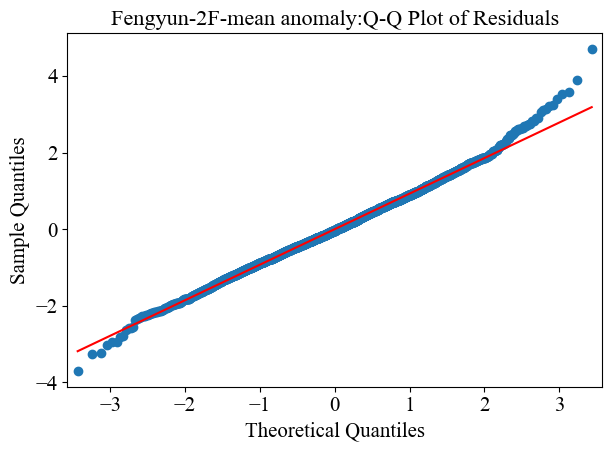


[RAW] Computing PR Curve - Fengyun-2F | mean anomaly | ±3 days


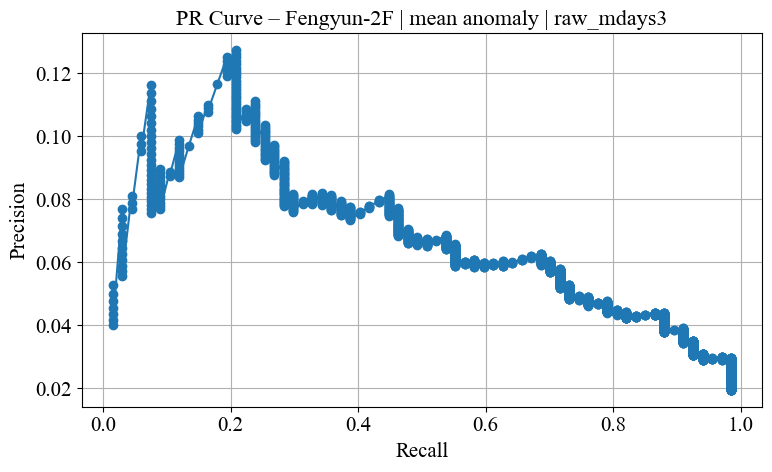

[RAW] | mdays=3 | Threshold=1.4731 | P=0.08 | R=0.45 | F1=0.14 | F2=0.24
[RAW] TP=30, FP=338, FN=37

[RAW] Computing PR Curve - Fengyun-2F | mean anomaly | ±5 days


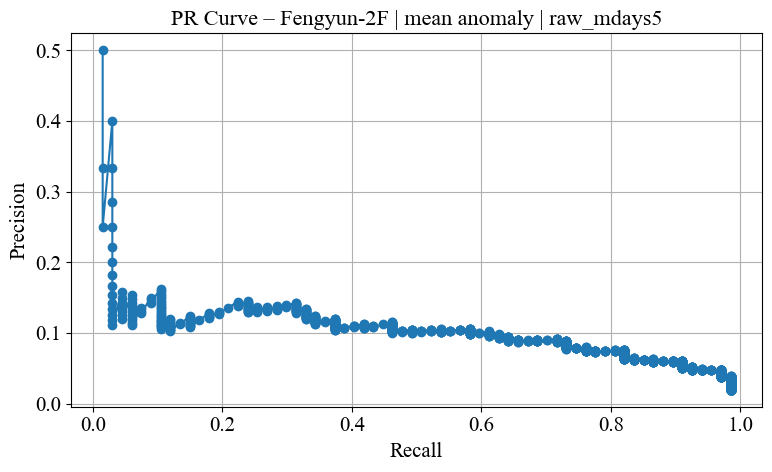

[RAW] | mdays=5 | Threshold=1.4731 | P=0.11 | R=0.58 | F1=0.18 | F2=0.31
[RAW] TP=39, FP=329, FN=28

[RAW] Using BEST mdays = ±5 for anomaly detection (F2 = 0.31)


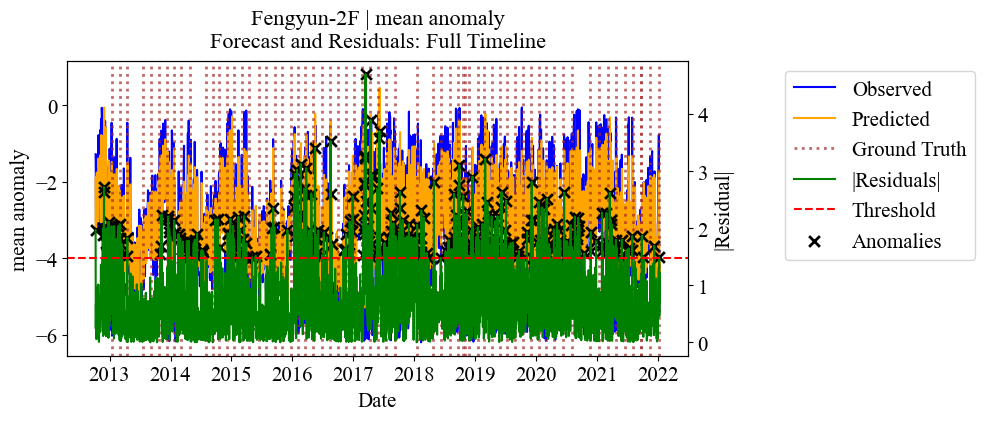

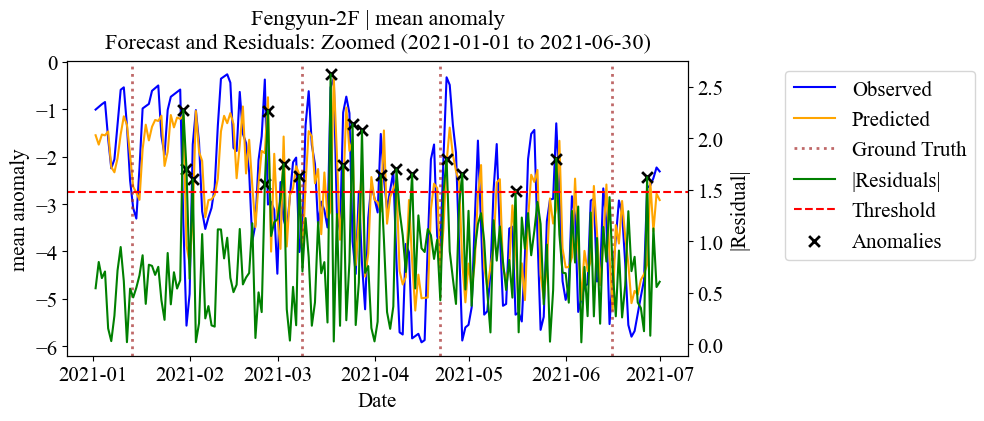


[SMOOTHED] Running smoothed ARIMA on Fengyun-2F | mean anomaly
ADF p-value (d=0): 0.00000
Series is stationary at d=0
Best ARIMA Order: (1, 0, 9), AIC: -4007.49, Models Tried: 50, Time: 169.9s


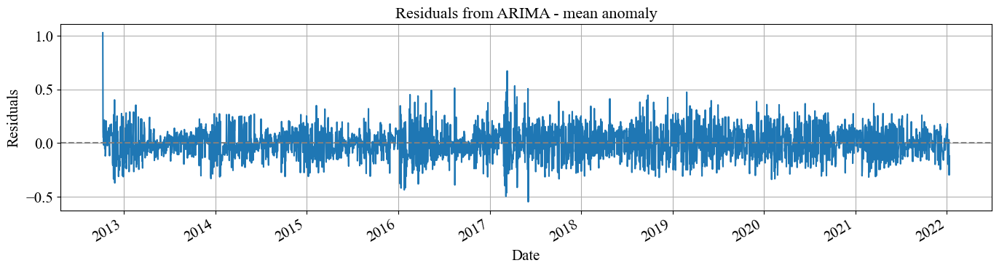

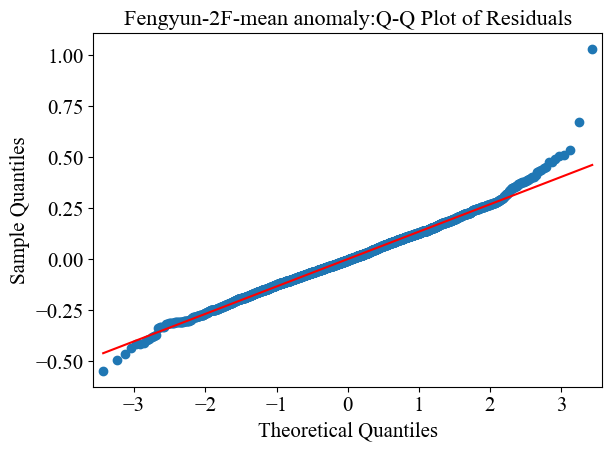


[SMOOTHED] Computing PR Curve – Fengyun-2F | mean anomaly | ±3 days


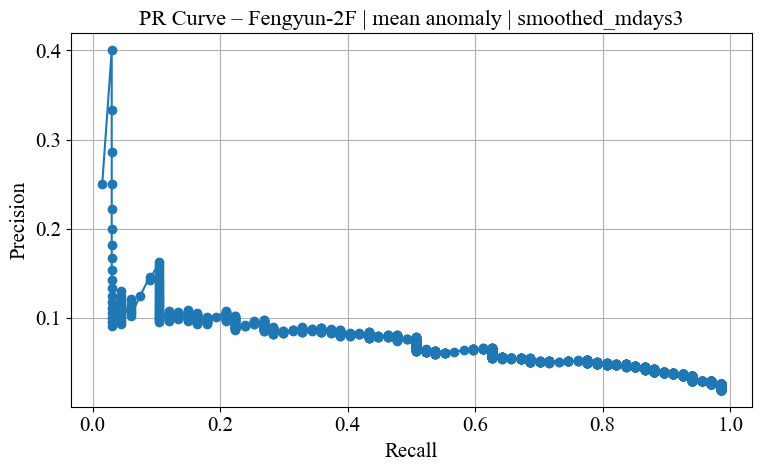

[SMOOTHED] | mdays=3 | Threshold=0.1975 | P=0.08 | R=0.51 | F1=0.14 | F2=0.24
[SMOOTHED] TP=34, FP=399, FN=33

[SMOOTHED] Computing PR Curve – Fengyun-2F | mean anomaly | ±5 days


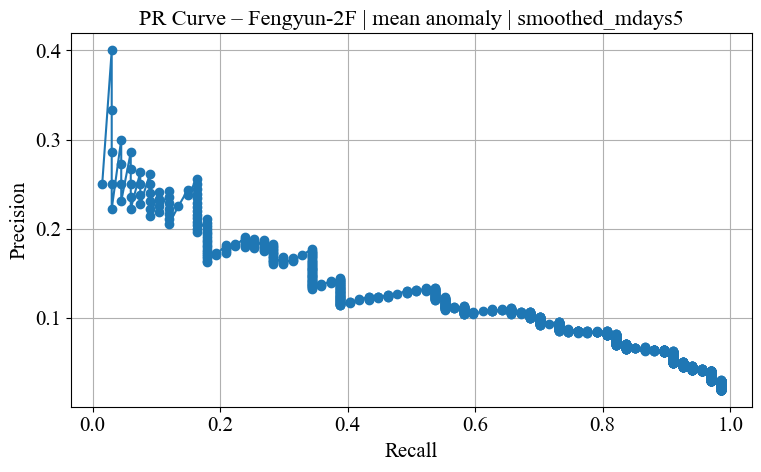

[SMOOTHED] | mdays=5 | Threshold=0.2334 | P=0.13 | R=0.54 | F1=0.21 | F2=0.34
[SMOOTHED] TP=36, FP=233, FN=31

[SMOOTHED] Using BEST mdays = ±5 for anomaly detection (F2 = 0.34)


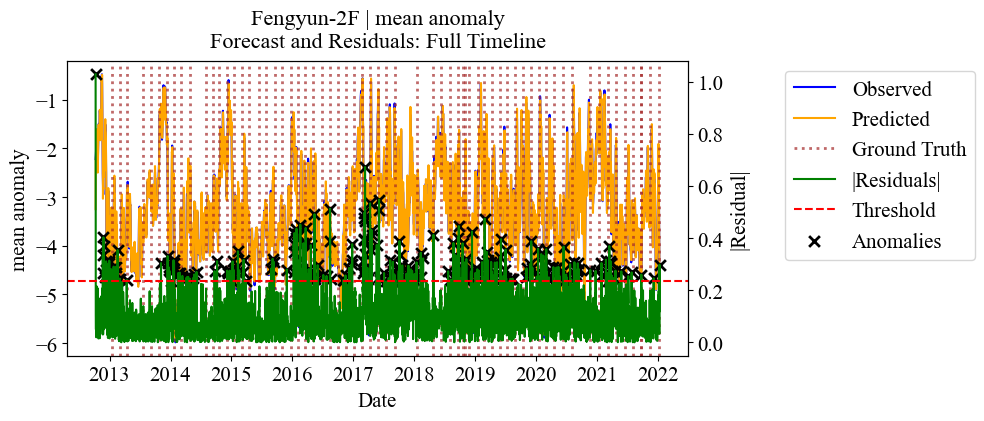

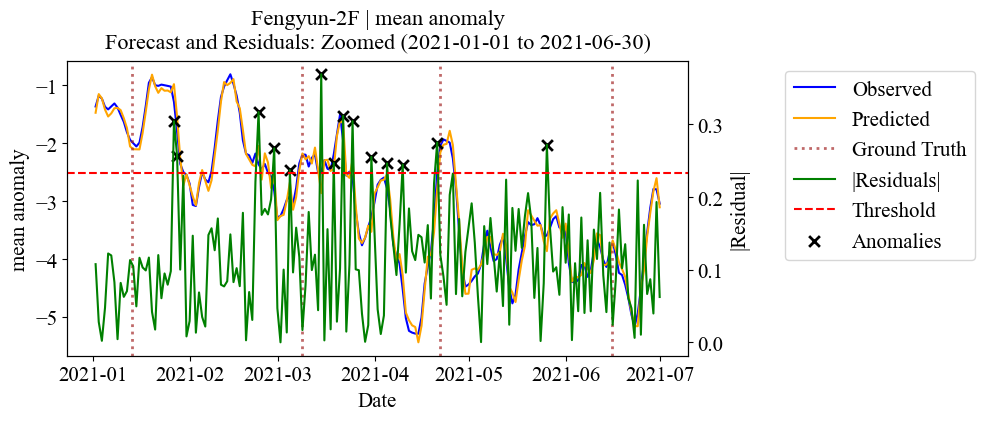

mean anomaly: 0 outliers flagged
Total interpolated outliers: 0
No outliers found: skipping cleaned ARIMA for Fengyun-2F | mean anomaly

==Forecasting and Anomaly Detection: Fengyun-2F | eccentricity ==


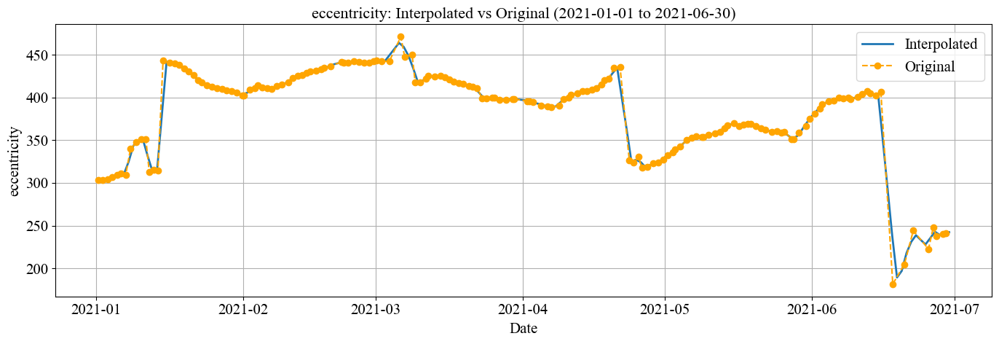

ADF p-value (d=0): 0.00280
Series is stationary at d=0
Best ARIMA Order: (1, 0, 4), AIC: 32425.96, Models Tried: 45, Time: 93.6s


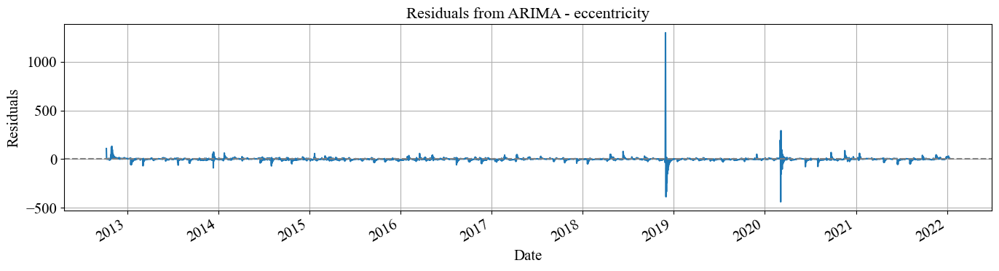

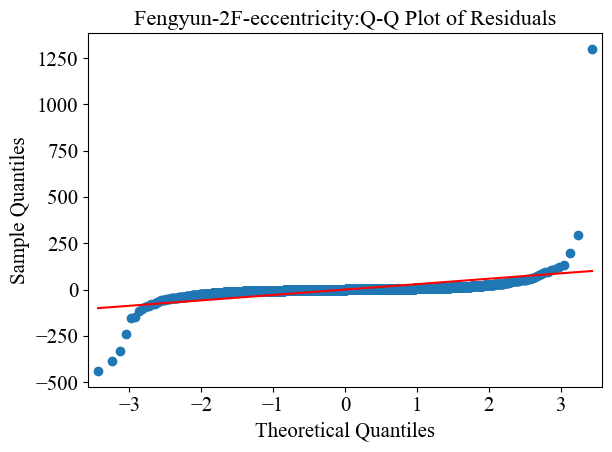


[RAW] Computing PR Curve - Fengyun-2F | eccentricity | ±3 days


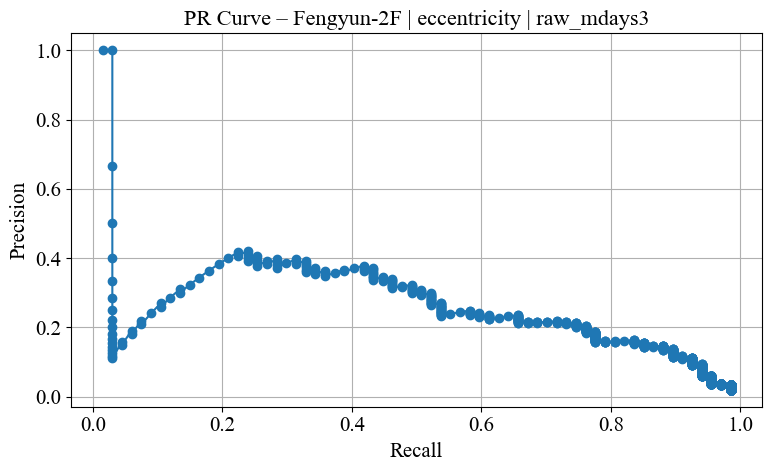

[RAW] | mdays=3 | Threshold=19.2317 | P=0.21 | R=0.75 | F1=0.33 | F2=0.50
[RAW] TP=50, FP=184, FN=17

[RAW] Computing PR Curve - Fengyun-2F | eccentricity | ±5 days


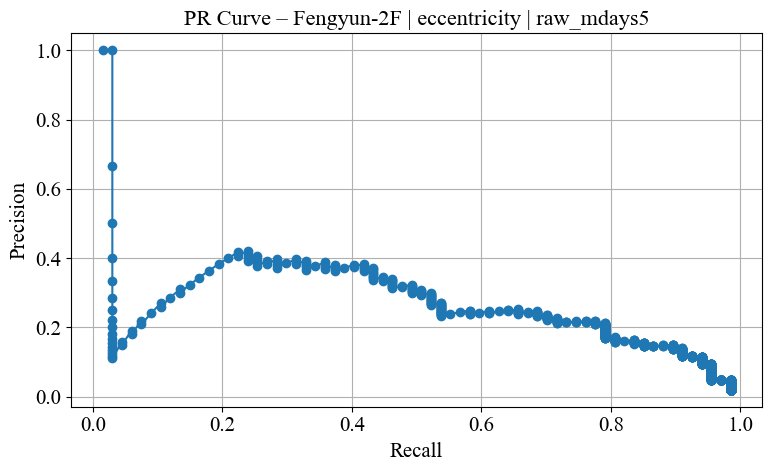

[RAW] | mdays=5 | Threshold=18.7551 | P=0.22 | R=0.78 | F1=0.34 | F2=0.51
[RAW] TP=52, FP=187, FN=15

[RAW] Using BEST mdays = ±5 for anomaly detection (F2 = 0.51)


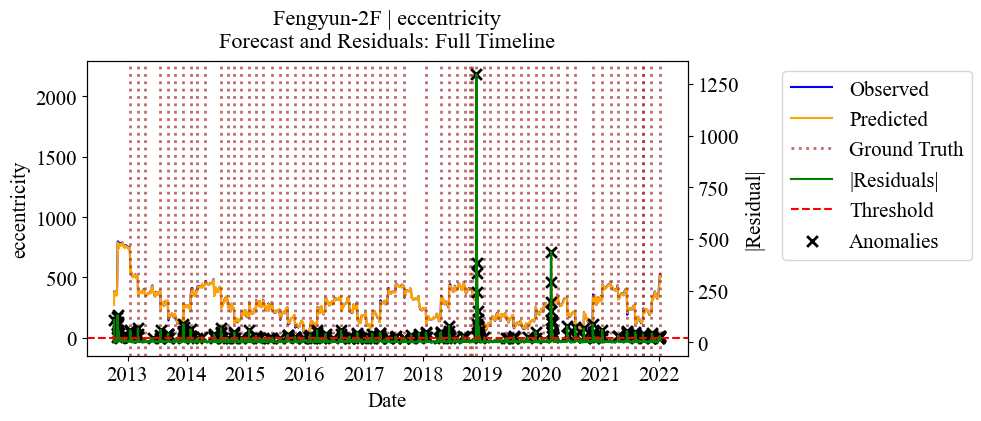

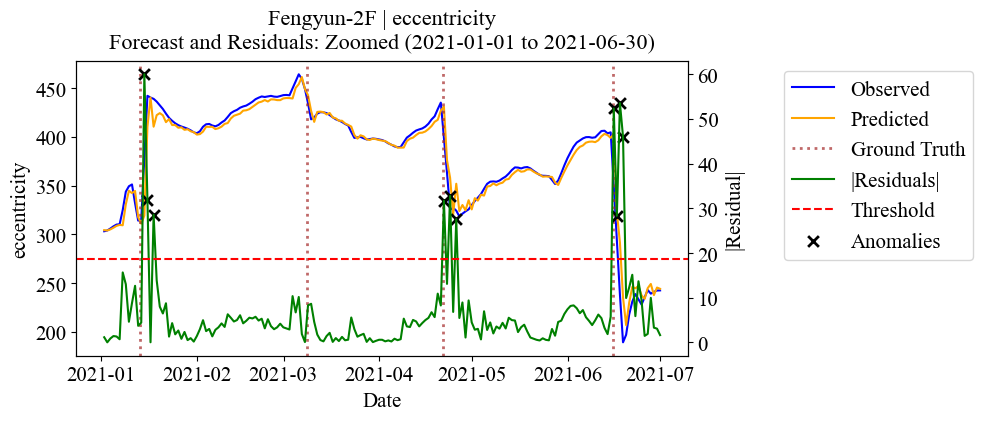


[SMOOTHED] Running smoothed ARIMA on Fengyun-2F | eccentricity
ADF p-value (d=0): 0.00238
Series is stationary at d=0
Best ARIMA Order: (1, 0, 10), AIC: 19324.83, Models Tried: 51, Time: 166.2s


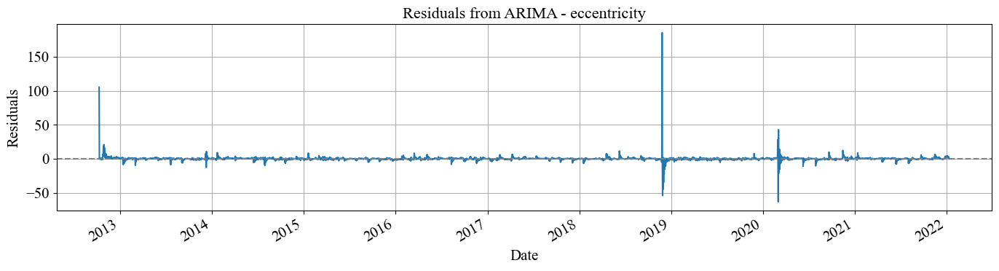

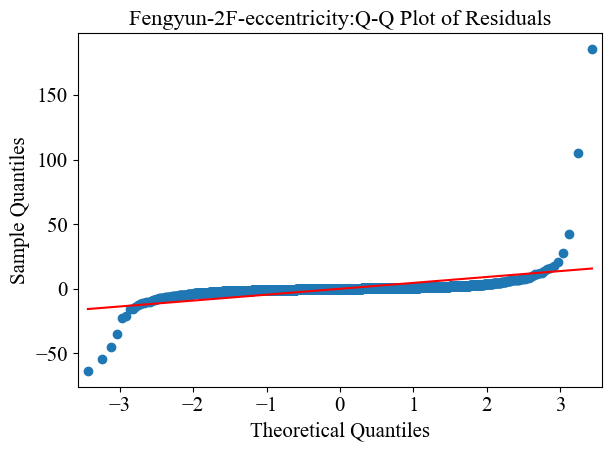


[SMOOTHED] Computing PR Curve – Fengyun-2F | eccentricity | ±3 days


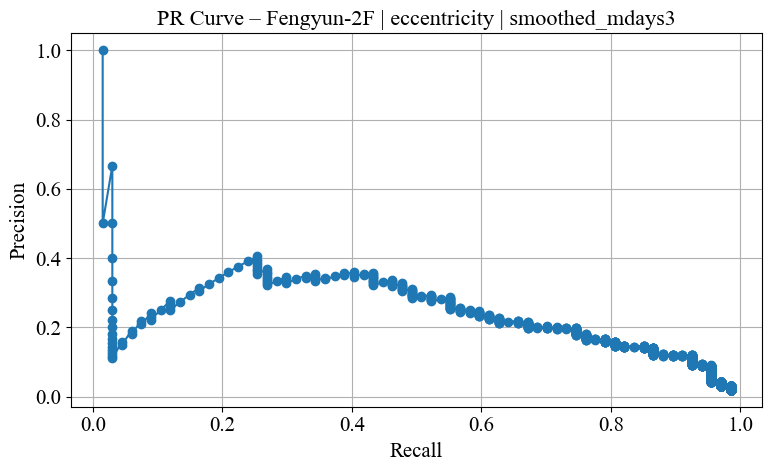

[SMOOTHED] | mdays=3 | Threshold=2.7077 | P=0.20 | R=0.75 | F1=0.31 | F2=0.48
[SMOOTHED] TP=50, FP=201, FN=17

[SMOOTHED] Computing PR Curve – Fengyun-2F | eccentricity | ±5 days


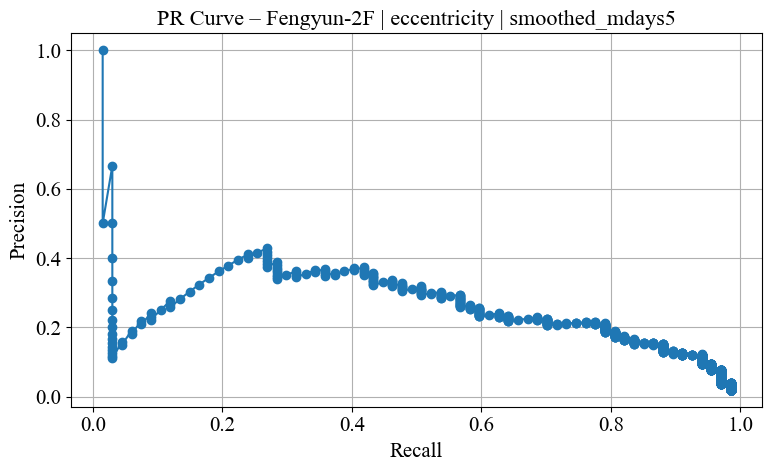

[SMOOTHED] | mdays=5 | Threshold=2.7077 | P=0.21 | R=0.79 | F1=0.33 | F2=0.51
[SMOOTHED] TP=53, FP=198, FN=14

[SMOOTHED] Using BEST mdays = ±5 for anomaly detection (F2 = 0.51)


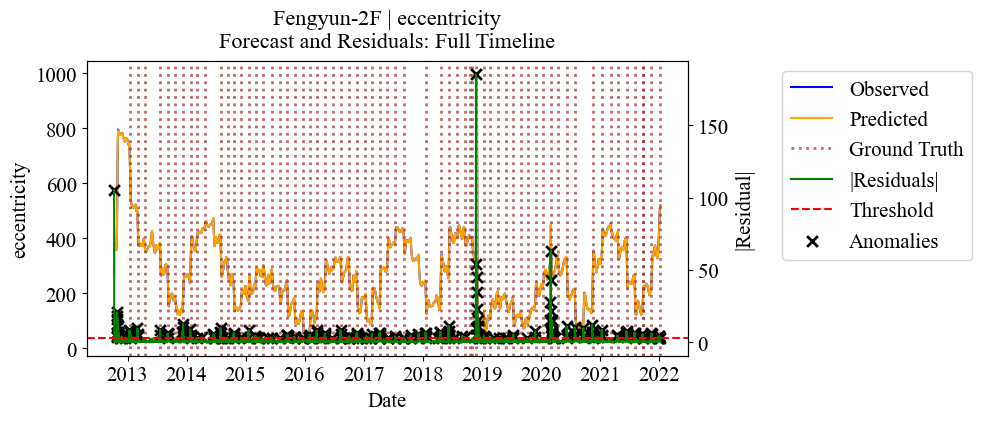

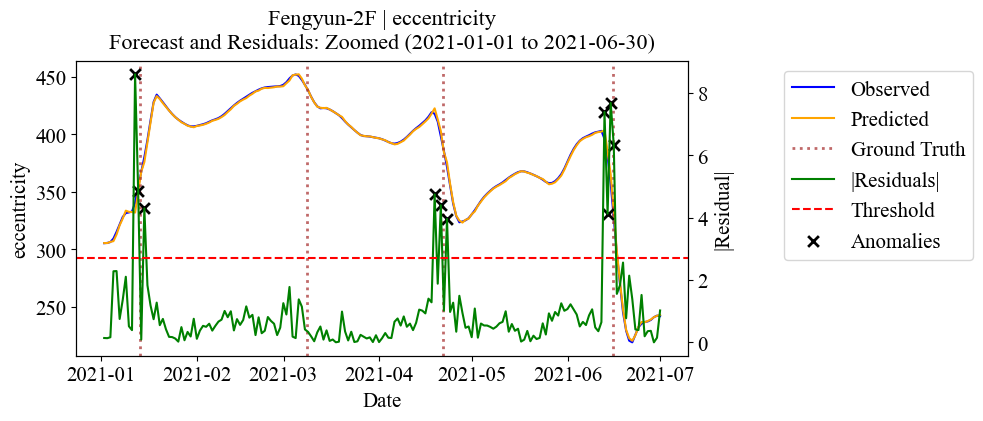

eccentricity: 3 outliers flagged
Total interpolated outliers: 3
Outliers found: running ARIMA on cleaned Fengyun-2F | eccentricity
Best ARIMA Order: (1, 0, 4), AIC: 29535.07, Models Tried: 45, Time: 98.7s


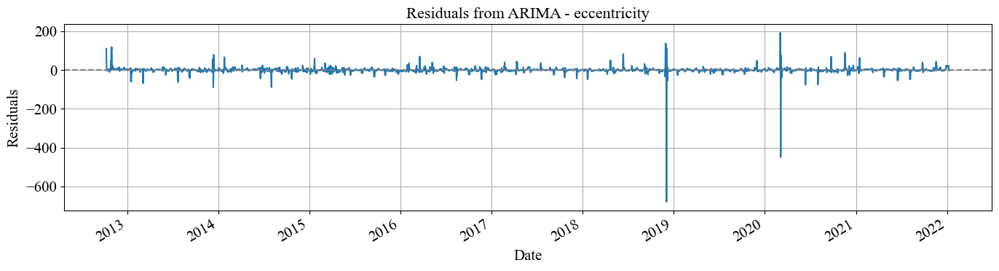

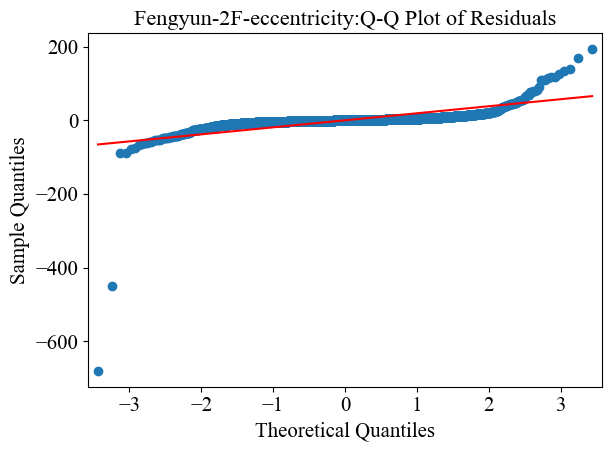


[CLEANED] Computing PR Curve – Fengyun-2F | eccentricity | ±3 days


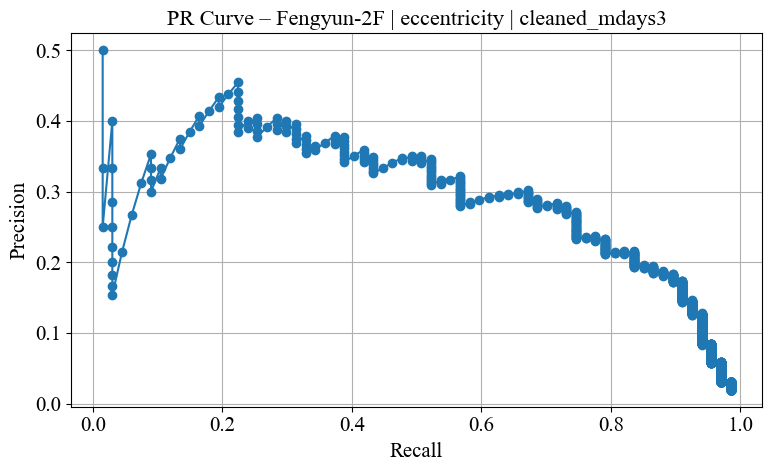

[CLEANED] | mdays=3 | Threshold=19.5947 | P=0.27 | R=0.75 | F1=0.40 | F2=0.55
[CLEANED] TP=50, FP=134, FN=17

[CLEANED] Computing PR Curve – Fengyun-2F | eccentricity | ±5 days


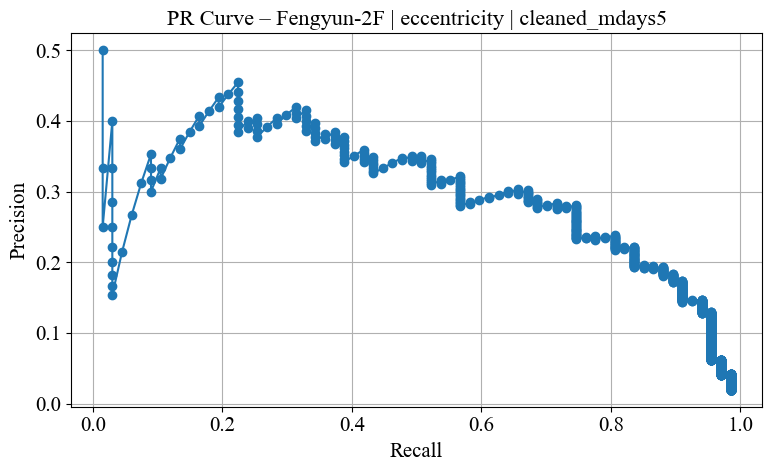

[CLEANED] | mdays=5 | Threshold=19.9263 | P=0.28 | R=0.75 | F1=0.41 | F2=0.56
[CLEANED] TP=50, FP=128, FN=17

[CLEANED] Using BEST mdays = ±5 for anomaly detection (F2 = 0.56)


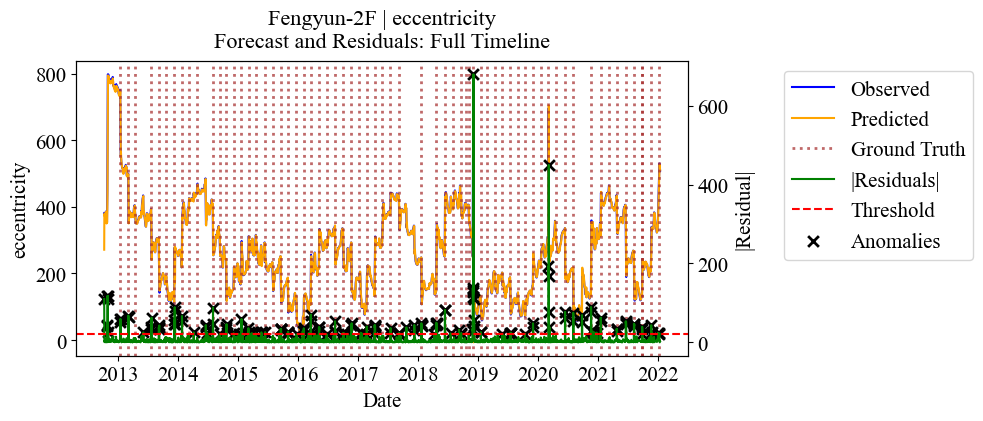

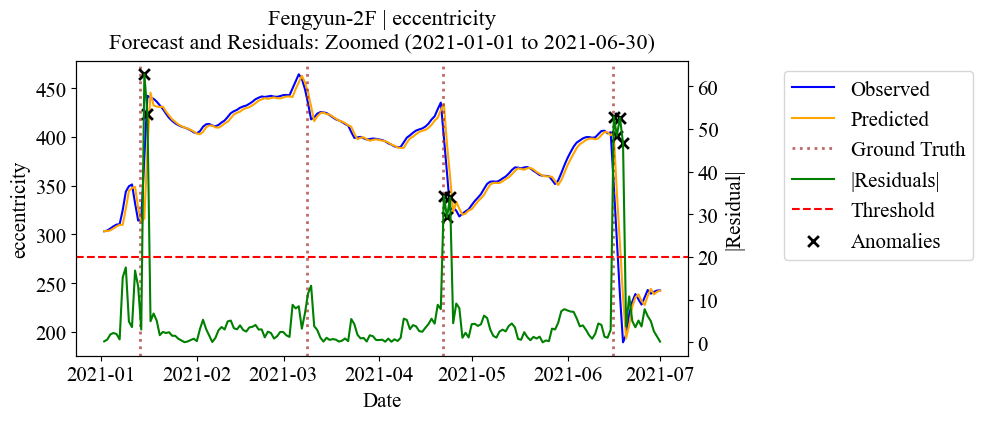


==Forecasting and Anomaly Detection: Fengyun-4A | Brouwer mean motion ==


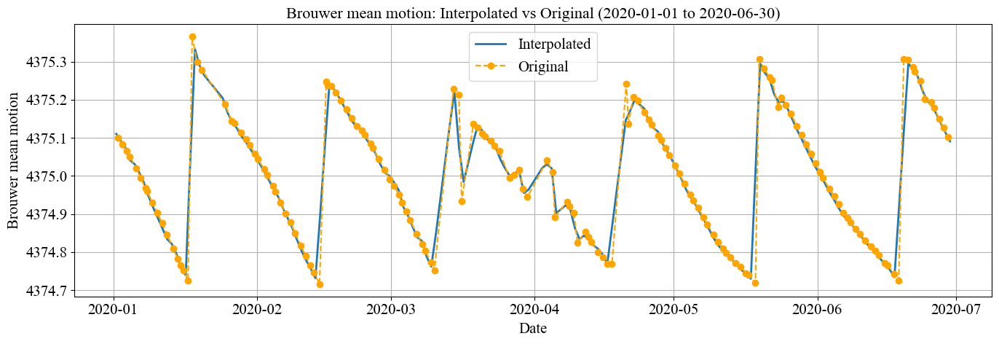

ADF p-value (d=0): 0.00000
Series is stationary at d=0
Best ARIMA Order: (3, 0, 14), AIC: -4067.64, Models Tried: 85, Time: 156.4s


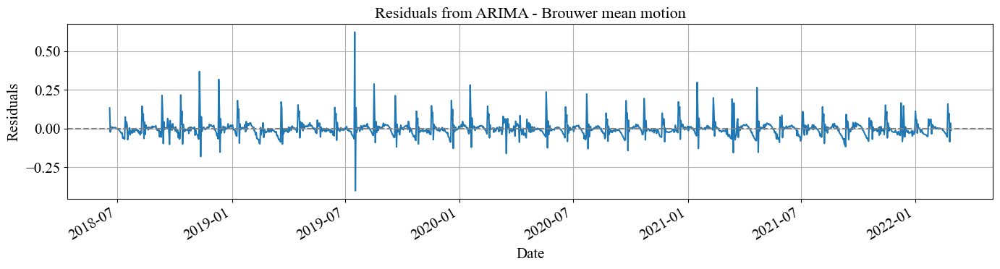

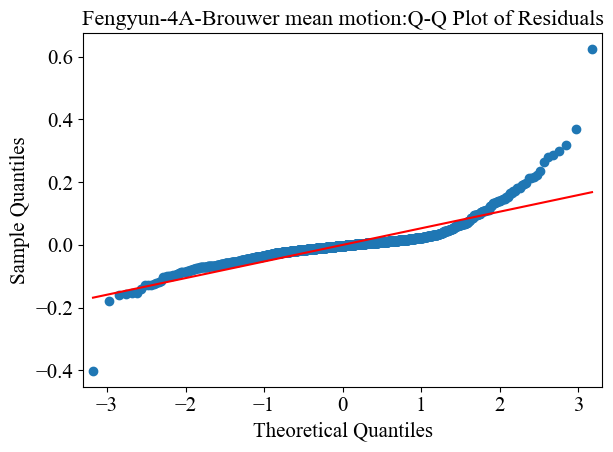


[RAW] Computing PR Curve - Fengyun-4A | Brouwer mean motion | ±3 days


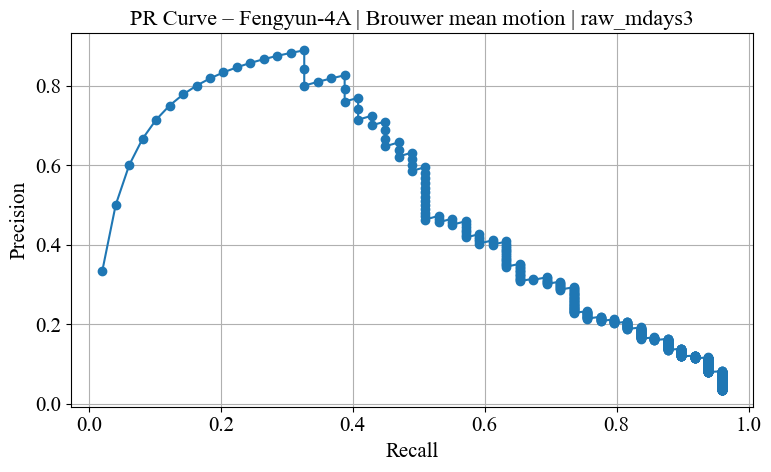

[RAW] | mdays=3 | Threshold=0.0972 | P=0.41 | R=0.63 | F1=0.50 | F2=0.57
[RAW] TP=31, FP=45, FN=18

[RAW] Computing PR Curve - Fengyun-4A | Brouwer mean motion | ±5 days


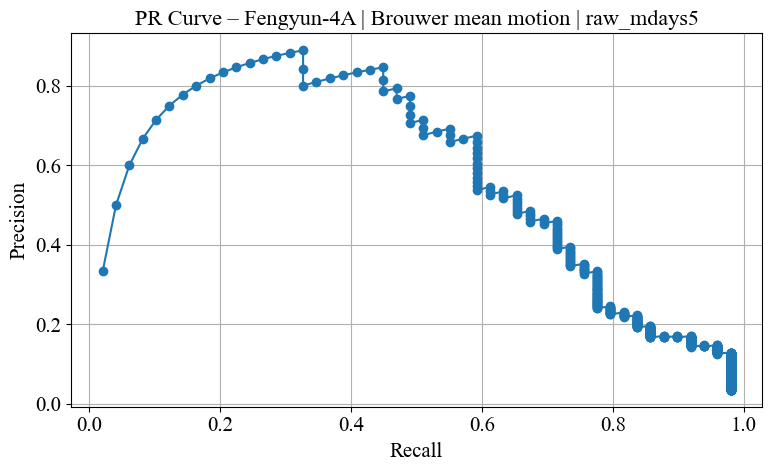

[RAW] | mdays=5 | Threshold=0.0972 | P=0.46 | R=0.71 | F1=0.56 | F2=0.64
[RAW] TP=35, FP=41, FN=14

[RAW] Using BEST mdays = ±5 for anomaly detection (F2 = 0.64)


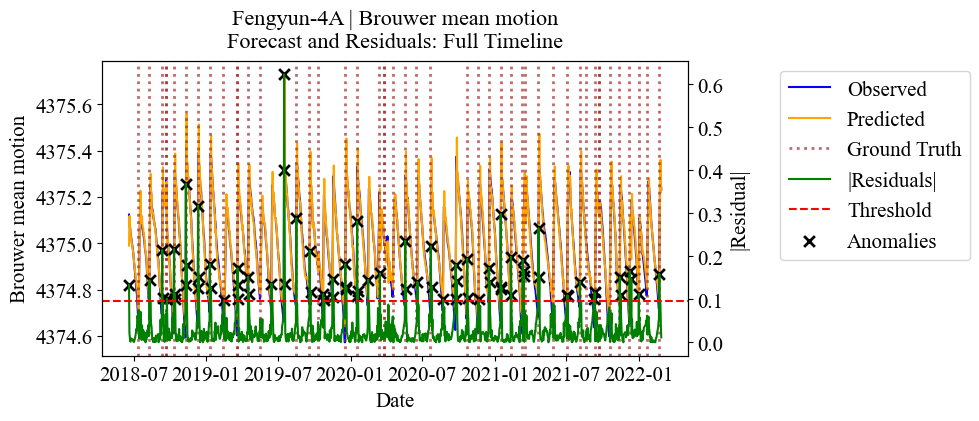

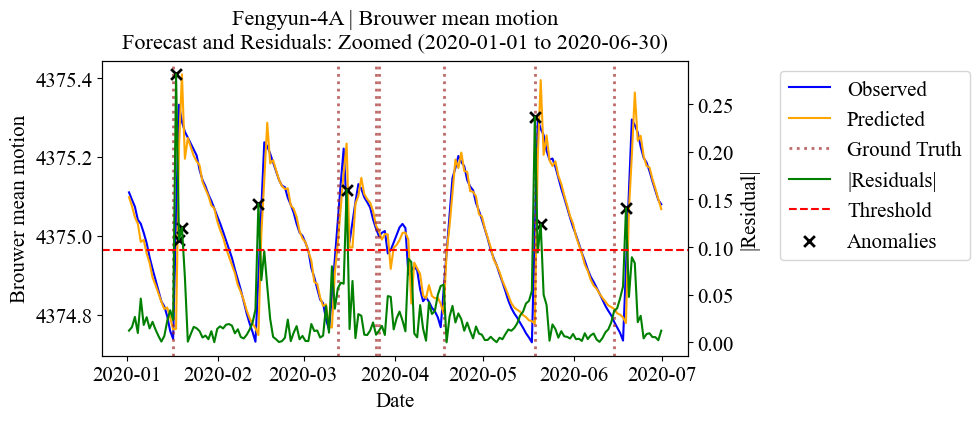


[SMOOTHED] Running smoothed ARIMA on Fengyun-4A | Brouwer mean motion
ADF p-value (d=0): 0.00000
Series is stationary at d=0
Best ARIMA Order: (2, 0, 13), AIC: -9254.38, Models Tried: 69, Time: 118.0s


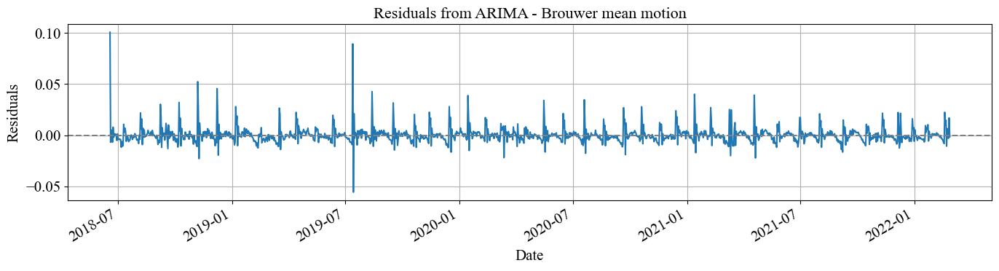

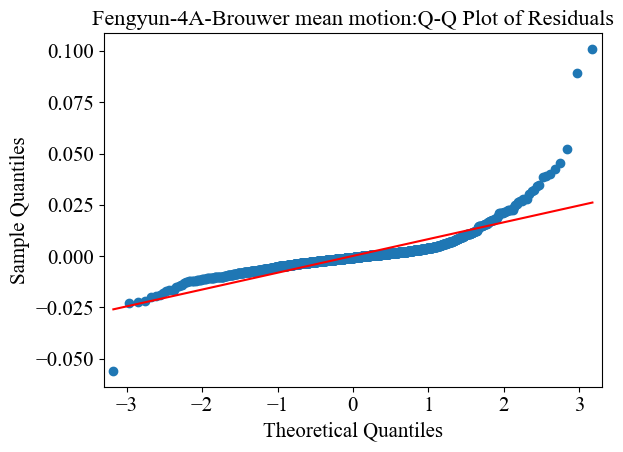


[SMOOTHED] Computing PR Curve – Fengyun-4A | Brouwer mean motion | ±3 days


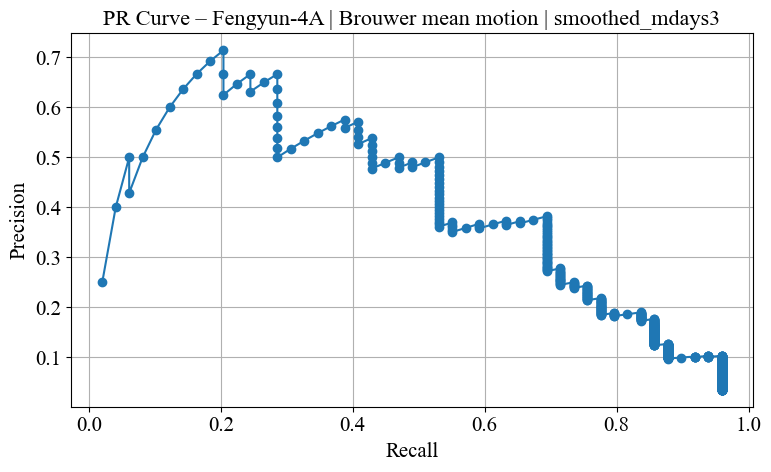

[SMOOTHED] | mdays=3 | Threshold=0.0121 | P=0.38 | R=0.69 | F1=0.49 | F2=0.60
[SMOOTHED] TP=34, FP=55, FN=15

[SMOOTHED] Computing PR Curve – Fengyun-4A | Brouwer mean motion | ±5 days


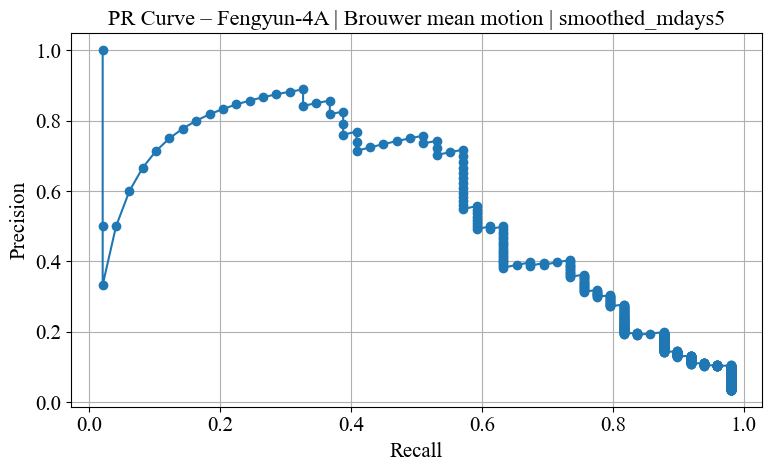

[SMOOTHED] | mdays=5 | Threshold=0.0121 | P=0.40 | R=0.73 | F1=0.52 | F2=0.63
[SMOOTHED] TP=36, FP=53, FN=13

[SMOOTHED] Using BEST mdays = ±5 for anomaly detection (F2 = 0.63)


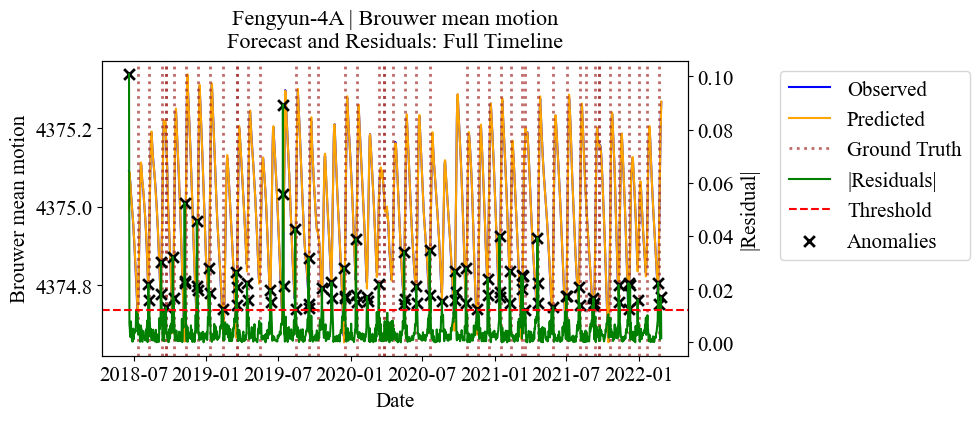

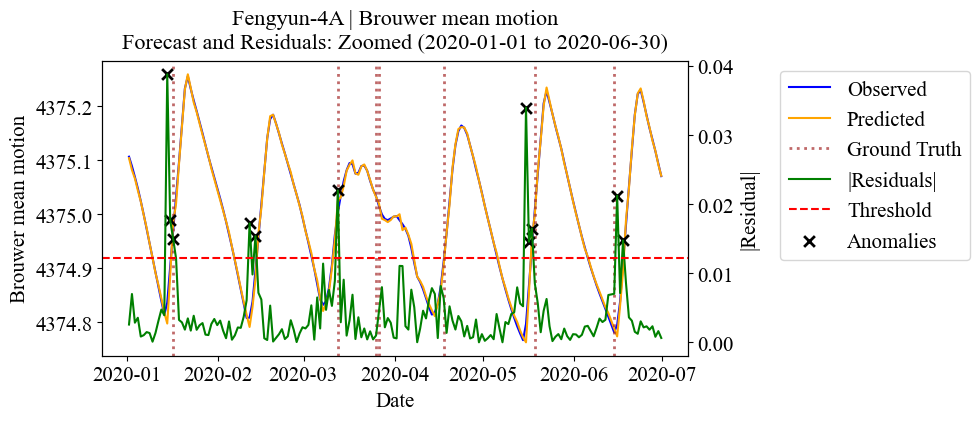

Brouwer mean motion: 0 outliers flagged
Total interpolated outliers: 0
No outliers found: skipping cleaned ARIMA for Fengyun-4A | Brouwer mean motion

==Forecasting and Anomaly Detection: Fengyun-4A | mean anomaly ==


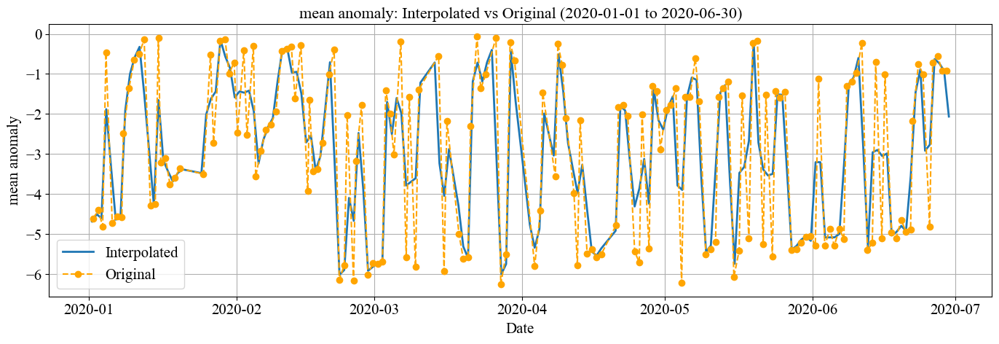

ADF p-value (d=0): 0.00000
Series is stationary at d=0
Best ARIMA Order: (1, 0, 5), AIC: 4046.98, Models Tried: 46, Time: 44.3s


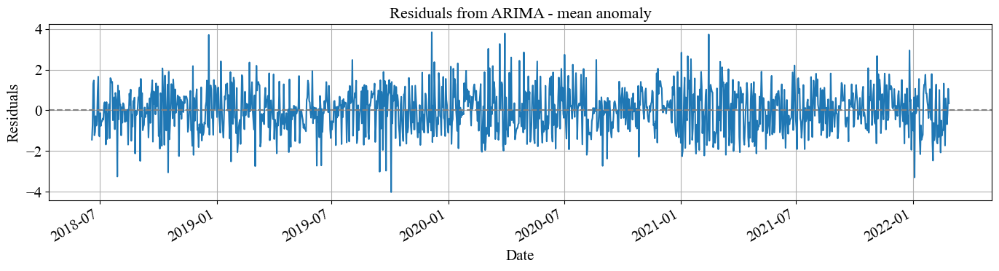

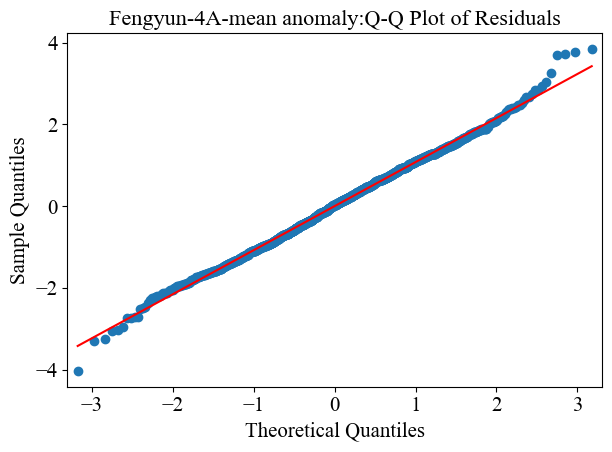


[RAW] Computing PR Curve - Fengyun-4A | mean anomaly | ±3 days


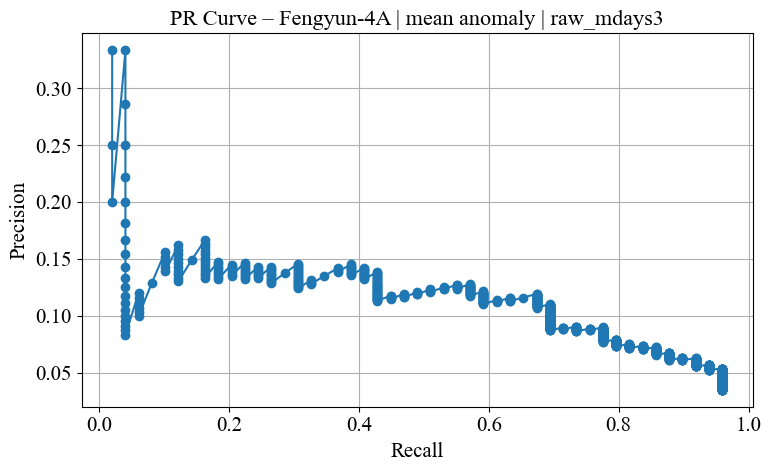

[RAW] | mdays=3 | Threshold=1.3479 | P=0.12 | R=0.67 | F1=0.20 | F2=0.35
[RAW] TP=33, FP=244, FN=16

[RAW] Computing PR Curve - Fengyun-4A | mean anomaly | ±5 days


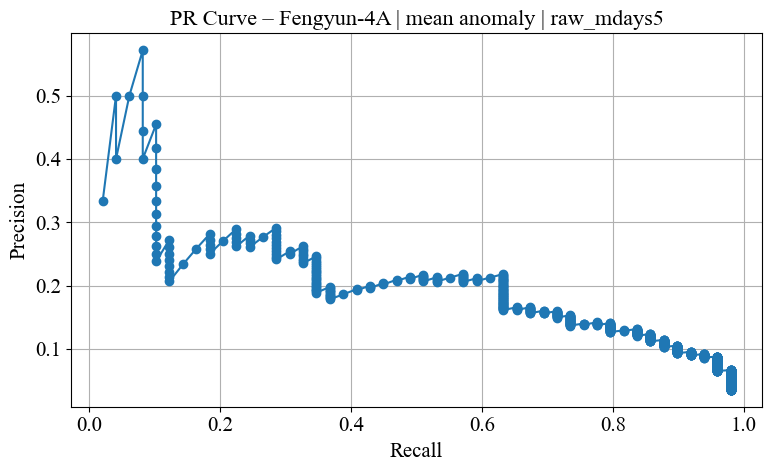

[RAW] | mdays=5 | Threshold=1.6790 | P=0.22 | R=0.63 | F1=0.32 | F2=0.46
[RAW] TP=31, FP=111, FN=18

[RAW] Using BEST mdays = ±5 for anomaly detection (F2 = 0.46)


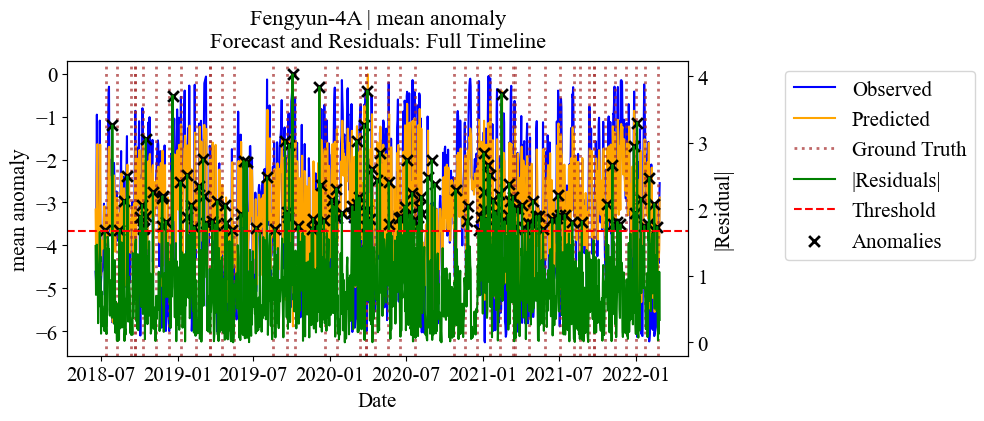

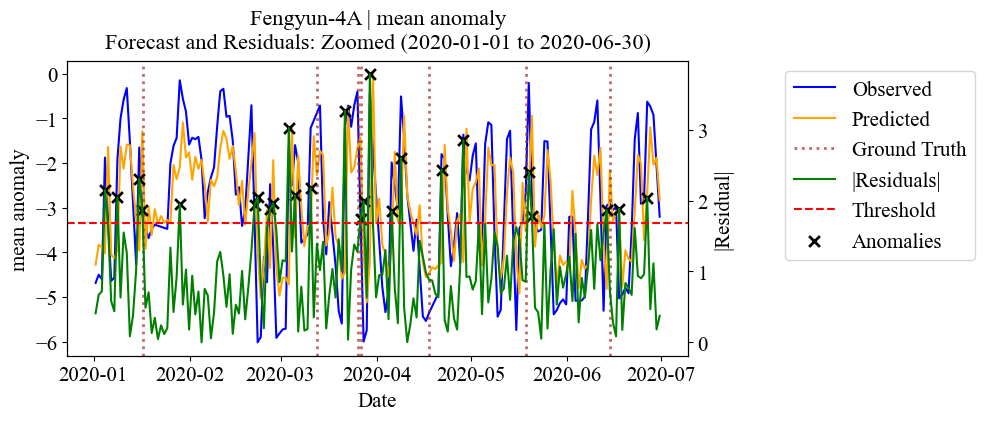


[SMOOTHED] Running smoothed ARIMA on Fengyun-4A | mean anomaly
ADF p-value (d=0): 0.00000
Series is stationary at d=0
Best ARIMA Order: (1, 0, 10), AIC: -1165.62, Models Tried: 51, Time: 90.8s


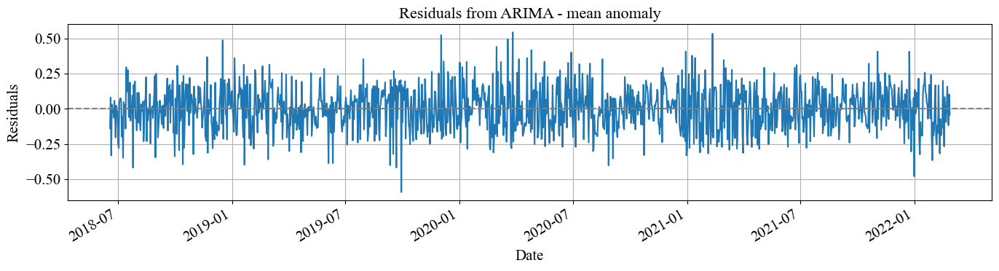

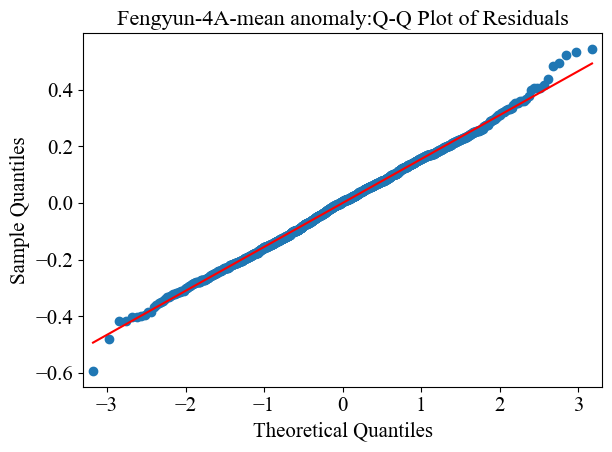


[SMOOTHED] Computing PR Curve – Fengyun-4A | mean anomaly | ±3 days


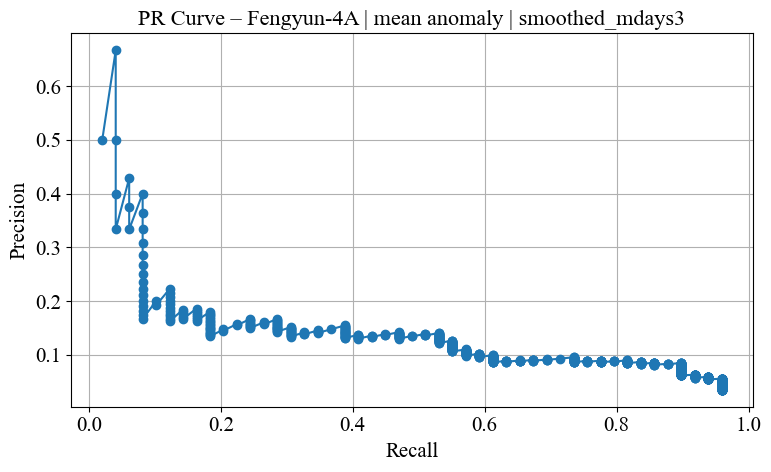

[SMOOTHED] | mdays=3 | Threshold=0.2260 | P=0.14 | R=0.53 | F1=0.22 | F2=0.34
[SMOOTHED] TP=26, FP=159, FN=23

[SMOOTHED] Computing PR Curve – Fengyun-4A | mean anomaly | ±5 days


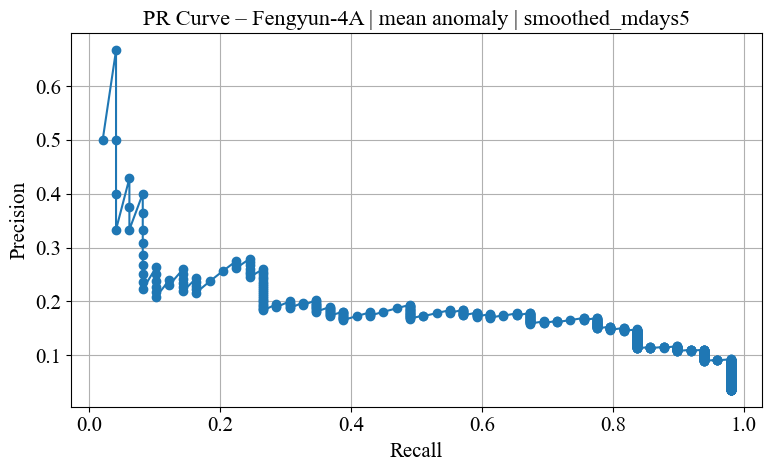

[SMOOTHED] | mdays=5 | Threshold=0.2124 | P=0.17 | R=0.78 | F1=0.28 | F2=0.45
[SMOOTHED] TP=38, FP=187, FN=11

[SMOOTHED] Using BEST mdays = ±5 for anomaly detection (F2 = 0.45)


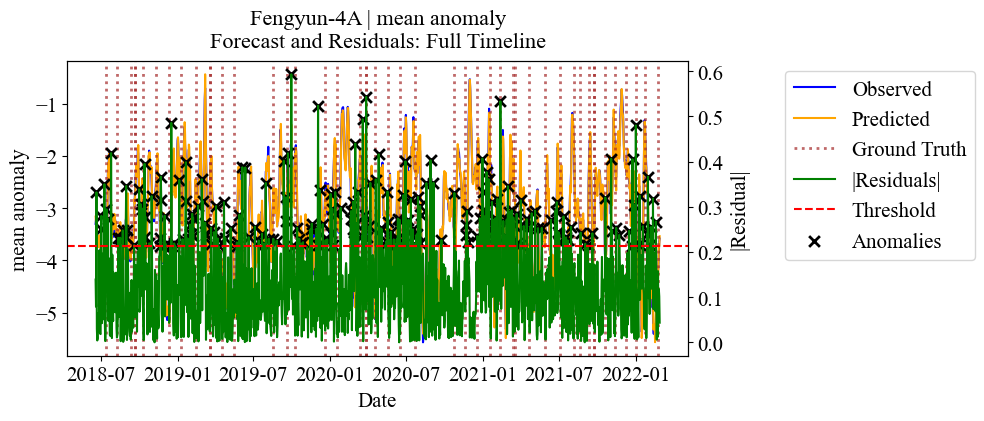

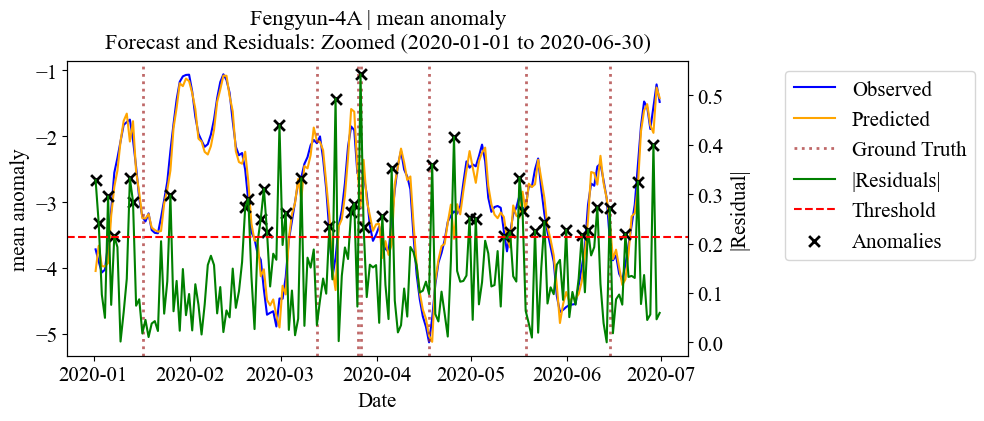

mean anomaly: 0 outliers flagged
Total interpolated outliers: 0
No outliers found: skipping cleaned ARIMA for Fengyun-4A | mean anomaly

==Forecasting and Anomaly Detection: Fengyun-4A | eccentricity ==


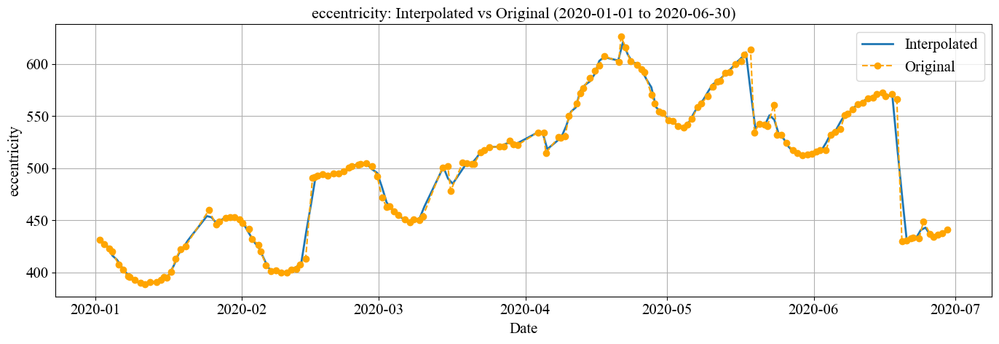

ADF p-value (d=0): 0.03734
Series is stationary at d=0
Best ARIMA Order: (5, 0, 9), AIC: 10239.73, Models Tried: 110, Time: 194.7s


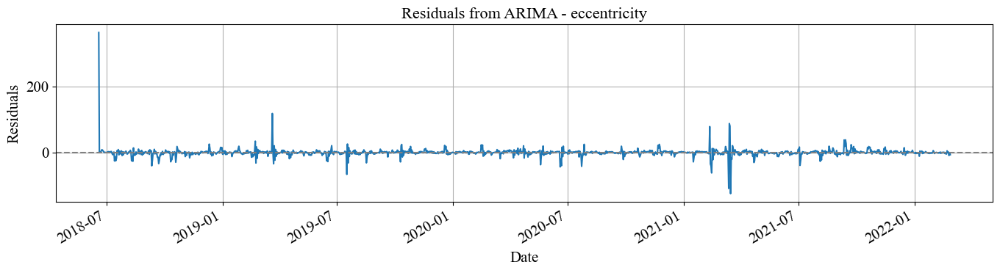

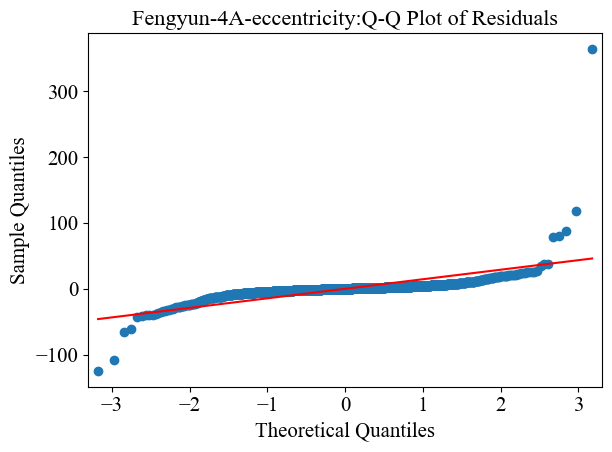


[RAW] Computing PR Curve - Fengyun-4A | eccentricity | ±3 days


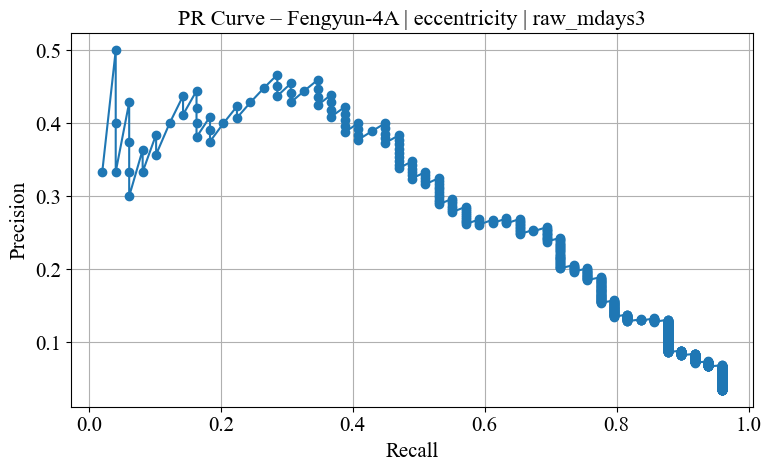

[RAW] | mdays=3 | Threshold=12.0997 | P=0.26 | R=0.69 | F1=0.38 | F2=0.52
[RAW] TP=34, FP=98, FN=15

[RAW] Computing PR Curve - Fengyun-4A | eccentricity | ±5 days


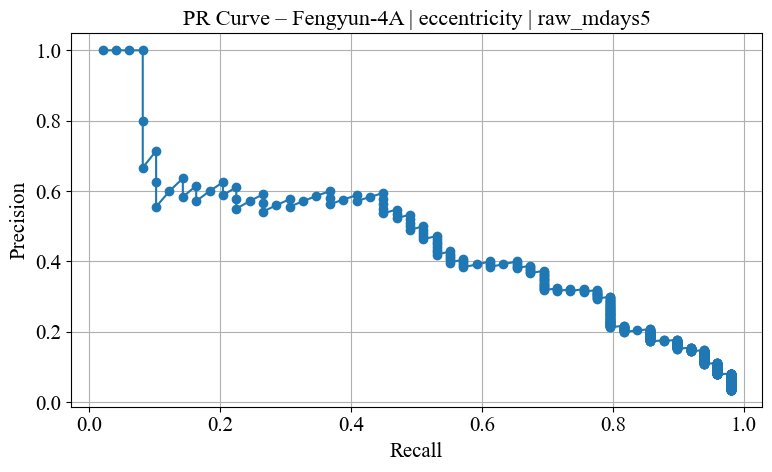

[RAW] | mdays=5 | Threshold=12.8150 | P=0.32 | R=0.78 | F1=0.45 | F2=0.60
[RAW] TP=38, FP=81, FN=11

[RAW] Using BEST mdays = ±5 for anomaly detection (F2 = 0.60)


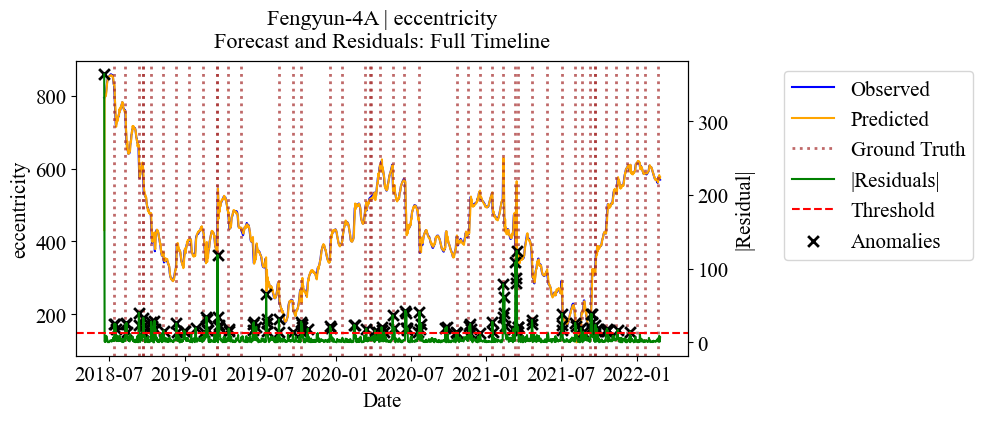

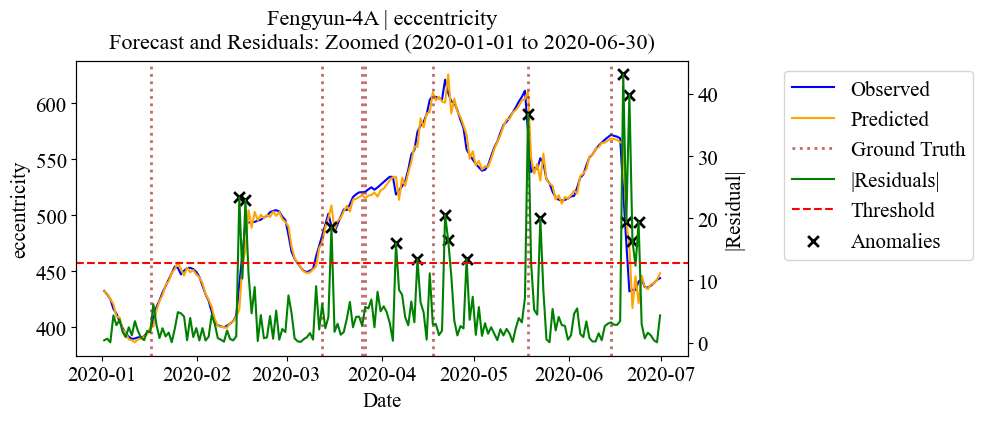


[SMOOTHED] Running smoothed ARIMA on Fengyun-4A | eccentricity
ADF p-value (d=0): 0.02699
Series is stationary at d=0
Best ARIMA Order: (1, 0, 13), AIC: 5088.74, Models Tried: 54, Time: 82.7s


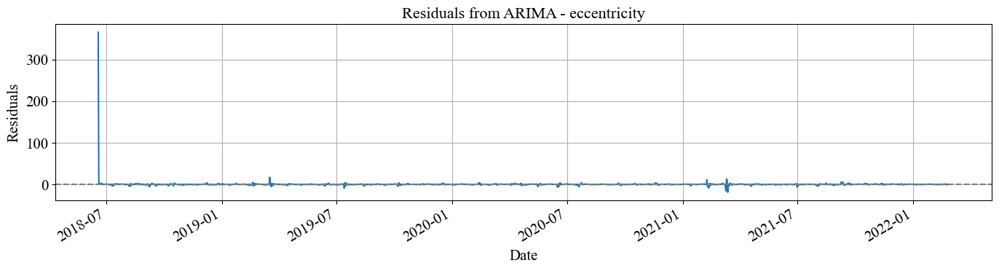

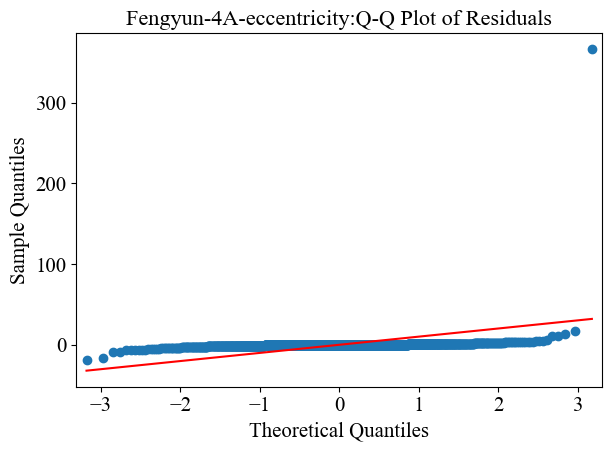


[SMOOTHED] Computing PR Curve – Fengyun-4A | eccentricity | ±3 days


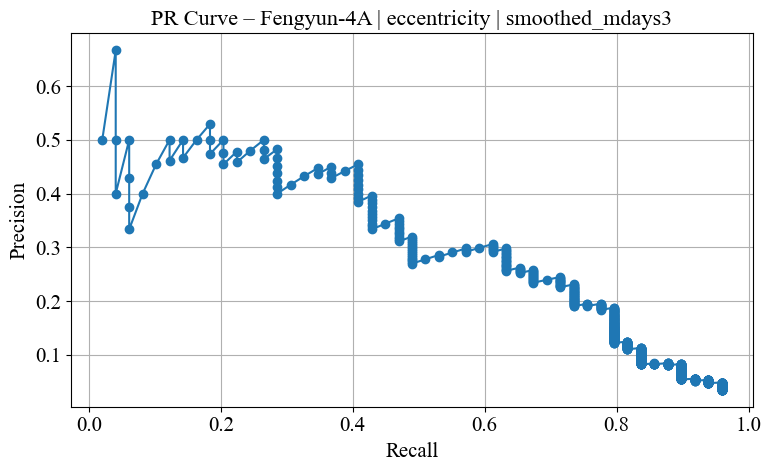

[SMOOTHED] | mdays=3 | Threshold=2.1250 | P=0.30 | R=0.63 | F1=0.41 | F2=0.52
[SMOOTHED] TP=31, FP=73, FN=18

[SMOOTHED] Computing PR Curve – Fengyun-4A | eccentricity | ±5 days


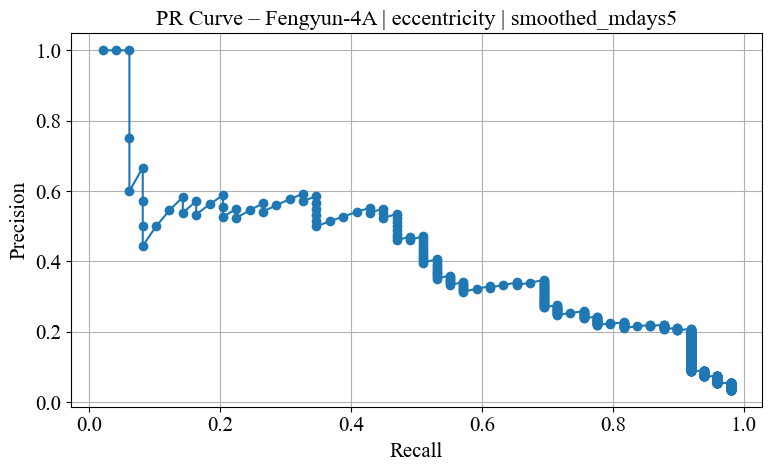

[SMOOTHED] | mdays=5 | Threshold=2.1843 | P=0.35 | R=0.69 | F1=0.46 | F2=0.58
[SMOOTHED] TP=34, FP=64, FN=15

[SMOOTHED] Using BEST mdays = ±5 for anomaly detection (F2 = 0.58)


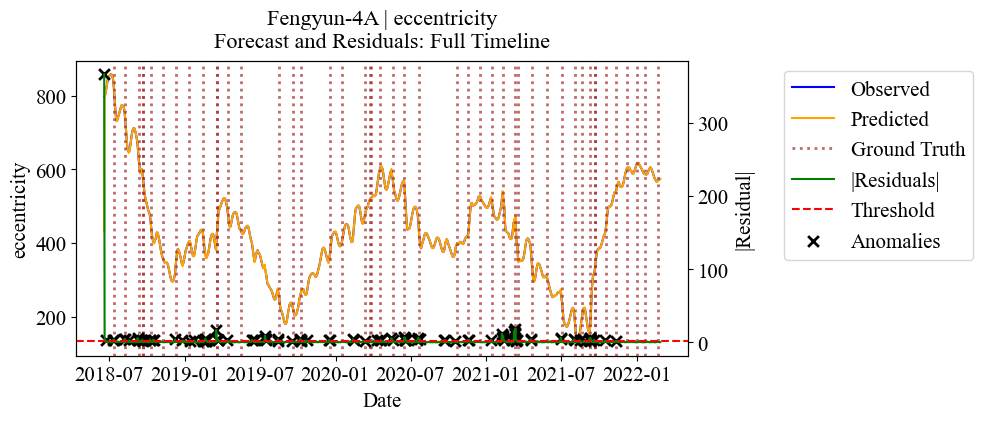

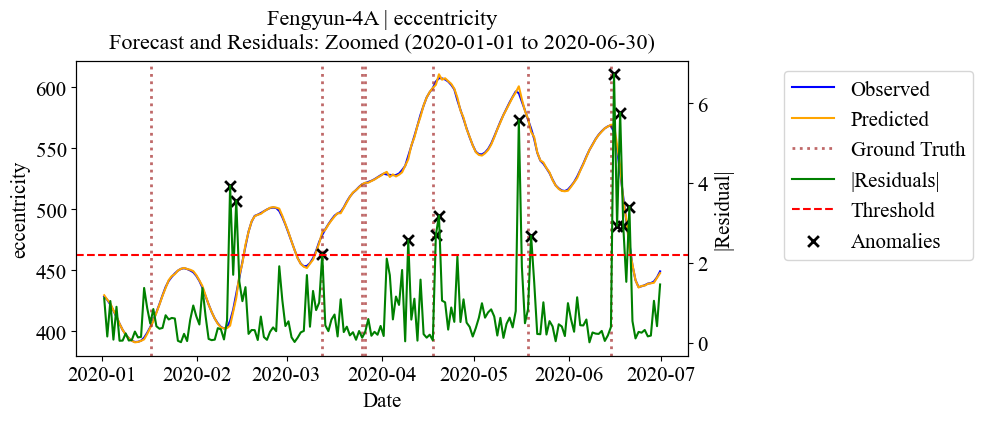

eccentricity: 0 outliers flagged
Total interpolated outliers: 0
No outliers found: skipping cleaned ARIMA for Fengyun-4A | eccentricity

==Forecasting and Anomaly Detection: SARAL | Brouwer mean motion ==


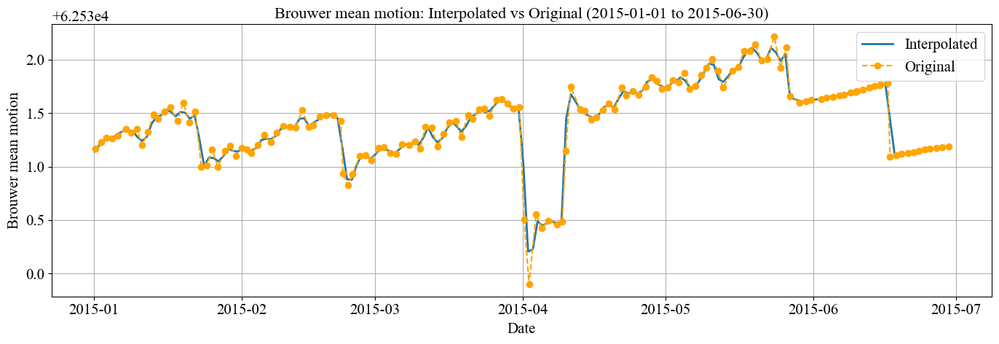

ADF p-value (d=0): 0.42452
ADF p-value (d=1): 0.00000
Series is stationary after differencing → d=1
Best ARIMA Order: (0, 1, 5), AIC: -2833.71, Models Tried: 31, Time: 31.9s


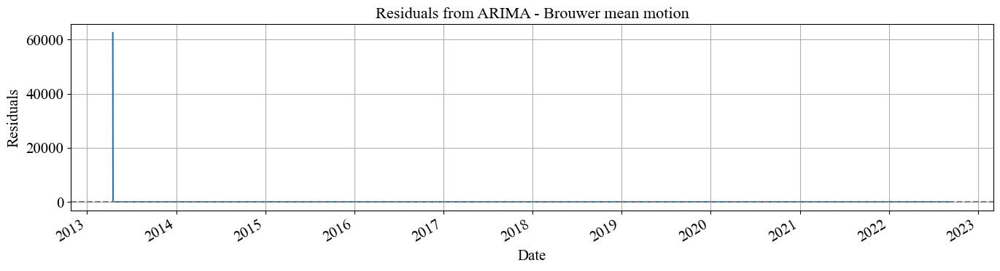

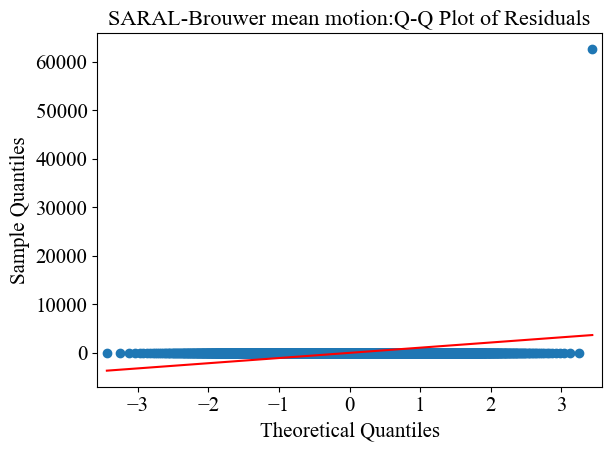


[RAW] Computing PR Curve - SARAL | Brouwer mean motion | ±3 days


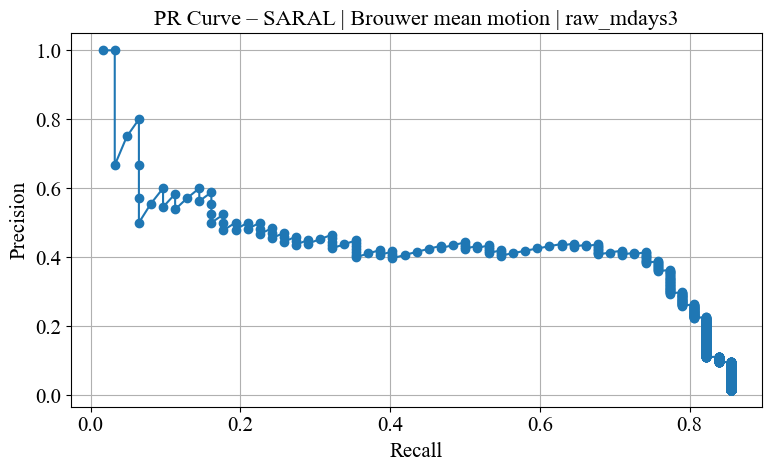

[RAW] | mdays=3 | Threshold=0.1642 | P=0.41 | R=0.74 | F1=0.53 | F2=0.64
[RAW] TP=46, FP=65, FN=16

[RAW] Computing PR Curve - SARAL | Brouwer mean motion | ±5 days


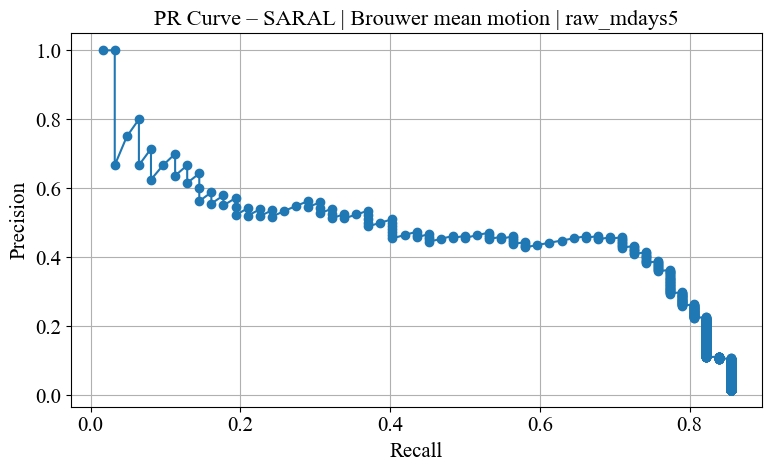

[RAW] | mdays=5 | Threshold=0.1642 | P=0.41 | R=0.74 | F1=0.53 | F2=0.64
[RAW] TP=46, FP=65, FN=16

[RAW] Using BEST mdays = ±3 for anomaly detection (F2 = 0.64)


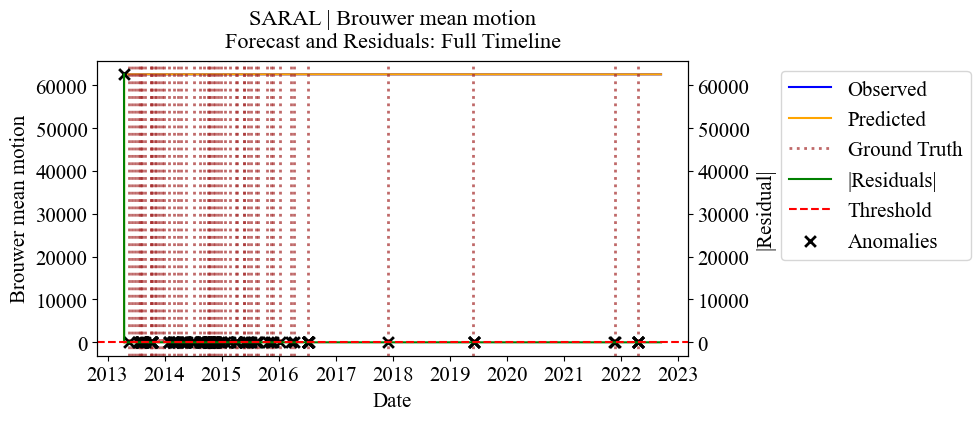

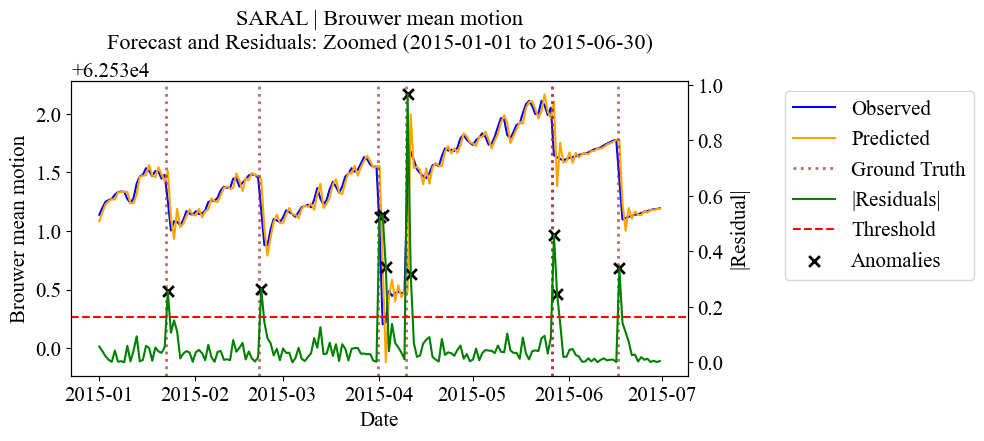


[SMOOTHED] Running smoothed ARIMA on SARAL | Brouwer mean motion
ADF p-value (d=0): 0.43332
ADF p-value (d=1): 0.00000
Series is stationary after differencing → d=1
Best ARIMA Order: (1, 1, 14), AIC: -16143.24, Models Tried: 55, Time: 140.5s


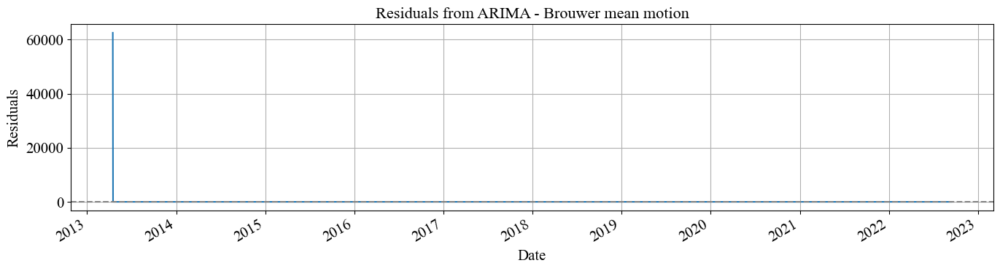

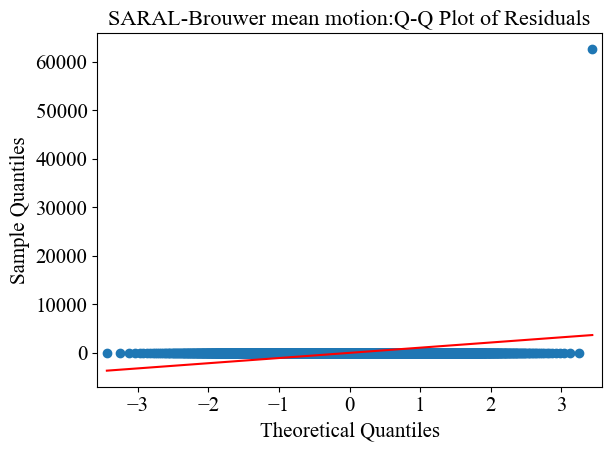


[SMOOTHED] Computing PR Curve – SARAL | Brouwer mean motion | ±3 days


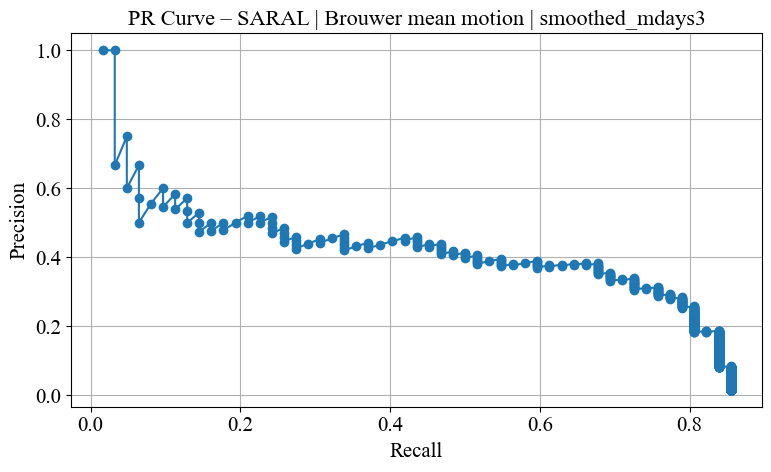

[SMOOTHED] | mdays=3 | Threshold=0.0211 | P=0.34 | R=0.73 | F1=0.46 | F2=0.59
[SMOOTHED] TP=45, FP=88, FN=17

[SMOOTHED] Computing PR Curve – SARAL | Brouwer mean motion | ±5 days


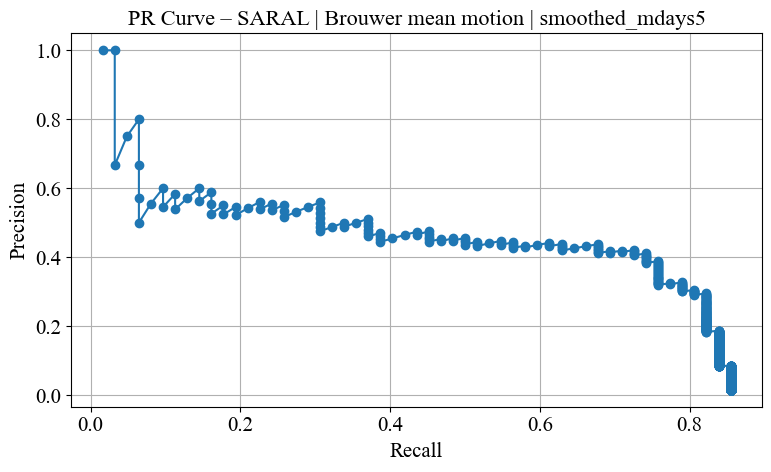

[SMOOTHED] | mdays=5 | Threshold=0.0234 | P=0.41 | R=0.74 | F1=0.53 | F2=0.64
[SMOOTHED] TP=46, FP=66, FN=16

[SMOOTHED] Using BEST mdays = ±5 for anomaly detection (F2 = 0.64)


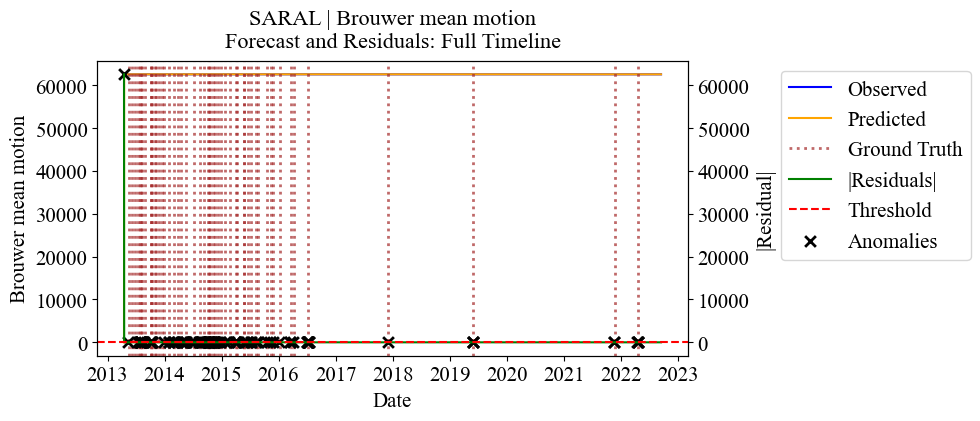

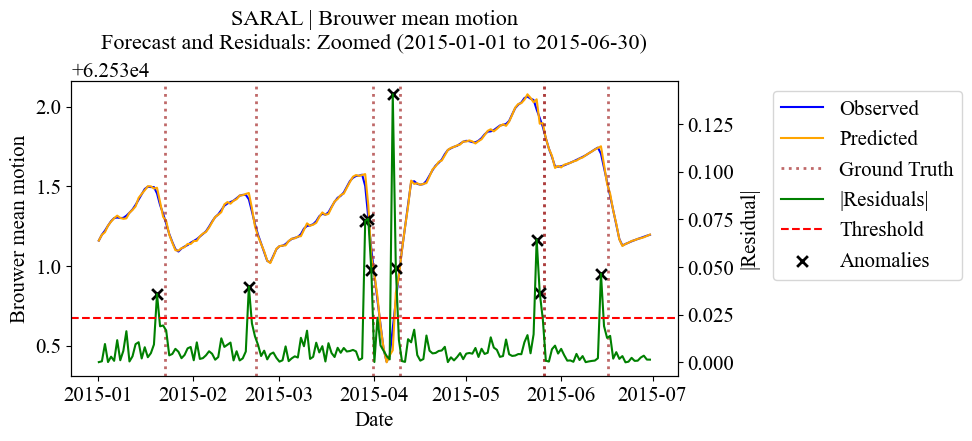

Brouwer mean motion: 0 outliers flagged
Total interpolated outliers: 0
No outliers found: skipping cleaned ARIMA for SARAL | Brouwer mean motion

==Forecasting and Anomaly Detection: SARAL | mean anomaly ==


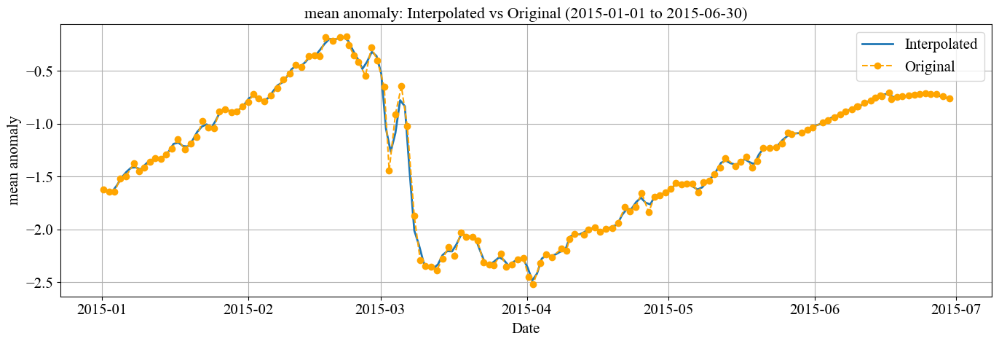

ADF p-value (d=0): 0.00000
Series is stationary at d=0
Best ARIMA Order: (3, 0, 8), AIC: -9398.24, Models Tried: 79, Time: 281.8s


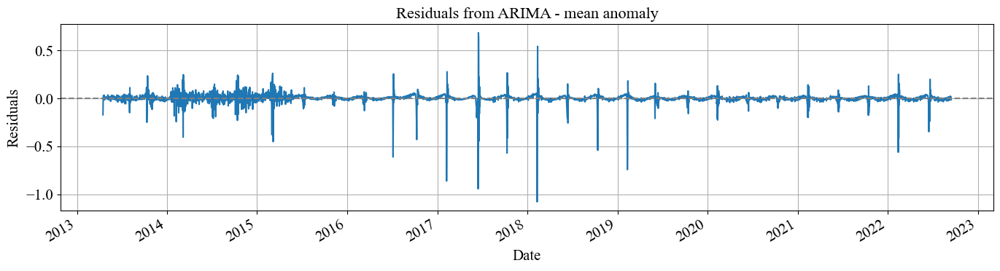

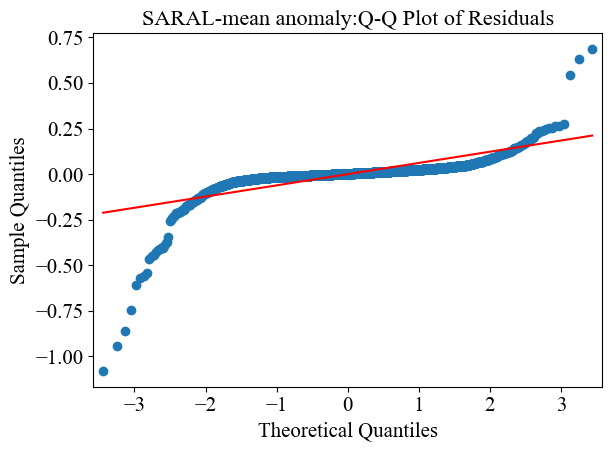


[RAW] Computing PR Curve - SARAL | mean anomaly | ±3 days


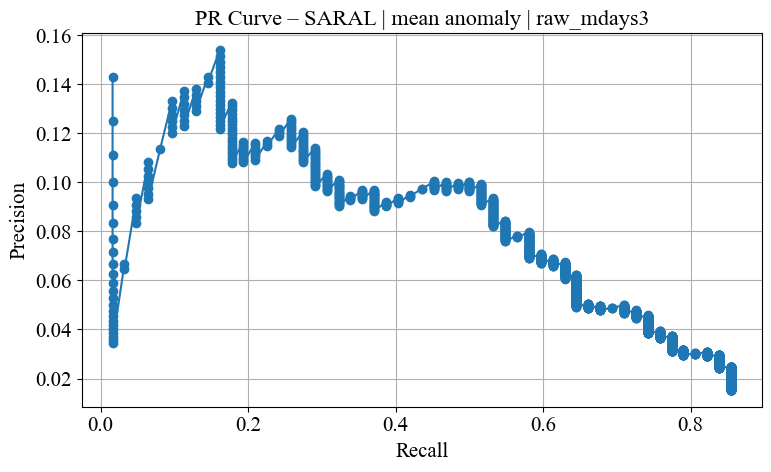

[RAW] | mdays=3 | Threshold=0.0502 | P=0.10 | R=0.52 | F1=0.17 | F2=0.28
[RAW] TP=32, FP=290, FN=30

[RAW] Computing PR Curve - SARAL | mean anomaly | ±5 days


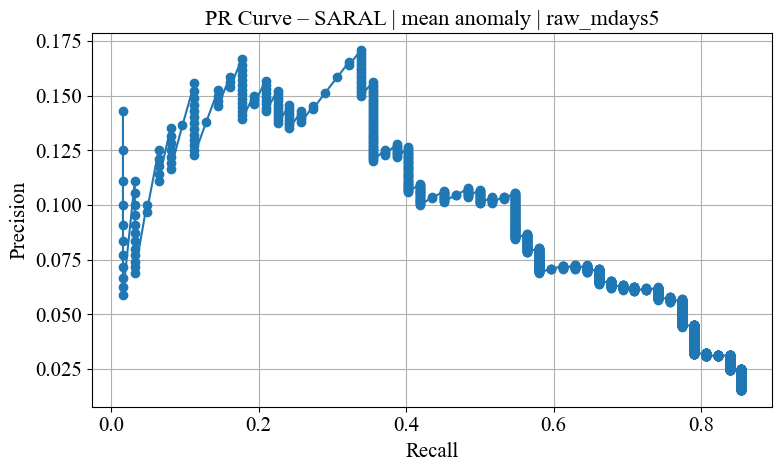

[RAW] | mdays=5 | Threshold=0.0502 | P=0.11 | R=0.55 | F1=0.18 | F2=0.30
[RAW] TP=34, FP=288, FN=28

[RAW] Using BEST mdays = ±5 for anomaly detection (F2 = 0.30)


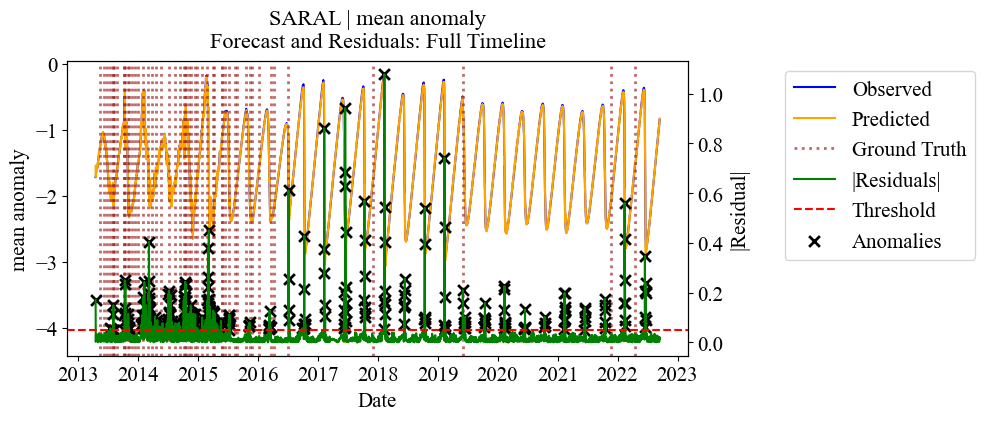

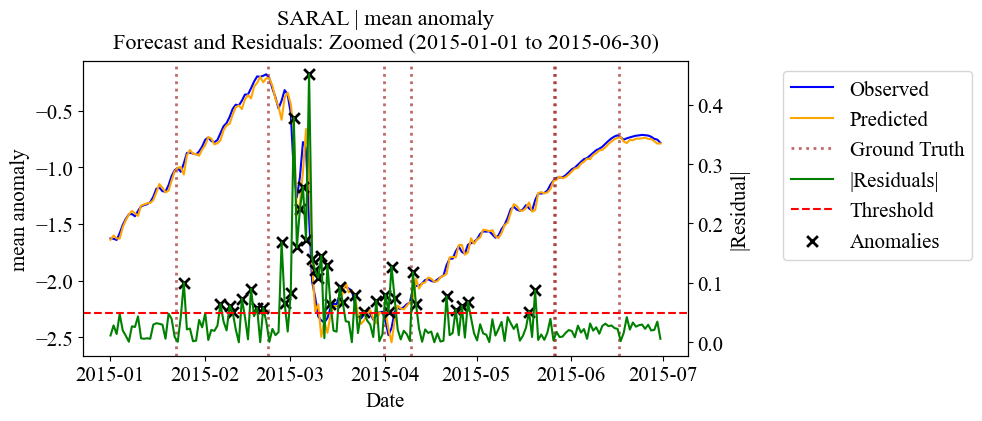


[SMOOTHED] Running smoothed ARIMA on SARAL | mean anomaly
ADF p-value (d=0): 0.00000
Series is stationary at d=0
Best ARIMA Order: (2, 0, 13), AIC: -22689.19, Models Tried: 69, Time: 286.2s


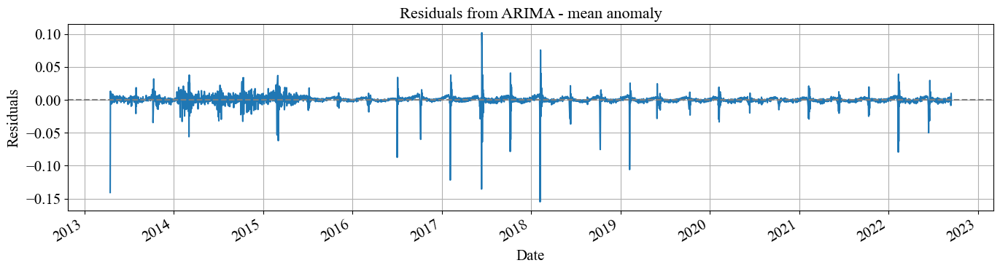

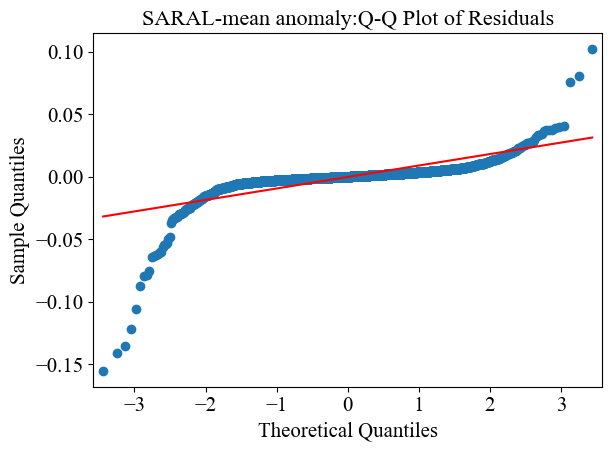


[SMOOTHED] Computing PR Curve – SARAL | mean anomaly | ±3 days


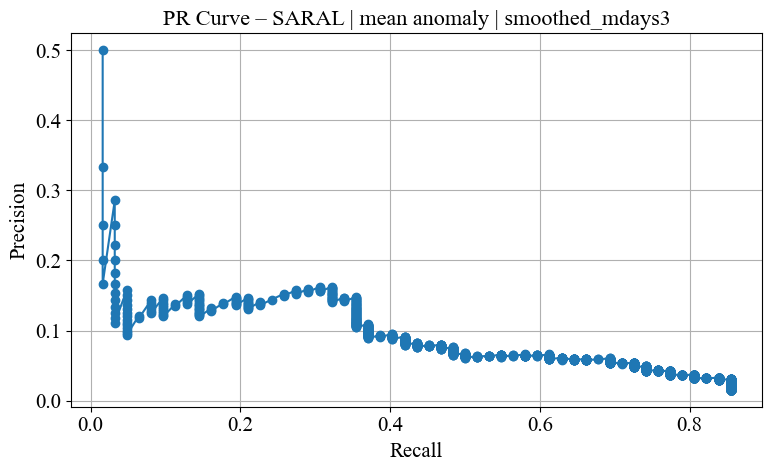

[SMOOTHED] | mdays=3 | Threshold=0.0142 | P=0.15 | R=0.35 | F1=0.21 | F2=0.28
[SMOOTHED] TP=22, FP=127, FN=40

[SMOOTHED] Computing PR Curve – SARAL | mean anomaly | ±5 days


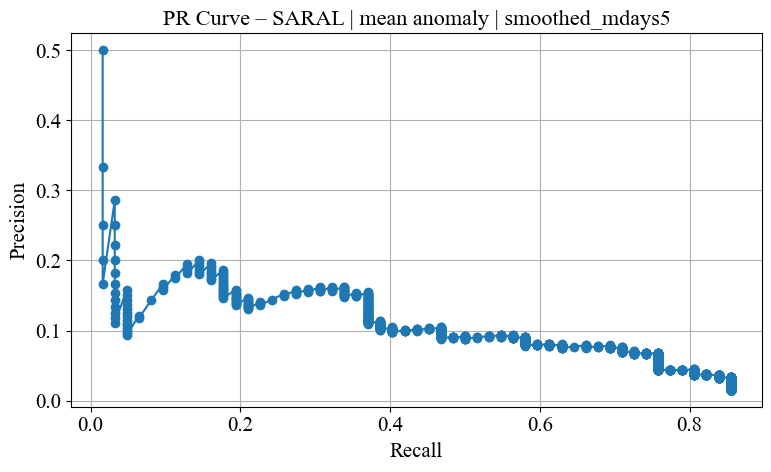

[SMOOTHED] | mdays=5 | Threshold=0.0142 | P=0.15 | R=0.37 | F1=0.22 | F2=0.29
[SMOOTHED] TP=23, FP=126, FN=39

[SMOOTHED] Using BEST mdays = ±5 for anomaly detection (F2 = 0.29)


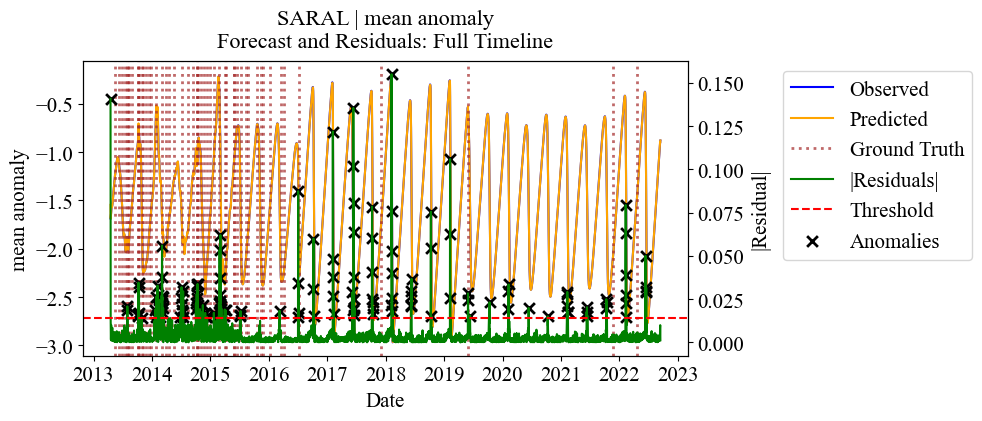

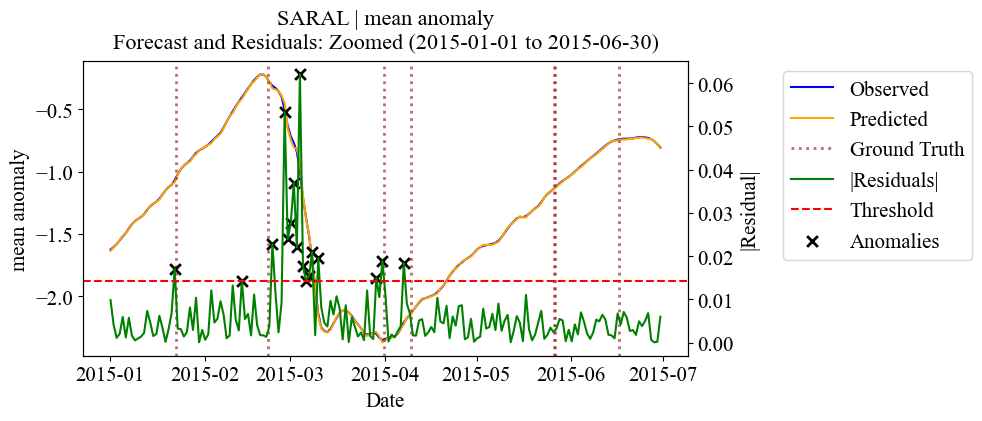

mean anomaly: 0 outliers flagged
Total interpolated outliers: 0
No outliers found: skipping cleaned ARIMA for SARAL | mean anomaly

==Forecasting and Anomaly Detection: SARAL | eccentricity ==


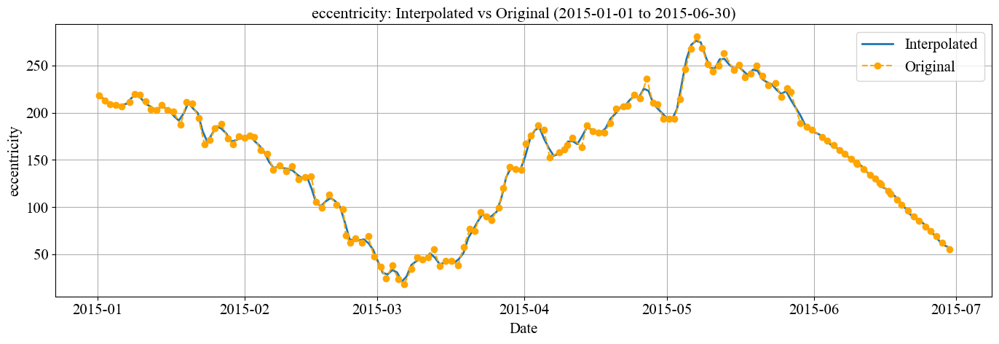

ADF p-value (d=0): 0.00000
Series is stationary at d=0
Best ARIMA Order: (2, 0, 14), AIC: 19400.12, Models Tried: 70, Time: 204.5s


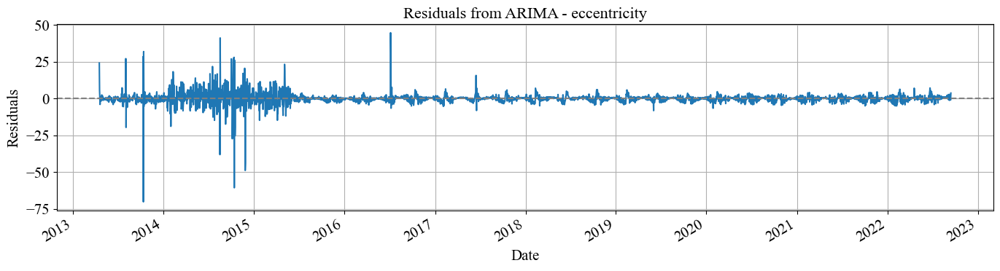

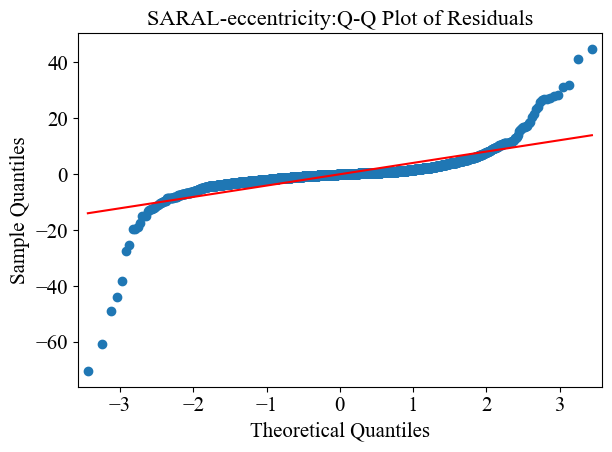


[RAW] Computing PR Curve - SARAL | eccentricity | ±3 days


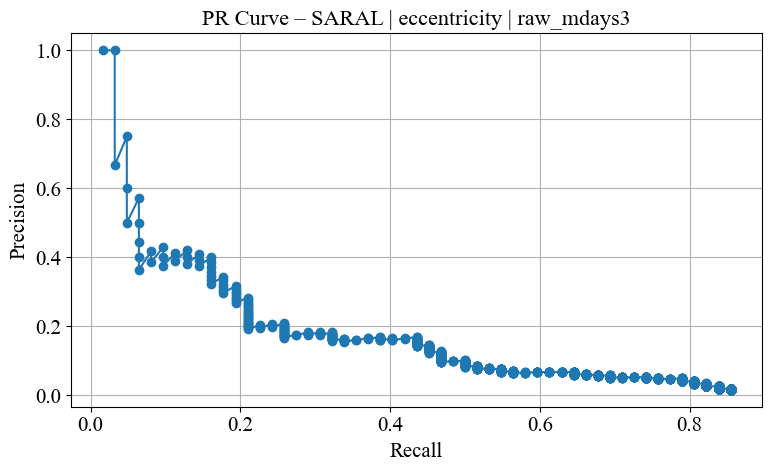

[RAW] | mdays=3 | Threshold=6.7586 | P=0.17 | R=0.44 | F1=0.24 | F2=0.33
[RAW] TP=27, FP=133, FN=35

[RAW] Computing PR Curve - SARAL | eccentricity | ±5 days


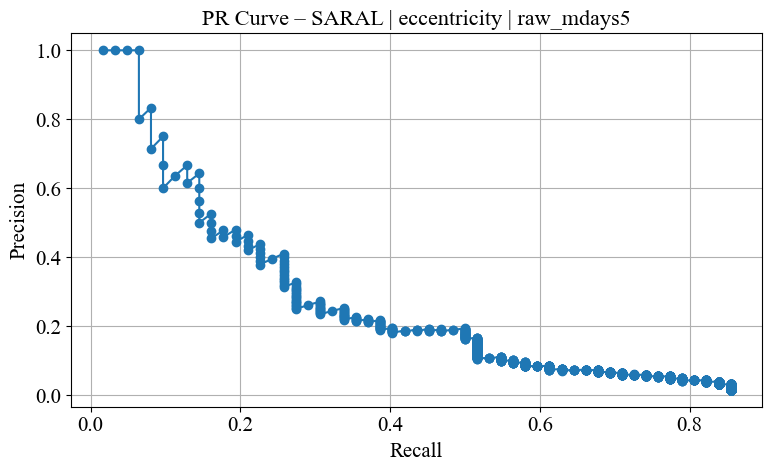

[RAW] | mdays=5 | Threshold=6.7586 | P=0.19 | R=0.50 | F1=0.28 | F2=0.38
[RAW] TP=31, FP=129, FN=31

[RAW] Using BEST mdays = ±5 for anomaly detection (F2 = 0.38)


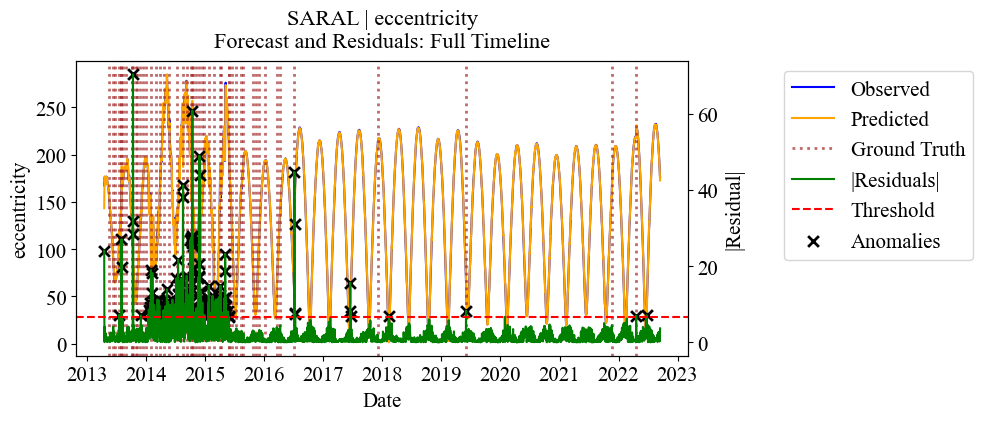

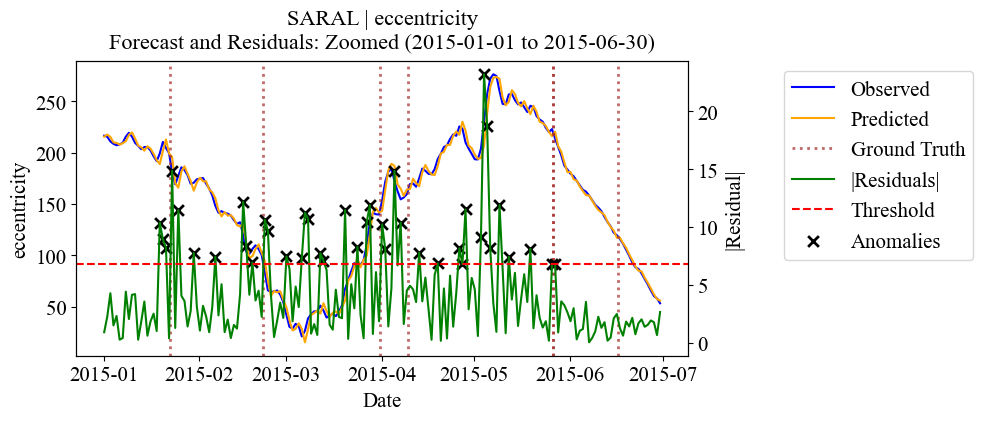


[SMOOTHED] Running smoothed ARIMA on SARAL | eccentricity
ADF p-value (d=0): 0.00000
Series is stationary at d=0
Best ARIMA Order: (2, 0, 14), AIC: 6094.79, Models Tried: 70, Time: 293.2s


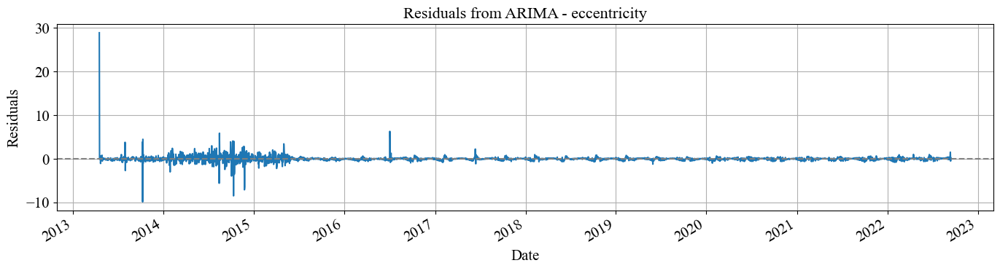

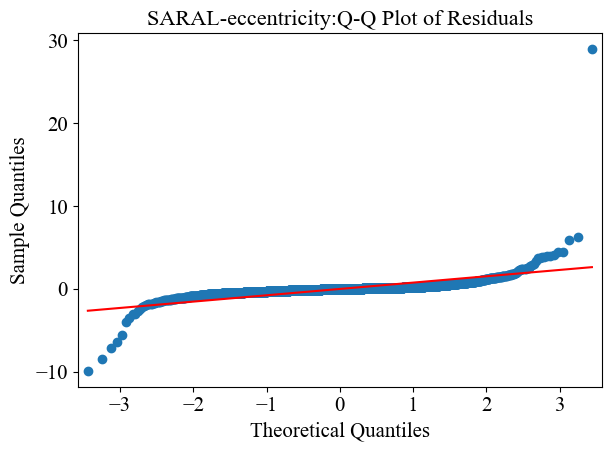


[SMOOTHED] Computing PR Curve – SARAL | eccentricity | ±3 days


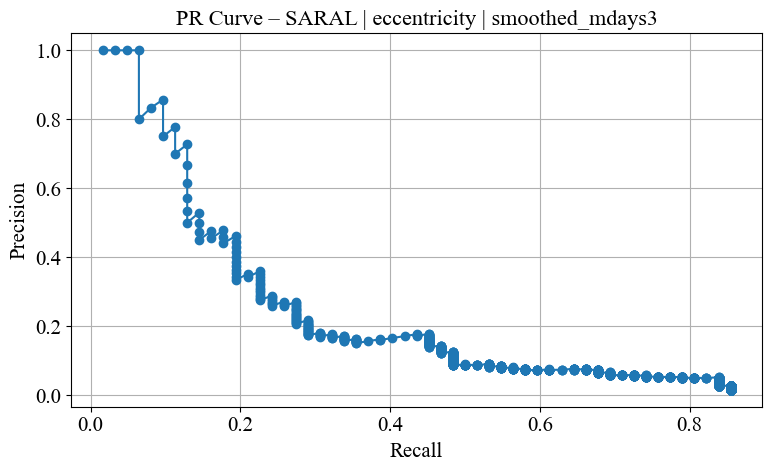

[SMOOTHED] | mdays=3 | Threshold=0.9837 | P=0.18 | R=0.45 | F1=0.25 | F2=0.34
[SMOOTHED] TP=28, FP=130, FN=34

[SMOOTHED] Computing PR Curve – SARAL | eccentricity | ±5 days


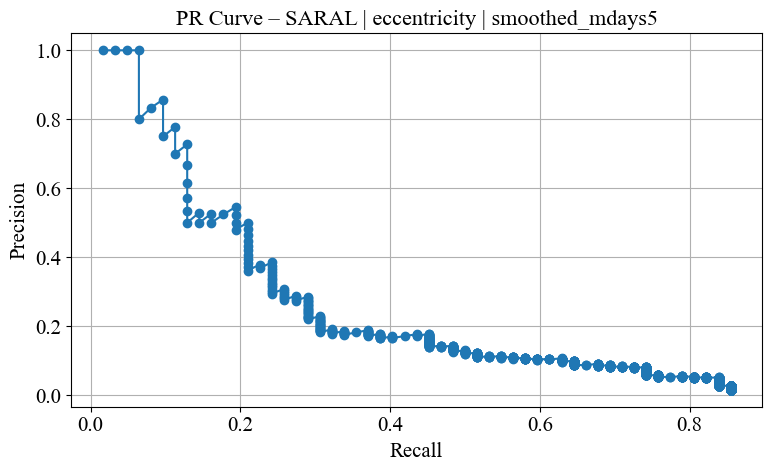

[SMOOTHED] | mdays=5 | Threshold=0.9837 | P=0.18 | R=0.45 | F1=0.25 | F2=0.34
[SMOOTHED] TP=28, FP=130, FN=34

[SMOOTHED] Using BEST mdays = ±3 for anomaly detection (F2 = 0.34)


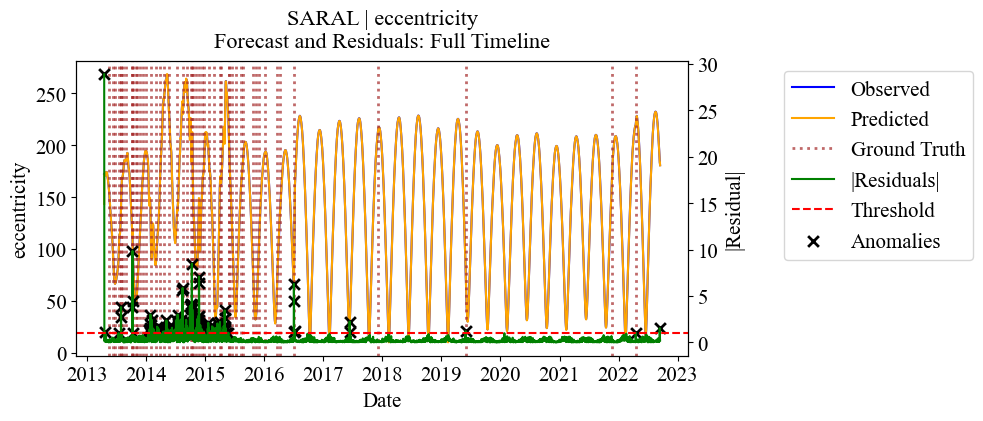

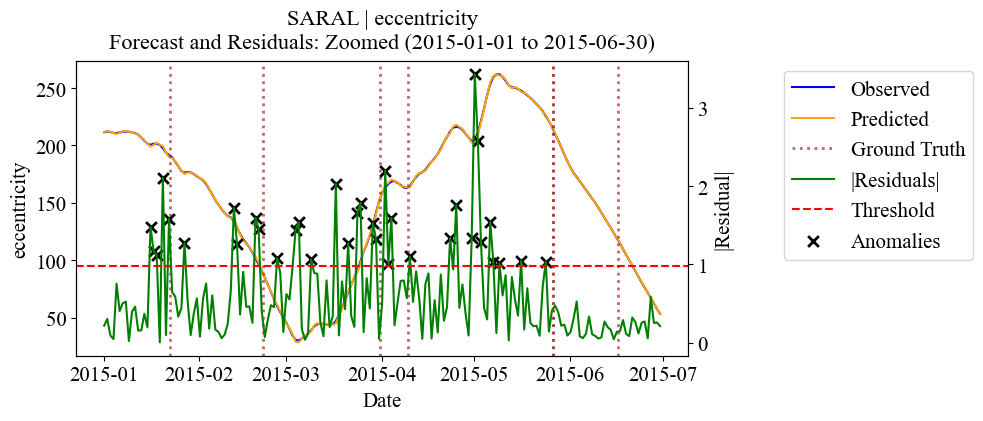

eccentricity: 0 outliers flagged
Total interpolated outliers: 0
No outliers found: skipping cleaned ARIMA for SARAL | eccentricity

==Forecasting and Anomaly Detection: Haiyang-2A | Brouwer mean motion ==


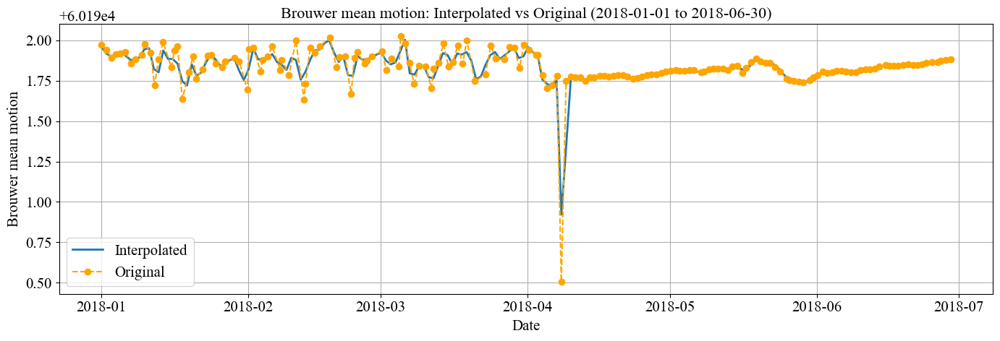

ADF p-value (d=0): 0.75227
ADF p-value (d=1): 0.00000
Series is stationary after differencing → d=1
Best ARIMA Order: (2, 1, 2), AIC: -1632.86, Models Tried: 58, Time: 58.6s


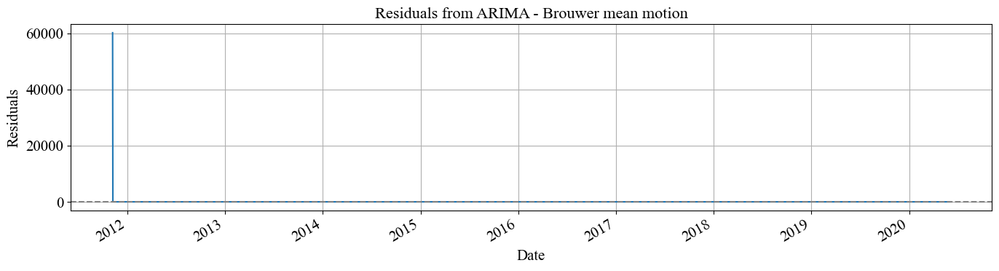

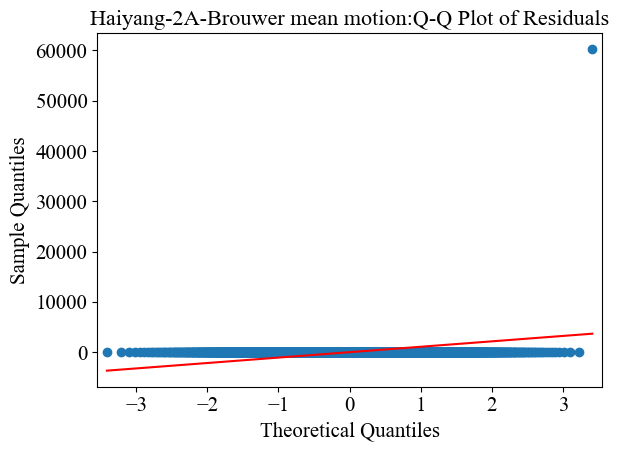


[RAW] Computing PR Curve - Haiyang-2A | Brouwer mean motion | ±3 days


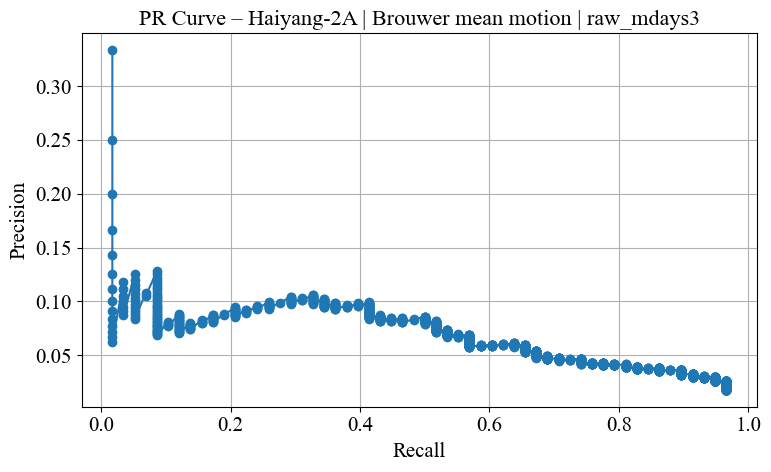

[RAW] | mdays=3 | Threshold=0.0854 | P=0.09 | R=0.50 | F1=0.15 | F2=0.25
[RAW] TP=29, FP=309, FN=29

[RAW] Computing PR Curve - Haiyang-2A | Brouwer mean motion | ±5 days


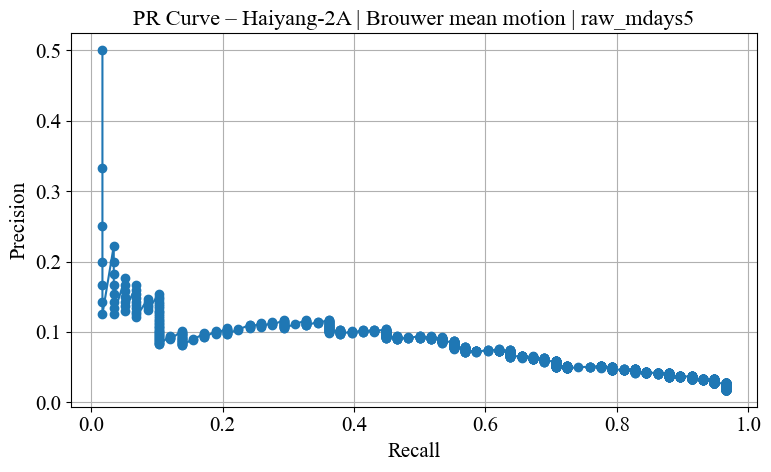

[RAW] | mdays=5 | Threshold=0.0855 | P=0.09 | R=0.53 | F1=0.16 | F2=0.27
[RAW] TP=31, FP=305, FN=27

[RAW] Using BEST mdays = ±5 for anomaly detection (F2 = 0.27)


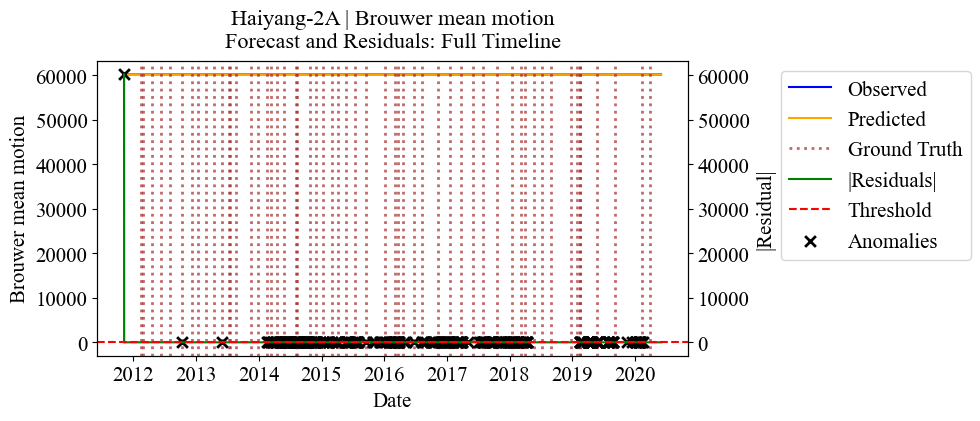

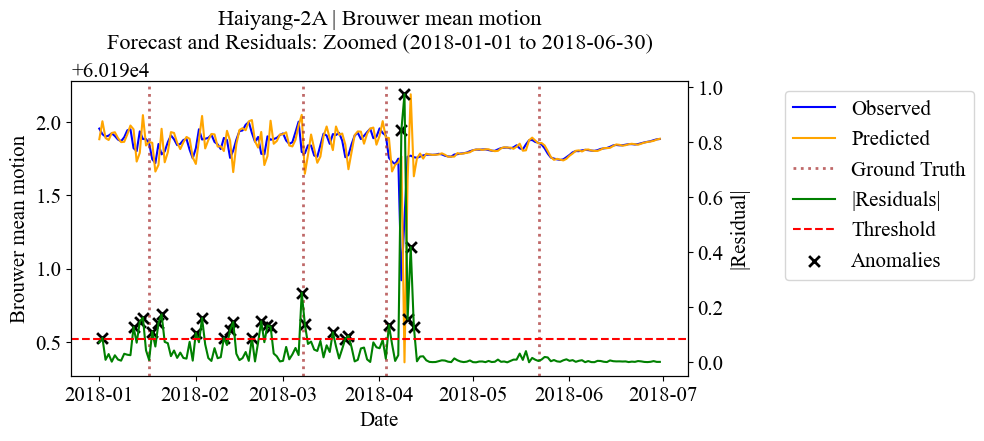


[SMOOTHED] Running smoothed ARIMA on Haiyang-2A | Brouwer mean motion
ADF p-value (d=0): 0.70104
ADF p-value (d=1): 0.00000
Series is stationary after differencing → d=1
Best ARIMA Order: (0, 1, 11), AIC: -13742.84, Models Tried: 37, Time: 76.8s


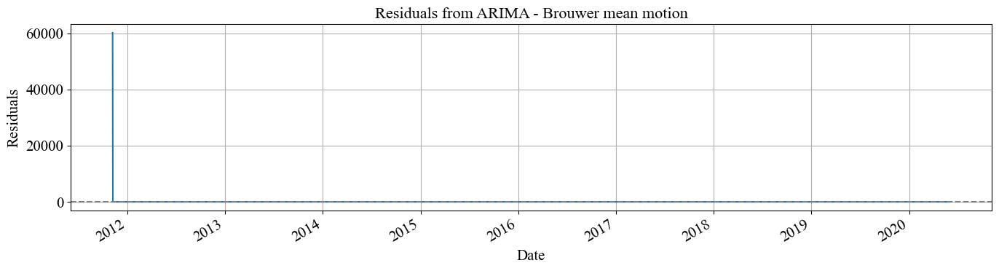

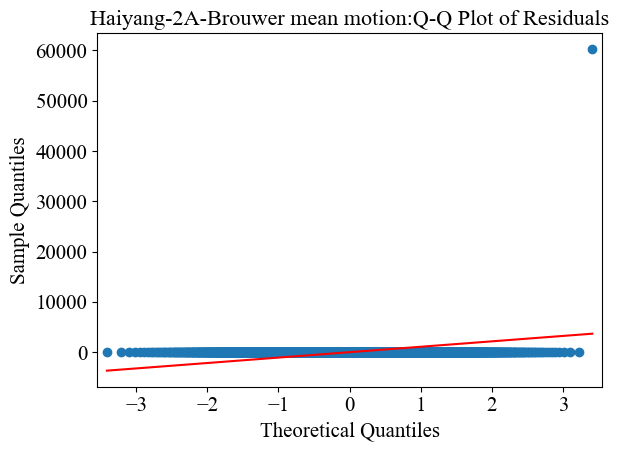


[SMOOTHED] Computing PR Curve – Haiyang-2A | Brouwer mean motion | ±3 days


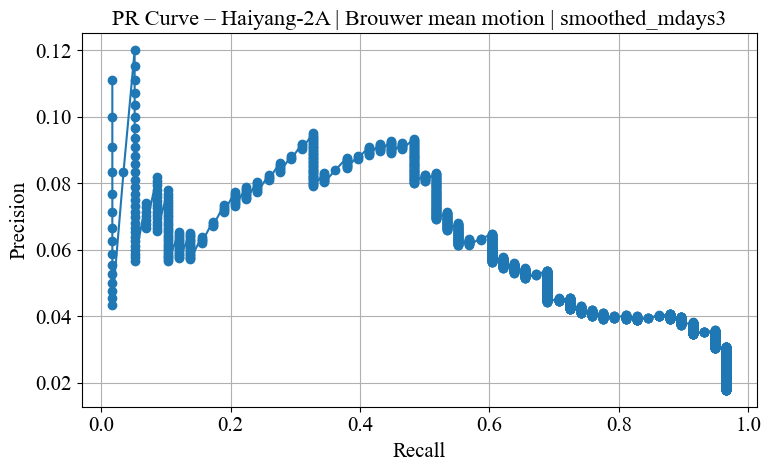

[SMOOTHED] | mdays=3 | Threshold=0.0148 | P=0.09 | R=0.48 | F1=0.16 | F2=0.26
[SMOOTHED] TP=28, FP=272, FN=30

[SMOOTHED] Computing PR Curve – Haiyang-2A | Brouwer mean motion | ±5 days


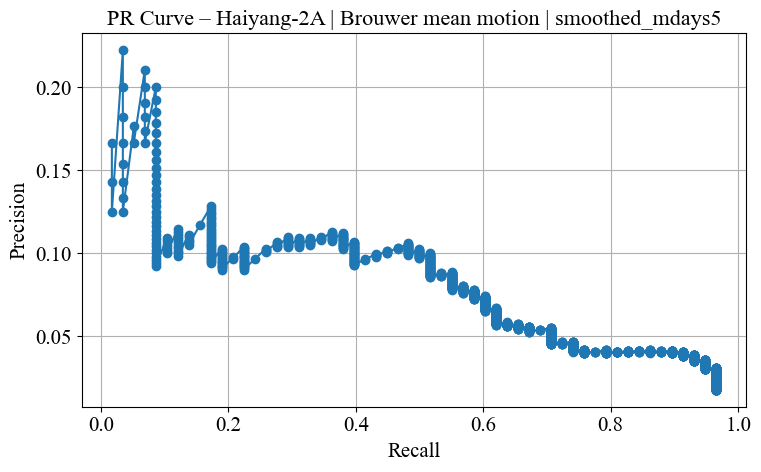

[SMOOTHED] | mdays=5 | Threshold=0.0162 | P=0.11 | R=0.48 | F1=0.17 | F2=0.28
[SMOOTHED] TP=28, FP=236, FN=30

[SMOOTHED] Using BEST mdays = ±5 for anomaly detection (F2 = 0.28)


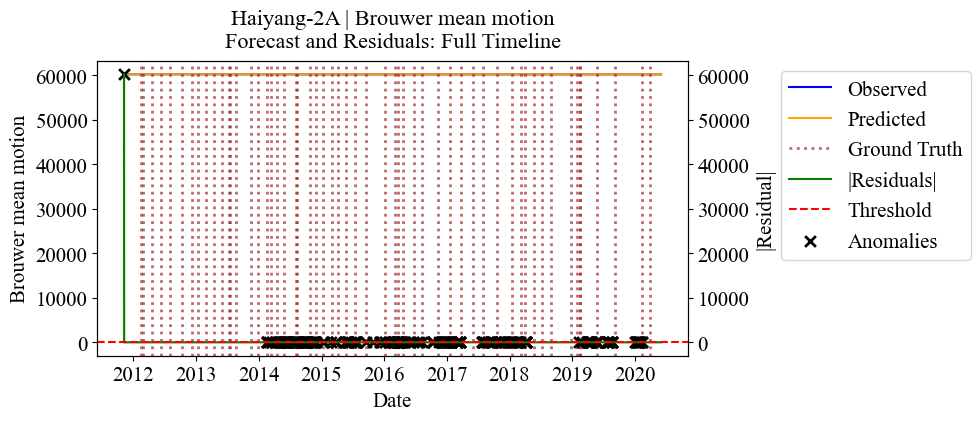

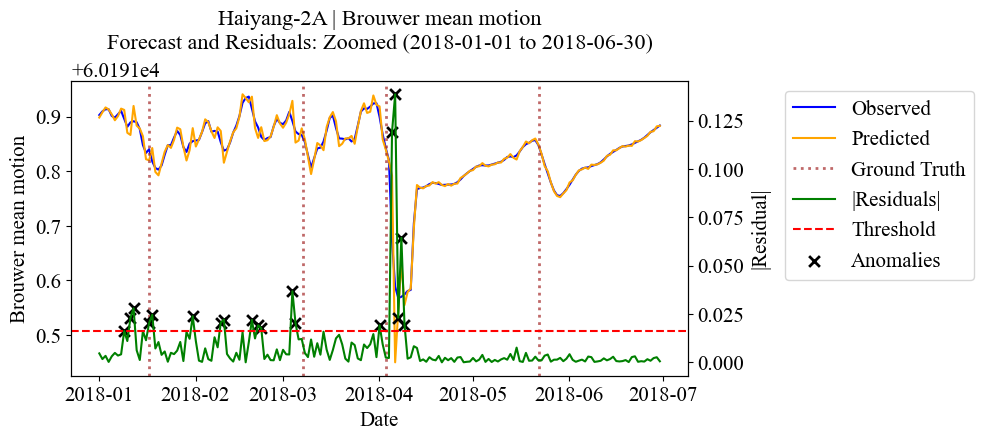

Brouwer mean motion: 0 outliers flagged
Total interpolated outliers: 0
No outliers found: skipping cleaned ARIMA for Haiyang-2A | Brouwer mean motion

==Forecasting and Anomaly Detection: Haiyang-2A | mean anomaly ==


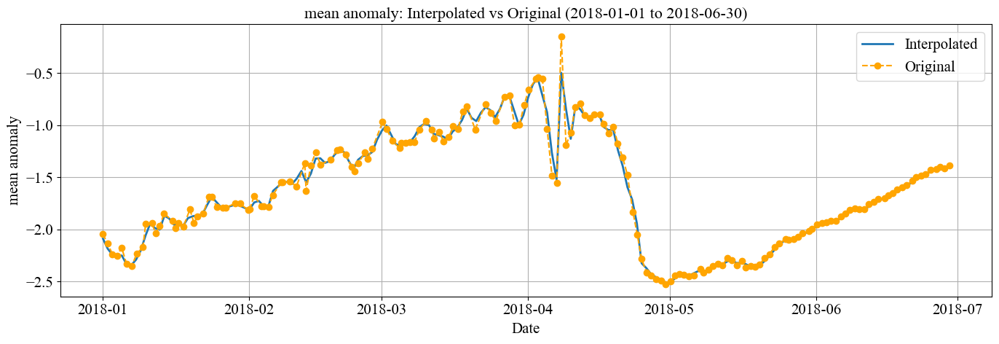

ADF p-value (d=0): 0.00000
Series is stationary at d=0
Best ARIMA Order: (2, 0, 9), AIC: 1339.47, Models Tried: 65, Time: 155.8s


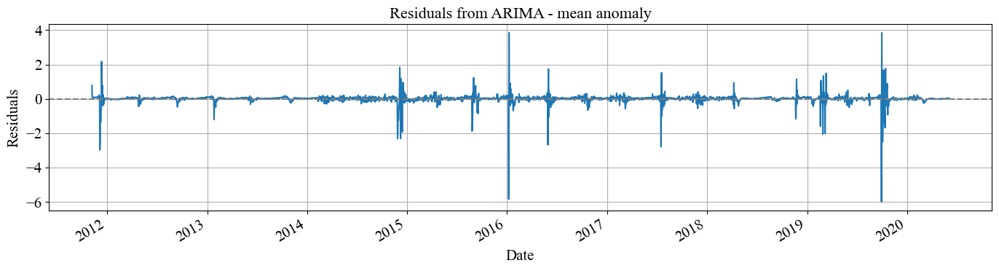

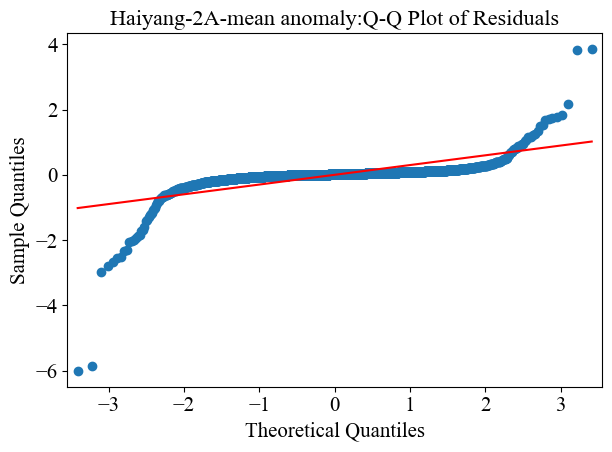


[RAW] Computing PR Curve - Haiyang-2A | mean anomaly | ±3 days


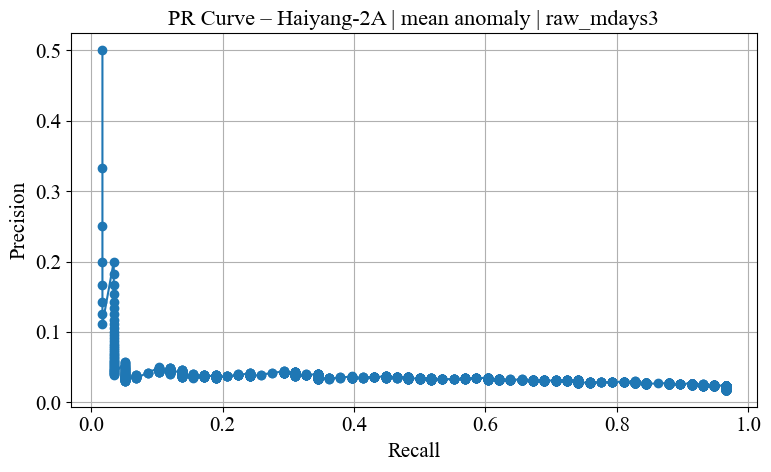

[RAW] | mdays=3 | Threshold=0.0764 | P=0.04 | R=0.60 | F1=0.07 | F2=0.14
[RAW] TP=35, FP=962, FN=23

[RAW] Computing PR Curve - Haiyang-2A | mean anomaly | ±5 days


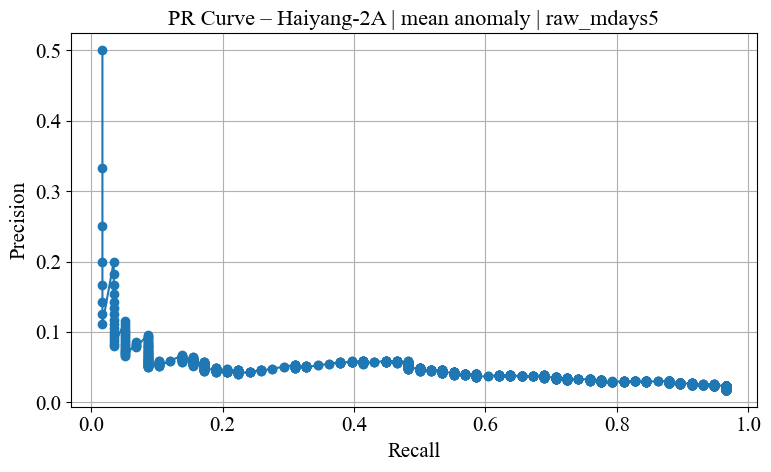

[RAW] | mdays=5 | Threshold=0.1330 | P=0.06 | R=0.48 | F1=0.10 | F2=0.20
[RAW] TP=28, FP=453, FN=30

[RAW] Using BEST mdays = ±5 for anomaly detection (F2 = 0.20)


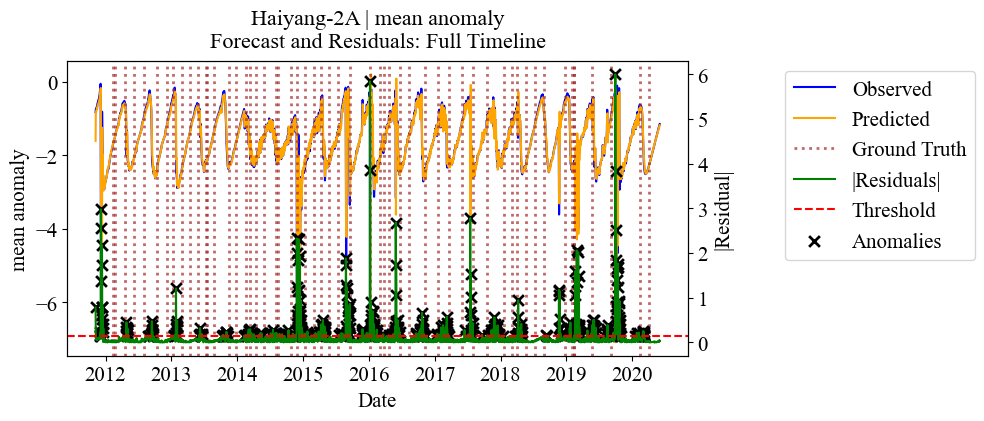

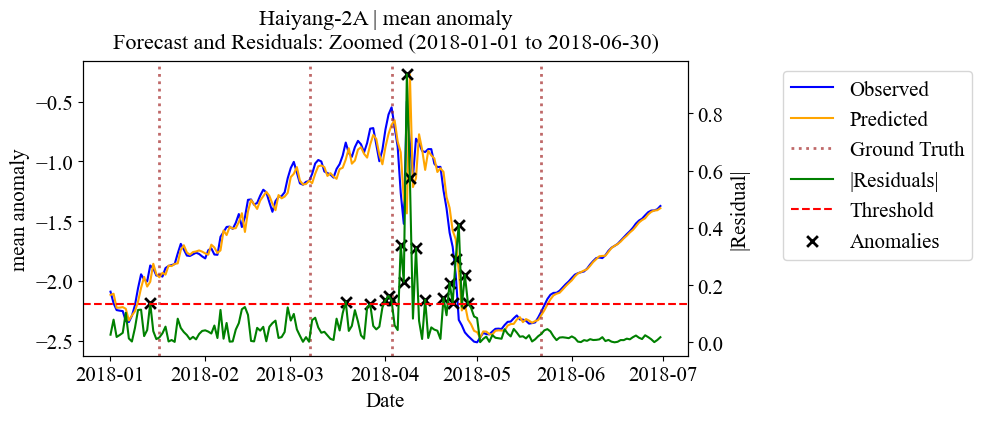


[SMOOTHED] Running smoothed ARIMA on Haiyang-2A | mean anomaly
ADF p-value (d=0): 0.00000
Series is stationary at d=0
Best ARIMA Order: (2, 0, 14), AIC: -10767.65, Models Tried: 70, Time: 267.0s


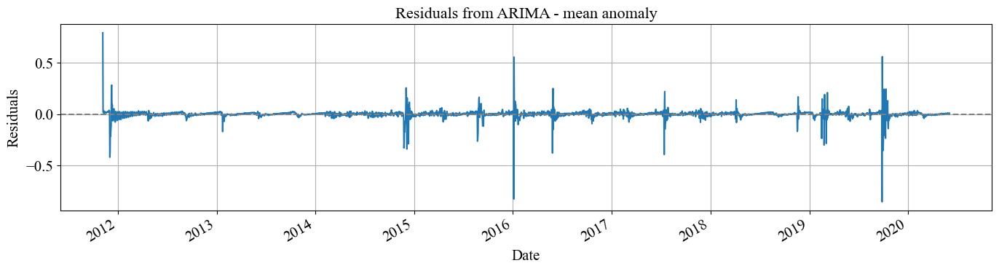

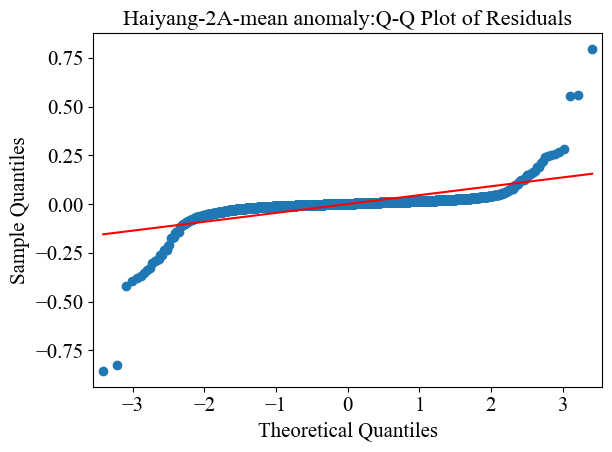


[SMOOTHED] Computing PR Curve – Haiyang-2A | mean anomaly | ±3 days


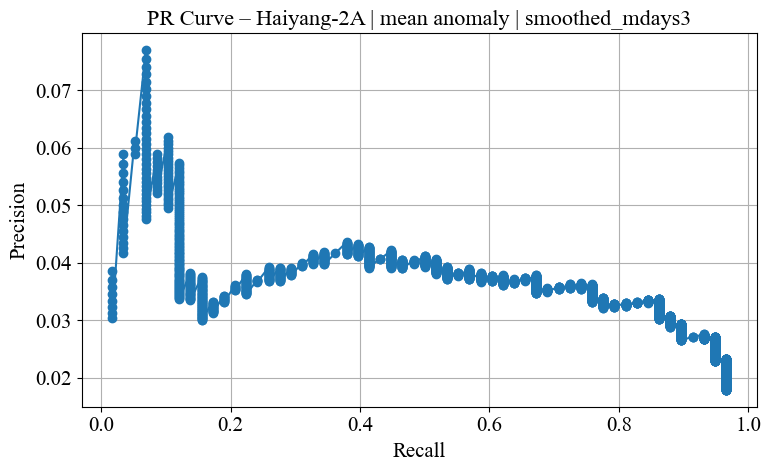

[SMOOTHED] | mdays=3 | Threshold=0.0174 | P=0.04 | R=0.50 | F1=0.08 | F2=0.15
[SMOOTHED] TP=29, FP=675, FN=29

[SMOOTHED] Computing PR Curve – Haiyang-2A | mean anomaly | ±5 days


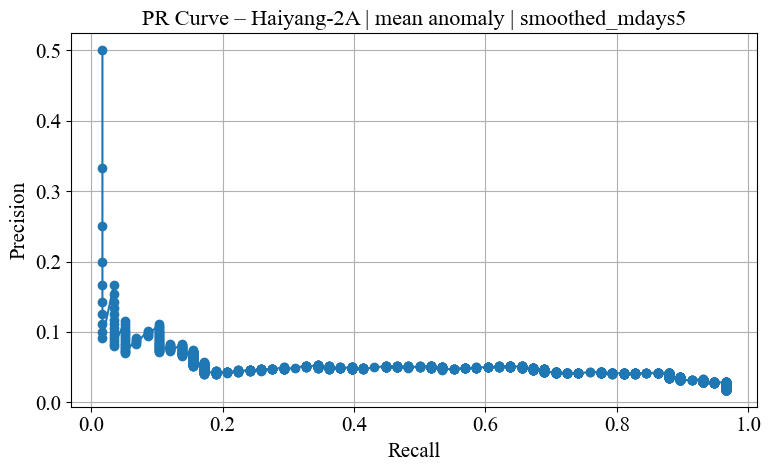

[SMOOTHED] | mdays=5 | Threshold=0.0172 | P=0.05 | R=0.64 | F1=0.10 | F2=0.20
[SMOOTHED] TP=37, FP=676, FN=21

[SMOOTHED] Using BEST mdays = ±5 for anomaly detection (F2 = 0.20)


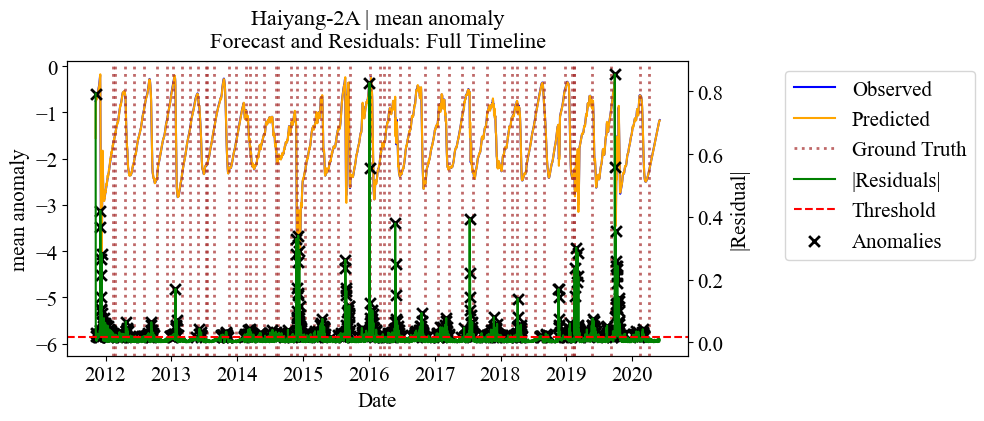

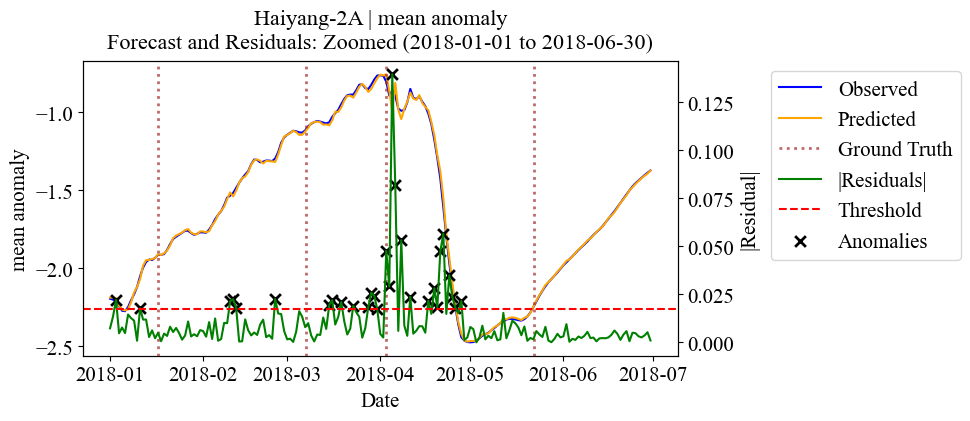

mean anomaly: 0 outliers flagged
Total interpolated outliers: 0
No outliers found: skipping cleaned ARIMA for Haiyang-2A | mean anomaly

==Forecasting and Anomaly Detection: Haiyang-2A | eccentricity ==


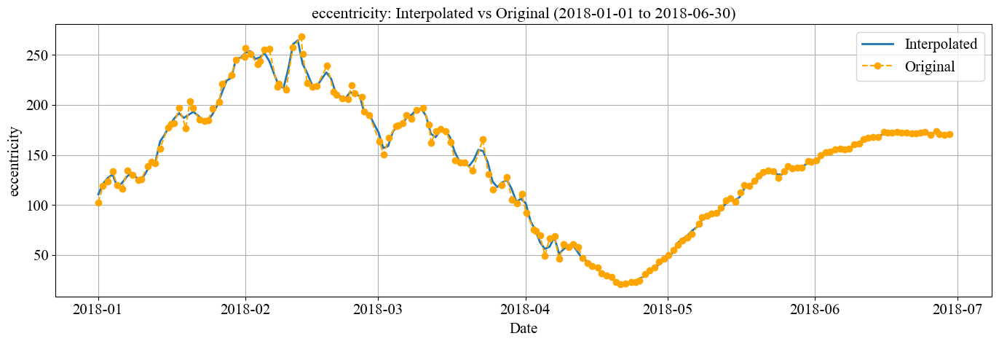

ADF p-value (d=0): 0.00000
Series is stationary at d=0
Best ARIMA Order: (7, 0, 9), AIC: 20843.32, Models Tried: 140, Time: 533.8s


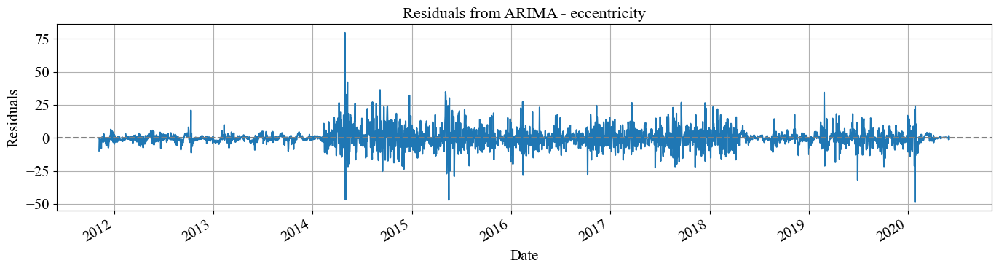

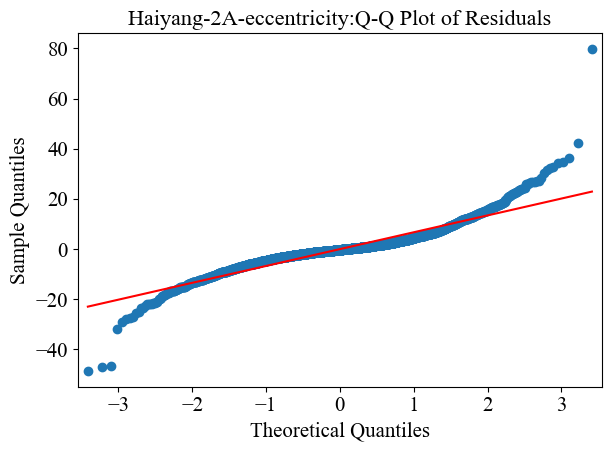


[RAW] Computing PR Curve - Haiyang-2A | eccentricity | ±3 days


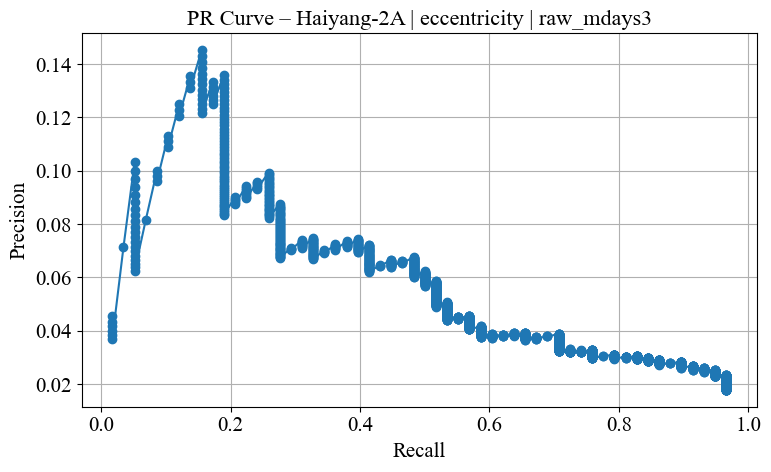

[RAW] | mdays=3 | Threshold=8.9100 | P=0.07 | R=0.48 | F1=0.12 | F2=0.22
[RAW] TP=28, FP=386, FN=30

[RAW] Computing PR Curve - Haiyang-2A | eccentricity | ±5 days


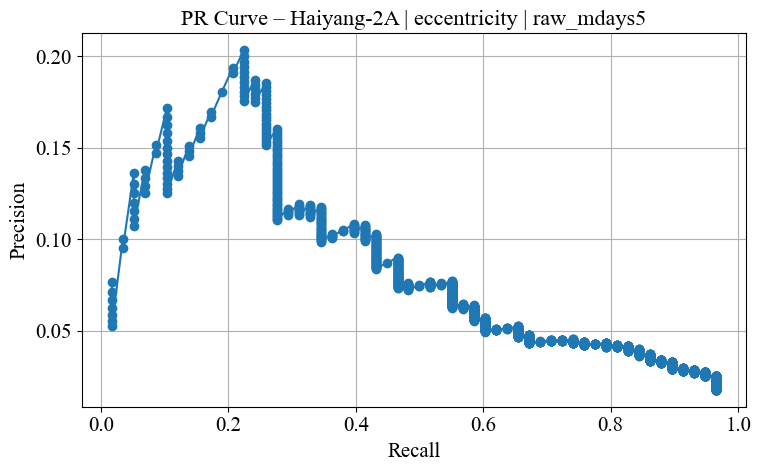

[RAW] | mdays=5 | Threshold=12.2911 | P=0.11 | R=0.41 | F1=0.17 | F2=0.26
[RAW] TP=24, FP=199, FN=34

[RAW] Using BEST mdays = ±5 for anomaly detection (F2 = 0.26)


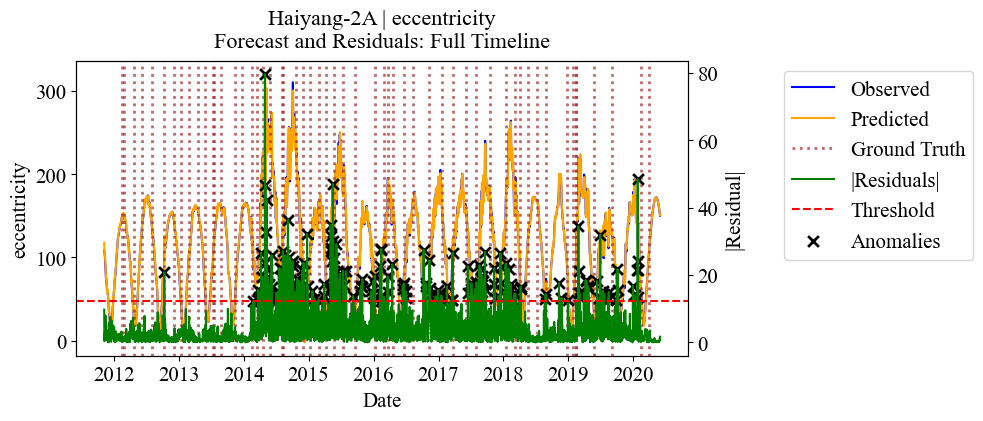

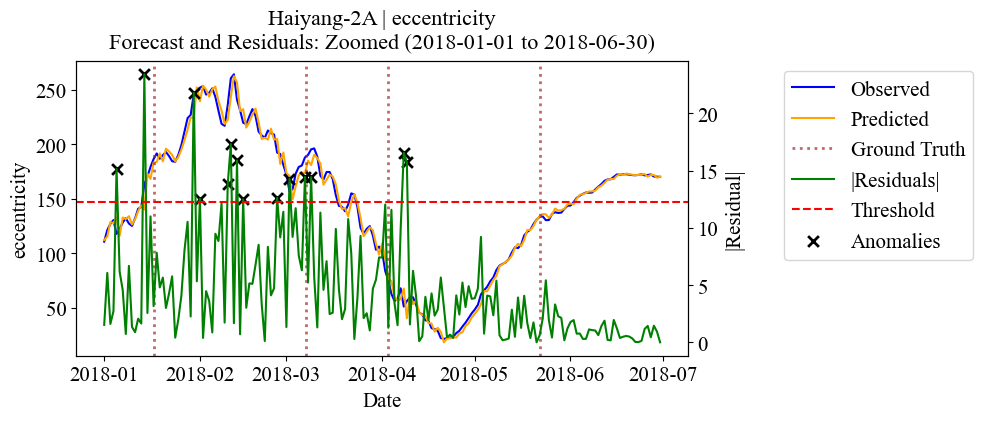


[SMOOTHED] Running smoothed ARIMA on Haiyang-2A | eccentricity
ADF p-value (d=0): 0.00000
Series is stationary at d=0
Best ARIMA Order: (2, 0, 11), AIC: 8741.30, Models Tried: 67, Time: 234.7s


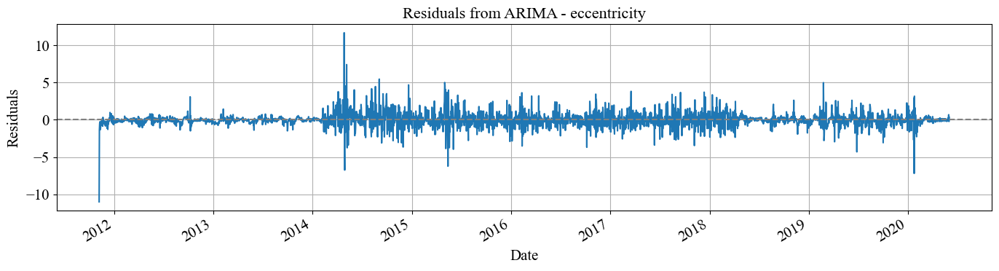

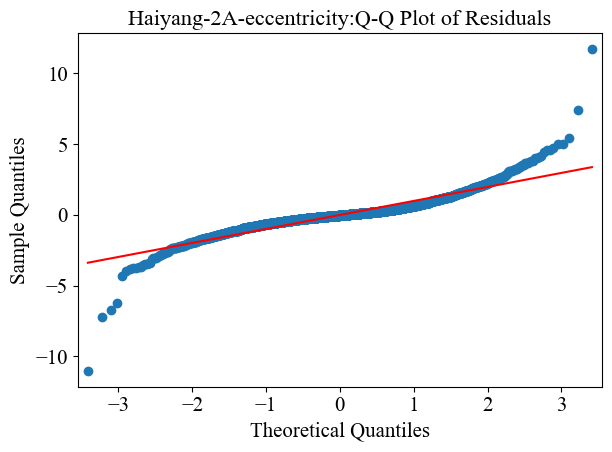


[SMOOTHED] Computing PR Curve – Haiyang-2A | eccentricity | ±3 days


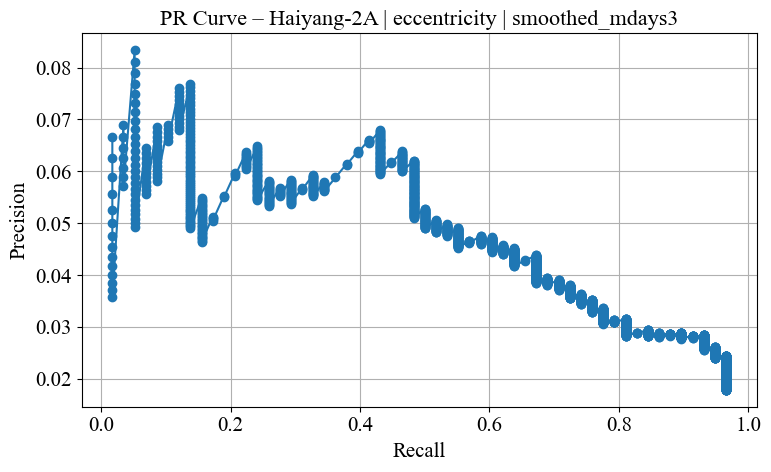

[SMOOTHED] | mdays=3 | Threshold=1.3506 | P=0.07 | R=0.43 | F1=0.12 | F2=0.21
[SMOOTHED] TP=25, FP=343, FN=33

[SMOOTHED] Computing PR Curve – Haiyang-2A | eccentricity | ±5 days


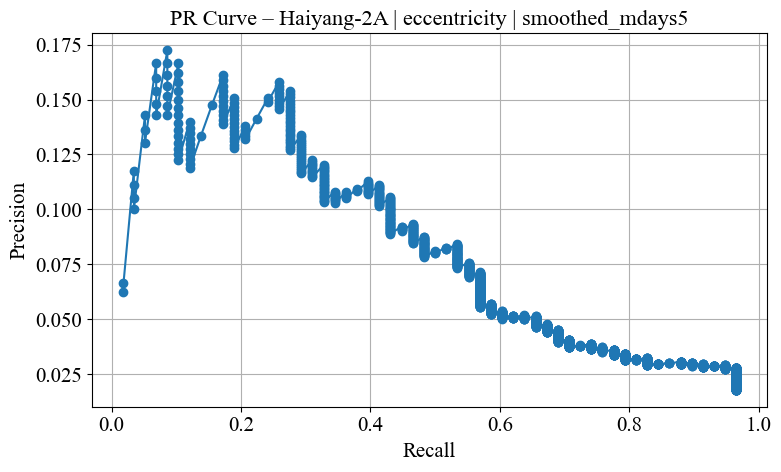

[SMOOTHED] | mdays=5 | Threshold=1.7540 | P=0.11 | R=0.41 | F1=0.18 | F2=0.27
[SMOOTHED] TP=24, FP=192, FN=34

[SMOOTHED] Using BEST mdays = ±5 for anomaly detection (F2 = 0.27)


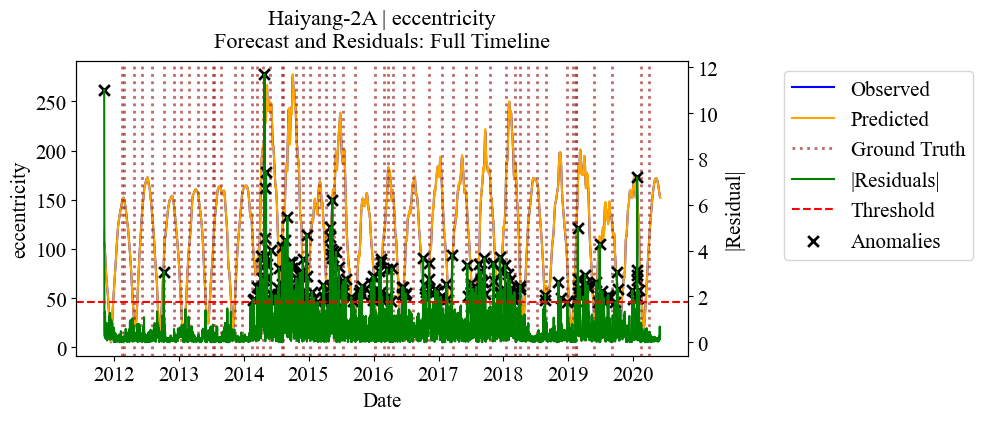

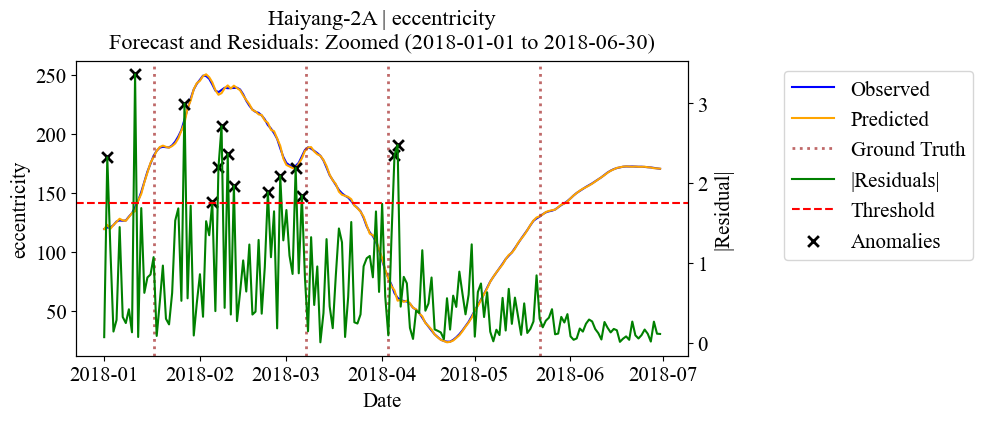

eccentricity: 0 outliers flagged
Total interpolated outliers: 0
No outliers found: skipping cleaned ARIMA for Haiyang-2A | eccentricity


In [2]:
matching_days_list = [3, 5]

for sat in satellites:
    satellite_name = sat["name"]
    csv_path = sat["csv_path"]
    man_csv = sat["maneuver_csv"]
    date_range = sat.get("date_range", None)

    for feature_name in features_to_forecast:
        print(f"\n==Forecasting and Anomaly Detection: {satellite_name} | {feature_name} ==")

        # Load and preprocess
        df_raw = fat.load_feature_data(csv_path, feature_name)
        df_raw = fat.exclude_initial_points(df_raw, num_points=30)
        df_interp = fat.interpolate_daily(df_raw)
        fat.plot_original_vs_interpolated(df_raw, df_interp, feature_name, date_range)

        # Ground truth
        man_df = pd.read_csv(man_csv, parse_dates=["start_time"])
        ground_truth_times = man_df["start_time"]
        tolerance = pd.Timedelta(days=1)

        # ADF + ARIMA (raw)
        d_values = fat.run_adf_test(df_interp[feature_name])
        aic_df_raw, model_raw, order_raw, aic_raw = fat.grid_search_arima(
            df_interp, d_values, satellite=satellite_name, feature=feature_name, suffix="raw")
        aic_df_raw["Satellite"] = satellite_name
        aic_df_raw["Feature"] = feature_name
        aic_df_raw[["Satellite", "Feature", "p", "d", "q", "aic"]].to_csv(aic_log_raw, mode='a', header=False, index=False)

        if model_raw:
            fitted_raw = model_raw.fittedvalues
            observed_raw = df_interp.squeeze()
            residuals_raw = observed_raw - fitted_raw

            fat.plot_residual_diagnostics(residuals_raw, feature_name, satellite=satellite_name, suffix="raw", save_path=output_path)

            # PR curves for all mdays (RAW)
            best_candidates_raw = []
            for mdays in matching_days_list:
                print(f"\n[RAW] Computing PR Curve - {satellite_name} | {feature_name} | ±{mdays} days")

                df_pr_raw, best_raw = fat.evaluate_and_log_precision_recall_arima(
                    residuals=residuals_raw.abs(),
                    ground_truth_times=ground_truth_times,
                    satellite=satellite_name,
                    feature=feature_name,
                    mode="raw",
                    matching_max_days=mdays,
                    save_path=output_path,
                    summary_log_path=summary_log_path,
                    selection_metric="f2",
                )


                best_raw["mdays"] = mdays
                best_candidates_raw.append(best_raw)
                pr_path = os.path.join(output_path, "arima", "prplots", satellite_name, f"prplot_{satellite_name}_{feature_name}_raw_mdays{mdays}".replace(" ", "_") + ".png")
                

            best_overall_raw = max(best_candidates_raw, key=lambda x: x["f2"])
            print(f"\n[RAW] Using BEST mdays = ±{int(best_overall_raw['mdays'])} for anomaly detection (F2 = {best_overall_raw['f2']:.2f})")
            threshold_raw = best_overall_raw["threshold"]

            
            prt.log_best_pr_summary(
    summary_log_path,
    satellite=satellite_name,
    feature=feature_name,
    mode="raw",
    mdays=best_overall_raw["mdays"],
    best_metrics=best_overall_raw
)



            fat.plot_forecast_results_arima(
                observed=observed_raw,
                predicted=fitted_raw,
                residuals=residuals_raw,
                satellite=satellite_name,
                feature=feature_name,
                save_path=output_path,
                ground_truth_times=ground_truth_times,
                anomaly_times=best_overall_raw["anomalies"],
                threshold=threshold_raw,
                zoom_range=date_range,
                cleaned=False
            )

        

        # === SMOOTHED experiment ===

        aic_log_smoothed = os.path.join(log_folder, "aic_gridsearch_smoothed.csv")
        if not os.path.exists(aic_log_smoothed):
            with open(aic_log_smoothed, "w") as f:
                f.write("Satellite,Feature,p,d,q,AIC\n")

        print(f"\n[SMOOTHED] Running smoothed ARIMA on {satellite_name} | {feature_name}")
        fat.run_arima_on_smoothed_series(
            df_interp=df_interp,
            satellite=satellite_name,
            feature=feature_name,
            maneuver_times=ground_truth_times,
            date_range=date_range,
            matching_days_list=matching_days_list,
            output_path=output_path,
            summary_log_path=summary_log_path,
            aic_log_path=aic_log_smoothed,
            window=7 
        )



        # === Cleaned ARIMA (conditional) ===
        df_cleaned, outlier_mask = fat.clean_outliers_by_iqr(df_interp, iqr_factor=5.0, verbose=True)
        outlier_timestamps = outlier_mask.index[outlier_mask.any(axis=1)]
        matches_outlier = sum(any((outlier_timestamps >= gt - tolerance) & (outlier_timestamps <= gt + tolerance)) for gt in ground_truth_times)

        with open(outlier_overlap_log, 'a') as f:
            f.write(f"{satellite_name},{feature_name},{len(outlier_timestamps)},{matches_outlier}\n")

        if outlier_mask.any().any():
            print(f"Outliers found: running ARIMA on cleaned {satellite_name} | {feature_name}")
            aic_df_cleaned, model_cleaned, order_cleaned, aic_cleaned = fat.grid_search_arima(
                df_cleaned, d_values, satellite=satellite_name, feature=feature_name, suffix="cleaned")
            aic_df_cleaned["Satellite"] = satellite_name
            aic_df_cleaned["Feature"] = feature_name
            aic_df_cleaned[["Satellite", "Feature", "p", "d", "q", "aic"]].to_csv(aic_log_cleaned, mode='a', header=False, index=False)

            if model_cleaned:
                fitted_cleaned = model_cleaned.fittedvalues
                observed_cleaned = df_cleaned.squeeze()
                residuals_cleaned = observed_cleaned - fitted_cleaned

                fat.plot_residual_diagnostics(residuals_cleaned, feature_name, satellite=satellite_name, suffix="cleaned", save_path=output_path)

                # PR curves for all mdays (CLEANED)
                best_candidates_cleaned = []
                for mdays in matching_days_list:
                    print(f"\n[CLEANED] Computing PR Curve – {satellite_name} | {feature_name} | ±{mdays} days")
                    df_pr_cleaned, best_cleaned = fat.evaluate_and_log_precision_recall_arima(
                        residuals=residuals_cleaned.abs(),
                        ground_truth_times=ground_truth_times,
                        satellite=satellite_name,
                        feature=feature_name,
                        mode="cleaned",
                        matching_max_days=mdays,
                        save_path=output_path,
                        summary_log_path=summary_log_path,
                        selection_metric="f2"
                    )


                    best_cleaned["mdays"] = mdays
                    best_candidates_cleaned.append(best_cleaned)
                    pr_path = os.path.join(output_path, "arima", "prplots", satellite_name, f"prplot_{satellite_name}_{feature_name}_cleaned_mdays{mdays}".replace(" ", "_") + ".png")
                    

                best_overall_cleaned = max(best_candidates_cleaned, key=lambda x: x["f2"])
                print(f"\n[CLEANED] Using BEST mdays = ±{int(best_overall_cleaned['mdays'])} for anomaly detection (F2 = {best_overall_cleaned['f2']:.2f})")
                threshold_cleaned = best_overall_cleaned["threshold"]

                prt.log_best_pr_summary(
                    summary_log_path,
                    satellite=satellite_name,
                    feature=feature_name,
                    mode="cleaned",
                    mdays=best_overall_cleaned["mdays"],
                    best_metrics=best_overall_cleaned
                )



                fat.plot_forecast_results_arima(
                    observed=observed_cleaned,
                    predicted=fitted_cleaned,
                    residuals=residuals_cleaned,
                    satellite=satellite_name,
                    feature=feature_name,
                    save_path=output_path,
                    ground_truth_times=ground_truth_times,
                    anomaly_times=best_overall_cleaned["anomalies"],
                    threshold=threshold_cleaned,
                    zoom_range=date_range,
                    cleaned=True
                )

        else:
            print(f"No outliers found: skipping cleaned ARIMA for {satellite_name} | {feature_name}")
